In [1]:
import os
import pandas as pd
import numpy as np
import sklearn.tree
from sklearn.model_selection import RandomizedSearchCV
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb

sns.set_palette('Set2') #set colorblind-friendly palette for seaborn
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
mpl.rc('figure', max_open_warning = 0)

<IPython.core.display.Javascript object>

In [ ]:
#this is the kusto query to get any of this app data, simply switch out the app name

# // Grabs all windows and web versions from table, need to specify the x == and y contains, or x == and y contains twice
# // for Teams, it appears as though we only have data since last October, interesting, it reflects the same info on Sensei
EndUserAppNPS()
|where Feedback_Source contains 'Powerpoint' and Feedback_Platform contains 'Windows' 
or Feedback_Source contains 'Powerpoint' and Feedback_Platform contains 'Web'
| where Feedback_DateTime >= datetime('2019-05-01')
| order by Feedback_DateTime asc 

# Driver Analysis Program
- I have written the below class to take care of every aspect of the driver analysis, that way this code does all the heavy lifting for you and you simply need to use its methods to perform all the analyses. Each function inside of this class acts as a method that should be tacked onto the end of the "driver_analysis" command.
- For example: if I want to use the program to find the top 10 drivers for me, I would write
    - top_10_drivers = driver_analysis.find_drivers(name_of_dataframe, title_of_plot)
- Using this code would result in you havinga dataframe with only the top 10 variables for your target (decided by the variables with the largest number of splits in your model), along with two plots, one showing the number of times each of these variables was used to split on, another converting this to a percentage of total splits.

In [632]:
#just create a class to take care of all of this analysis rather than having separate functions
class driver_analysis:
    
    '''
    
    This class contains a collection of all functions written for conducting a driver analysis for any app or all of suite
    
    '''
    
    def __init__(self, df):
        
        df = df
        
    #remove columns from data that are missing all or almost all of their data (in this case more than half)
    def remove_completely_missing_columns(df, missing_tolerance):
    
        '''this function removes all columns that are missing more than x% of all values'''
    
    
        #create missingness df
        missingness = pd.DataFrame(df.isna().sum()).reset_index().rename(columns = {'index':'column', 0:'num_missing'})

        print(f'shape before deleting missing columns: {df.shape}')
        #find columns that are missing all of their data and drop them
        all_missing = []
        for idx, row in missingness.iterrows():
            #filter out columns missing most of their values
            if row[1] > (missing_tolerance * df.shape[0]):
                all_missing.append(row[0])

        #drop these columns
        df = df.drop([x for x in all_missing], axis = 1)

        print(f'shape after deleting missing columns: {df.shape}')
    
        return df
    
    
    def target_encoder(df, column, target, index=None, method='mean'):

        """

        Target-based encoding is numerization of a categorical variables via the target variable. Main purpose is to deal
        with high cardinality categorical features without exploding dimensionality. This replaces the categorical variable
        with just one new numerical variable. Each category or level of the categorical variable is represented by a
        summary statistic of the target for that level.

        Args:

            df (pandas df): Pandas DataFrame containing the categorical column and target.
            column (str): Categorical variable column to be encoded.
            target (str): Target on which to encode.
            index (arr): Can be supplied to use targets only from the train index. Avoids data leakage from the test fold
            method (str): Summary statistic of the target. Mean, median or std. deviation.
            
        Returns:

            arr: Encoded categorical column.



        """



        index = df.index if index is None else index # Encode the entire input df if no specific indices is supplied



        if method == 'mean':

            encoded_column = df[column].map(df.loc[index].groupby(column)[target].mean())

        elif method == 'median':

            encoded_column = df[column].map(df.loc[index].groupby(column)[target].median())

        elif method == 'std':

            encoded_column = df[column].map(df.loc[index].groupby(column)[target].std())

        else:

            raise ValueError("Incorrect method supplied: '{}'. Must be one of 'mean', 'median', 'std'".format(method))



        return encoded_column
    
    #updated this for app from suite, just had to add in a couple of columns that weren't in this originally
    def throw_out_useless_features(df):
    
        '''
    
        There are several features that Manoj doesn't want in the analysis (i.e. locators since every geo feature rolls up to region), so I am creating a function
        that takes care of this since I have to do it so often
    
        '''
    
        print(f'Shape before: {df.shape}')
        
        #get rid of features that we know from Surface analysis that Manoj definitely does not want in the model
        features = pd.DataFrame(df.columns).rename(columns = {0:'features'})

        features = features[~features['features']\
        .str.contains('Feedback_ID|Date|Feedback_Verbatim|Feedback_SurveyName|Scale|Locale|Feedback_SurveyFlightName|'\
                  'IsValid|Language|SourceVerbatim|Ocv|Country|State|OsName|User_SurveyId|Enabled')]

        features = features[~features['features']\
        .str.contains('User_CommercialTenantName|MSSalesTopParent|Market|ResellerName|Tenant_Name|City|'\
                  'OrgName|OrgId|Unnamed|TenantName|TenantID|OfferList|Time|LastUpdated|Feedback_Platform')]

        features = features[~features['features']\
        .str.contains('Postal|Currency|SubsidiaryName|SubRegion|Cluster|RegionName|AreaName|Big|VerticalName|'\
                  'SegmentName|GroupName|ATUName|Territory|TenantId|Month|Rating_y|App_y|AppModeExt|Host')]

        features = features[~features['features']\
        .str.contains('CompanyName|GPName|SignupRegion|AreaName|TeamName|Verbatim_Details|Verbatim_Themes|NPS|'\
                  'Fork|NgramThemePrediction|DistrictId|Since|Start|End|Ngrams|Rating_x|PremierSchedule|SubsidiaryId')]

        #subset the df 
        df = df[[x for x in features['features']]]
    
        print(f'Shape after throwing out useless features: {df.shape}')
    
        return df
    
    def plot_cats(df, nps, subset = None):
    
        '''
    
        This function takes a df as an argument, it plots categorical features, if a categorical feature has more than 40 levels then it simply
        performs a groupby and chooses the top 20 from that feature's value counts, indications of this will be in the title of the resulting plot
    
        '''
    
        #loop through and plot each cat feature with less than 40 levels
        for feature in df.columns:
        
            if (df[feature].nunique() < 40) & (feature != 'Feedback_RatingValue') & (df[feature].dtype == 'O'): # don't want to plot feedback rating value
        
                plt.figure(figsize = (20, 7))
        
                df.groupby(df[feature]).Feedback_RatingValue.mean().sort_values().plot(kind = 'bar')
        
                plt.title(f'NPS by {feature}', fontsize = 16)
        
                plt.xlabel(f'{feature}', fontsize = 14)
        
                plt.ylabel('Average NPS Score', fontsize = 14)
            
                plt.axhline(y=nps, color = 'tab:blue', linestyle = '--', linewidth = 2)#create lineplot for NPS trend overall
            
                #if a feature has more than 20 levels, rotate this much    
                if df[feature].nunique() > 20:
            
                    plt.xticks(rotation = 60)
                else:
            
                    plt.xticks(rotation = 20)
            
                #add annotated legend depending on if data is suite or app
                if subset == 'web':
                
                    plt.legend(labels = ['2020 AVG Web NPS'], fontsize = 14)
            
                elif subset == 'windows':
                
                    plt.legend(labels = ['2020 AVG Windows NPS'], fontsize = 14)
                
            elif (df[feature].nunique() > 40) & (df[feature].dtype == 'O'):
            
                #plotting top 20 device models by NPS score 
                top_20 = pd.DataFrame(df[f'{feature}'].value_counts().nlargest(20)).index
            
                #creating df for levels in the top 20
                plt_df = df[df[f'{feature}'].isin(top_20)]
            
                #creating figure size
                plt.figure(figsize = (20, 7))
            
                #plotting on a categorical variable using groupby
                plt_df.groupby(f'{feature}').Feedback_RatingValue.mean().sort_values().plot(kind = 'bar')
            
                #create title
                plt.title(f'NPS by Top 20 {feature}', fontsize = 16)
            
                #create y label
                plt.ylabel('Average NPS Score', fontsize = 14)
            
                #create x label
                plt.xlabel(f'{feature}', fontsize = 14)
            
                plt.axhline(y=nps, color = 'tab:blue', linestyle = '--', linewidth = 2)#create lineplot for NPS trend overall
            
                if subset == 'web':
            
                    plt.legend(labels = ['2020 AVG Web NPS'], fontsize = 14)
                
                elif subset == 'windows':
                
                    plt.legend(labels = ['2020 AVG Windows NPS'], fontsize = 14)
            
                #setting x tick rotation for longer names to be visible and not overlap
                plt.xticks(rotation = 65);
                
            
    def plot_nums(nps, df, feature, subset, title, xlabel, bins, labels = None, method = None):
    
        '''
    
        This function takes a df, feature, binsize (or individual bins when using cut), labels (again, if using cut pass a list of labels), and method
        It then plots the feature accordingly
    
        '''
    
        #if you are going to use qcut
        if method is 'qcut':
            
            plt.figure(figsize = (15, 7))
                
            ax = df.groupby(pd.qcut(df[feature], bins, duplicates = 'drop')).Feedback_RatingValue.mean().plot(kind = 'bar')
                
            plt.title(title, fontsize = 16)
                
            plt.xlabel(xlabel, fontsize = 14)
                
            plt.ylabel('Average NPS Score')
        
            plt.axhline(y=nps, color = 'tab:blue', linestyle = '--', linewidth = 2)#create lineplot for NPS trend overall
        
            if subset == 'web':
            
                ax.legend(labels = ['2020 AVG Web NPS'], fontsize = 14)
            
            elif subset == 'windows':
            
                ax.legend(labels = ['2020 AVG Windows NPS'], fontsize = 14)
            
            plt.xticks(list(range(0, bins)), labels, rotation = 50);
        
        #if you are going to use cut (for descretizing features with greater control over bins)
        elif method is 'cut':
            
            plt.figure(figsize = (15, 7))
                
            ax = df.groupby(pd.cut(df[feature], bins = bins, labels = labels)).Feedback_RatingValue.mean().plot(kind = 'bar')
                
            plt.title(title, fontsize = 16)
                
            plt.xlabel(xlabel, fontsize = 14)
                
            plt.ylabel('Average NPS Score', fontsize = 14)
        
            plt.axhline(y=nps, color = 'tab:blue', linestyle = '--', linewidth = 2)#create lineplot for NPS trend overall
        
            if subset == 'web':
            
                ax.legend(labels = ['2020 AVG Web NPS'], fontsize = 14)
        
            elif subset == 'windows':
            
                ax.legend(labels = ['2020 AVG Windows NPS'], fontsize = 14)
            
            plt.xticks(rotation = 20);
                
    def plot_promoter_and_detractor_percentages(df):
        
        '''
        
        This function plots the percentage of each group's detractors, passives, and promoters
        
        '''
    
        for feature in df.select_dtypes(include = 'object').columns:
    
            if df[feature].nunique() > 40:
            
                top_20 = pd.DataFrame(df[feature].value_counts().nlargest(20)).index
            
                plt_df = df[df[feature].isin(top_20)]
            
                counts = (plt_df.groupby(['Feedback_RatingValue'])[feature].value_counts(normalize = True).rename('percentage').mul(100).reset_index())
            
                plt.figure(figsize = (25, 8))
            
                ax = sns.barplot(x = feature, y = 'percentage', hue = counts['Feedback_RatingValue'].map({-100:'Detractors', 0:'Passives', 100:'Promoters'}), data = counts,
                        order = counts.iloc[counts[counts['Feedback_RatingValue'] == 100]['percentage'].sort_values().index][feature])
            
                plt.title(f'Top 20 {feature} Detractors, Passives, and Promoters', fontsize = 22)
            
                plt.xticks(rotation = 70, fontsize = 10)
                
                plt.xlabel(f'{feature}', fontsize = 14)
                
                plt.ylabel('Percentage', fontsize = 14)

            
            elif df[feature].nunique() < 40:
            
                counts = (df.groupby(['Feedback_RatingValue'])[feature].value_counts(normalize = True).rename('percentage').mul(100).reset_index())
            
                plt.figure(figsize = (25, 8))
            
                ax = sns.barplot(x = feature, y = 'percentage', hue = counts['Feedback_RatingValue'].map({-100:'Detractors', 0:'Passives', 100:'Promoters'}), data = counts,
                        order = counts.iloc[counts[counts['Feedback_RatingValue'] == 100]['percentage'].sort_values().index][feature])
            
                plt.title(f'{feature} Detractors, Passives, and Promoters', fontsize = 22)
            
                plt.xticks(rotation = 70, fontsize = 10)
                
                plt.xlabel(f'{feature}', fontsize = 14)
                
                plt.ylabel('Percentage', fontsize = 14)
                
                
    def get_top_10_feats(df, web_or_windows = None, subset = None):
    
        '''
    
        This function takes an input of a dataframe of feature importances from the modeling function, then it subsets the df for those features only, returning a 
        df of 10 features and NPS scores
    
        '''
    
        top_10 = [x for x in df.iloc[:10, 0].reset_index()['Features']]
    
        new_df = web_or_windoes[web_or_windows['NgramThemePredictions'] == subset]
    
        new_df = pd.concat([new_df[top_10], new_df['Feedback_RatingValue']], axis = 1)
    
        return new_df
    
    def web_and_windows_slicer(filepath, csv):
    
        '''
    
        This function takes a filepath and a csv filename as arguments and slices that df up into web and windows datasets, this is useful if you are performing analyses on 
        web and windows dfs only, it provides you with 6 dfs that you can name whatever you want that will be 3 web and 3 windows dfs, one each for consumer,
        commercial edu, and commercial nonedu, if your dataset is missing windows or web data then it will simply result in an empty df, but you must have 6 dfs for it to 
        unpack into or else it will throw an error
    
        Args: filepath = filepath where csv file is contained, csv = name of csv file in that filepath
    
        '''
    
        os.chdir(filepath)
    
        df = pd.read_csv(csv, low_memory = False)
    
        web = df[df['Feedback_Platform'].str.contains('Web')]
    
        windows = df[df['Feedback_Platform'].str.contains('Windows')]
    
        web_consumer = web[web['Feedback_UserType'] == 'Consumer']
    
        web_com = web[web['Feedback_UserType'] == 'Commercial']
    
        web_comedu = web_com[web_com['User_Commercial_HasEducation'] == 1.0]
    
        web_nonedu = web_com[web_com['User_Commercial_HasEducation'] == 0.0]
    
        windows_consumer = windows[windows['Feedback_UserType'] == 'Consumer']
                        
        windows_com = windows[windows['Feedback_UserType'] == 'Commercial']
                        
        windows_comedu = windows_com[windows_com['User_Commercial_HasEducation'] == 1.0]
                        
        windows_nonedu = windows_com[windows_com['User_Commercial_HasEducation'] == 0.0]
                        
        dfs = [web_consumer, web_comedu, web_nonedu, windows_consumer, windows_comedu, windows_nonedu]
                        
        dfs = [driver_analysis.remove_completely_missing_columns(df, .75) for df in dfs]
                        
        web_consumer, web_comedu, web_nonedu, windows_consumer, windows_comedu, windows_nonedu = dfs
                        
        return web_consumer, web_comedu, web_nonedu, windows_consumer, windows_comedu, windows_nonedu
    
    def read_entire_csv(filepath, filename):
        
        '''
        
        This function reads in a csv without slicing it up at all and removes features with a high amount of missingness
        
        '''
        
        import os
        
        os.chdir(filepath)
        
        df = pd.read_csv(filename, low_memory = False)
        
        df = driver_analysis.remove_completely_missing_columns(df, .75)
        
        return df
    
    def get_detractors_and_promoters(filepath, csv):
        
        '''
        
        This function splits up web and windows dfs (if they both exist) into detractors, passives, and promoters so that we can run the driver analysis,
        or plot these subsets, in more fine-grained detail. The arguments for this function are the same as the previosu function. This function returns a list
        of dfs that needs to be unpacked upon use of the function. i.e. df1, df2, df3 = dfs
        
        '''
        
        os.chdir(filepath)
    
        df = pd.read_csv(csv, low_memory = False)
    
        web = df[df['Feedback_Platform'].str.contains('Web')]
    
        windows = df[df['Feedback_Platform'].str.contains('Windows')]
    
        web_consumer = web[web['Feedback_UserType'] == 'Consumer']
    
        web_com = web[web['Feedback_UserType'] == 'Commercial']
    
        web_comedu = web_com[web_com['User_Commercial_HasEducation'] == 1.0]
    
        web_nonedu = web_com[web_com['User_Commercial_HasEducation'] == 0.0]
    
        windows_consumer = windows[windows['Feedback_UserType'] == 'Consumer']
                        
        windows_com = windows[windows['Feedback_UserType'] == 'Commercial']
                        
        windows_comedu = windows_com[windows_com['User_Commercial_HasEducation'] == 1.0]
                        
        windows_nonedu = windows_com[windows_com['User_Commercial_HasEducation'] == 0.0]
                        
        dfs = [web_consumer, web_comedu, web_nonedu, windows_consumer, windows_comedu, windows_nonedu]
                        
        dfs = [driver_analysis.remove_completely_missing_columns(df, .75) for df in dfs]
            
        for df in dfs:
                
            web_consumer_detractors = web_consumer[web_consumer['Feedback_RatingValue'] == -100]
            
            web_consumer_passives = web_consumer[web_consumer['Feedback_RatingValue'] == 0]
            
            web_consumer_promoters = web_consumer[web_consumer['Feedback_RatingValue'] == 100]
            
            web_comedu_detractors = web_comedu[web_comedu['Feedback_RatingValue'] == -100]
            
            web_comedu_passives = web_comedu[web_comedu['Feedback_RatingValue'] == 0]
            
            web_comedu_promoters = web_comedu[web_comedu['Feedback_RatingValue'] == 100]
            
            web_nonedu_detractors = web_nonedu[web_nonedu['Feedback_RatingValue'] == -100]
            
            web_nonedu_passives = web_nonedu[web_nonedu['Feedback_RatingValue'] == 0]
            
            web_nonedu_promoters = web_nonedu[web_nonedu['Feedback_RatingValue'] == 100]
            
            windows_consumer_detractors = windows_consumer[windows_consumer['Feedback_RatingValue'] == -100]
            
            windows_consumer_passives = windows_consumer[windows_consumer['Feedback_RatingValue'] == 0]
            
            windows_consumer_promoters = windows_consumer[windows_consumer['Feedback_RatingValue'] == 100]
            
            windows_comedu_detractors = windows_comedu[windows_comedu['Feedback_RatingValue'] == -100]
            
            windows_comedu_passives = windows_comedu[windows_comedu['Feedback_RatingValue'] == 0]
            
            windows_comedu_promoters = windows_comedu[windows_comedu['Feedback_RatingValue'] == 100]
            
            windows_nonedu_detractors = windows_nonedu[windows_nonedu['Feedback_RatingValue'] == -100]
            
            windows_nonedu_passives = windows_nonedu[windows_nonedu['Feedback_RatingValue'] == 0]
            
            windows_nonedu_promoters = windows_nonedu[windows_nonedu['Feedback_RatingValue'] == 100]
            
        if web_consumer_detractors.shape[1] == 0:
            
            dfs = [windows_consumer_detractors, windows_consumer_passives, windows_consumer_promoters, windows_comedu_detractors, windows_comedu_passives,
                  windows_comedu_promoters, windows_nonedu_detractors, windows_nonedu_passives, windows_nonedu_promoters]
            
        else:
            
            dfs = [web_consumer_detractors, web_consumer_passives, web_consumer_promoters, web_comedu_detractors, web_comedu_passives, web_comedu_promoters,
                  web_nonedu_detractors, web_nonedu_passives, web_nonedu_promoters, windows_consumer_detractors, windows_consumer_passives, windows_consumer_promoters, 
                  windows_comedu_detractors, windows_comedu_passives, windows_comedu_promoters, windows_nonedu_detractors, windows_nonedu_passives, windows_nonedu_promoters]
            
        return dfs       
    
    #model with LightGBM -- which accepts missingness with no special adaptation, this will truncate this process significantly
    def find_drivers(df, title):
        
        '''
        
        This function runs a set of features and target variables through two separate Light GBM models, the first extracts all feature importances
        and the second uses the top 10 features from the first to run a model that returns the feature importances for those ten variables controlling for
        one another (using the # of times that the decision trees split on that variable). The final output of this function are two plots of feature importances, along with 
        the df containing a subset of the data for the top 10 features.
        
        Args: arguments in this function are a set of features, the target variable column, the title of the feature importances plot that you want, and you also
        have the option to encode your features using mean target encoding if you have not dummy coded or otherwise encoded these variables in another way (this 
        functionality can also be used in other ways i.e. you can encode with the median if you want)
        
        '''
        
        #some of these dfs might not have "Feedback_Rating" in them
        if 'Feedback_Rating' in df.columns:
            
            features = df.drop(['Feedback_RatingValue', 'Feedback_Rating'], axis = 1)
            
        else:
            
            features = df.drop('Feedback_RatingValue', axis = 1)
        
        target = df['Feedback_RatingValue']
        
    
        #import lightgbm
        import lightgbm as lgb
        
        combined = driver_analysis.throw_out_useless_features(pd.concat([features, target], axis = 1))
        
        for col in combined.columns:
            
            if combined[col].dtype == 'O':
                
                combined[col] = driver_analysis.target_encoder(combined, column = col, target = 'Feedback_RatingValue', index = None, method = 'mean')
    
                encoded_features = combined.drop('Feedback_RatingValue', axis = 1)
    
                target = combined['Feedback_RatingValue']
        
        #instantiate model
        LGBMModel = lgb.LGBMClassifier(objective = 'multiclass').fit(encoded_features, target)
        
        param_grid = {'n_estimators': [50, 100, 250, 500, 750, 1000, 1250, 1500],#'max_features': ['auto', 'sqrt', 'log2'],
                  'max_depth': [2,5,10,25,None]}
    
        CV_lgb = RandomizedSearchCV(estimator=LGBMModel, n_jobs=-1, param_distributions=param_grid, verbose=10, scoring='neg_log_loss',cv= 5)
    
        CV_lgb.fit(encoded_features, target)
        
        n_estimators, max_depth = CV_lgb.best_params_.values()

        LGBMModel = lgb.LGBMClassifier(random_state = 0, n_estimators = n_estimators, max_depth = max_depth, objective = 'multiclass').fit(encoded_features, target)

        #getting feature importances greatest to least
        learners = LGBMModel.feature_importances_.argsort()[::-1]
    
        features_df = pd.DataFrame(encoded_features.columns[learners], LGBMModel.feature_importances_[learners])
    
        #only using features that had more than .015 splits
        feature_importances = features_df[features_df.index>0.005]
    
        #get top 10 features from feature importances to be fed into the next model
        top_10 = [x for x in feature_importances.iloc[:10, 0]]
    
        #subset features by the top 10 -- this begins the second stage of modeling
        encoded_features = encoded_features[top_10]
    
        #instantiate model
        LGBMModel = lgb.LGBMClassifier(objective = 'multiclass')
        
        param_grid = {'n_estimators': [50, 100, 250, 500, 750, 1000, 1250, 1500],#'max_features': ['auto', 'sqrt', 'log2'],
                  'max_depth': [2,5,10,25,None]}
    
        CV_lgb = RandomizedSearchCV(estimator=LGBMModel, n_jobs=-1, param_distributions=param_grid, verbose=10, scoring='neg_log_loss',cv= 5)
    
        CV_lgb.fit(encoded_features, target)
        
        n_estimators, max_depth = CV_lgb.best_params_.values()

        LGBMModel = lgb.LGBMClassifier(random_state = 0, n_estimators = n_estimators, max_depth = max_depth, objective = 'multiclass').fit(encoded_features, target)

        #getting feature importances greatest to least
        learners = LGBMModel.feature_importances_.argsort()[::-1]
        
        features_df = pd.DataFrame(encoded_features.columns[learners], LGBMModel.feature_importances_[learners])
    
        #only using features that had more than .005 splits
        feature_importances = encoded_features[encoded_features.index>0.005]
        
        important_df = pd.concat([features[top_10], target], axis = 1)
    
        importance_plot = lgb.plot_importance(LGBMModel, figsize = (12, 8), importance_type = 'split', ignore_zero = True, grid = False, title = title)
        
        features_df = features_df.iloc[:10, :]

        features_df.rename(columns = {0:'one'}, inplace = True)

        features_df.reset_index(inplace = True)

        features_df.rename(columns = {'index':'two'}, inplace = True)
        
        #create plot that uses feature importance splits to create percentage, per Manoj's request
        features_df['two'] = [x/sum(features_df['two']) for x in features_df['two']]
        
        plt.figure(figsize = (12, 7))
        sns.barplot(y = 'one', x = 'two', data = features_df, color = 'tab:blue') 
        plt.title(title, fontsize = 22)
        plt.xlabel('Split %', fontsize = 18)
        plt.ylabel('Features', fontsize = 18)
    
        return important_df

# Driver Analysis
- This analysis will consist of several different pieces for each application (including overall suite)
    - first, each section will have an overall driver analysis, with the top 10 variables for each segment plotted by number of splits, this will be done for both the web and windows versions of the application if both exist. The analysis will be completed for the consumer, commercial edu, and commercial non-edu segments of each application
    - second, the application (or overall suite) will be broken down into detractors, passives, and promoters for each of the applications, and the drivers will be plotted for those individually. These drivers will then be plotted with their respective NPS scores using barplots

## Outlook
- windows only

In [512]:
#unpack dfs into single vars--no web here, so we can name those arbitrarily
a, b, c, outlook_windows_consumer_drivers, outlook_windows_comedu_drivers, outlook_windows_nonedu_drivers = \
        driver_analysis.web_and_windows_slicer('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Outlook', 'Outlook_Windows.csv')

shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (58151, 321)
shape after deleting missing columns: (58151, 74)
shape before deleting missing columns: (12656, 321)
shape after deleting missing columns: (12656, 252)
shape before deleting missing columns: (73978, 321)
shape after deleting missing columns: (73978, 252)


In [327]:
#get detractors, passives and promoters for same dfs
outlook_nps_dfs = driver_analysis.get_detractors_and_promoters('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Outlook', 'Outlook_Windows.csv')

shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (58151, 321)
shape after deleting missing columns: (58151, 74)
shape before deleting missing columns: (12656, 321)
shape after deleting missing columns: (12656, 252)
shape before deleting missing columns: (73978, 321)
shape after deleting missing columns: (73978, 252)


In [634]:
#find drivers for outlook windows as a whole, without breaking it down into consumer, commercial
outlook_windows = driver_analysis.read_entire_csv('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Outlook', 'Outlook_Windows.csv')

shape before deleting missing columns: (145181, 321)
shape after deleting missing columns: (145181, 248)


## Outlook Windows NPS Profile
- This will be a driver analysis for Outlook Windows as a whole, the subsequent models will be driver analyses broken down into consumer, comercial edu, and commercial non-edu

Shape before: (145181, 247)
Shape after throwing out useless features: (145181, 162)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed: 28.1min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 49.8min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 55.0min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 62.5min remaining: 13.7min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 65.4min remaining:  4.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 66.1min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   49.8s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  8.4min remaining:  1.9min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 10.0min remaining:   38.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 10.0min finished


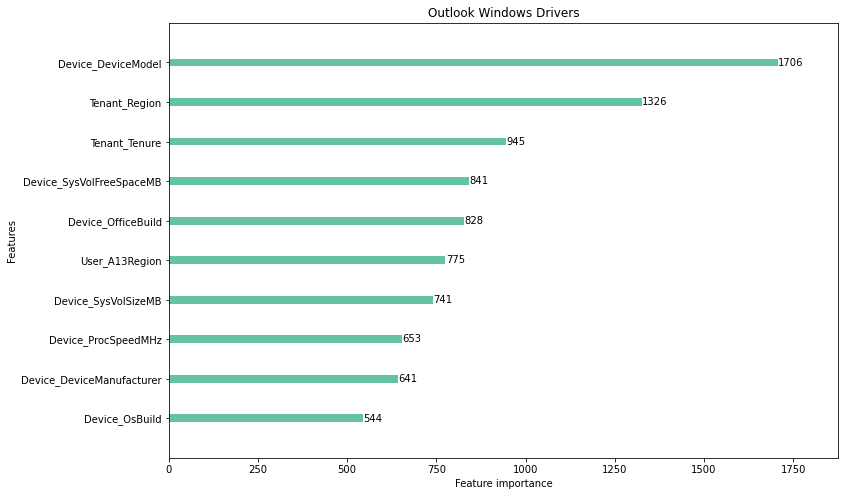

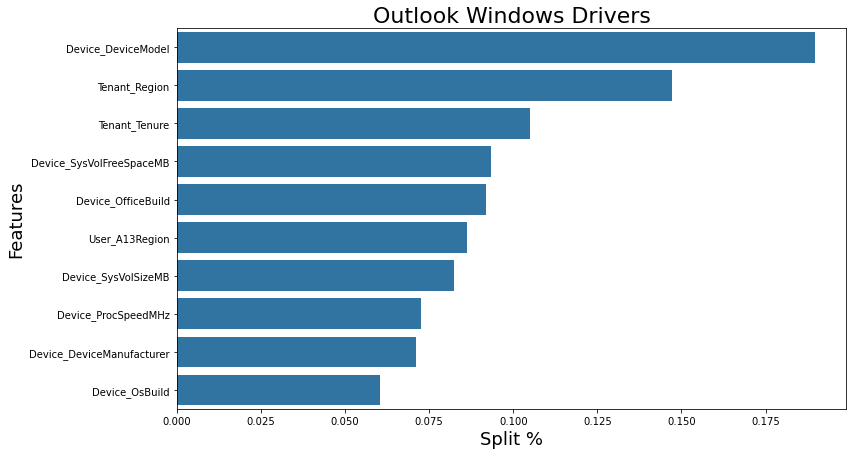

In [635]:
outlook_windows_drivers = driver_analysis.find_drivers(outlook_windows, 'Outlook Windows Drivers')

### Outlook Windows Consumer NPS Profile

Shape before: (58151, 73)
Shape after throwing out useless features: (58151, 43)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  3.9min remaining:   51.4s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.4min remaining:   16.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.7min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  4.1min remaining:   54.5s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.7min remaining:   18.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.8min finished


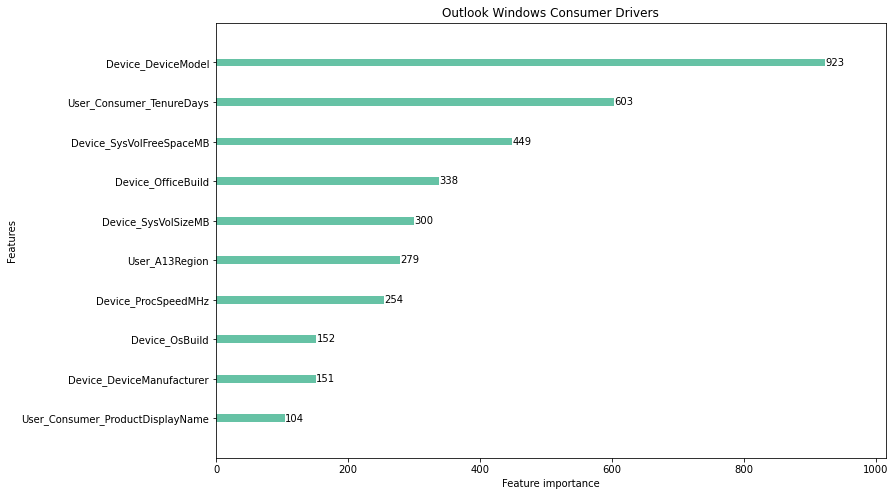

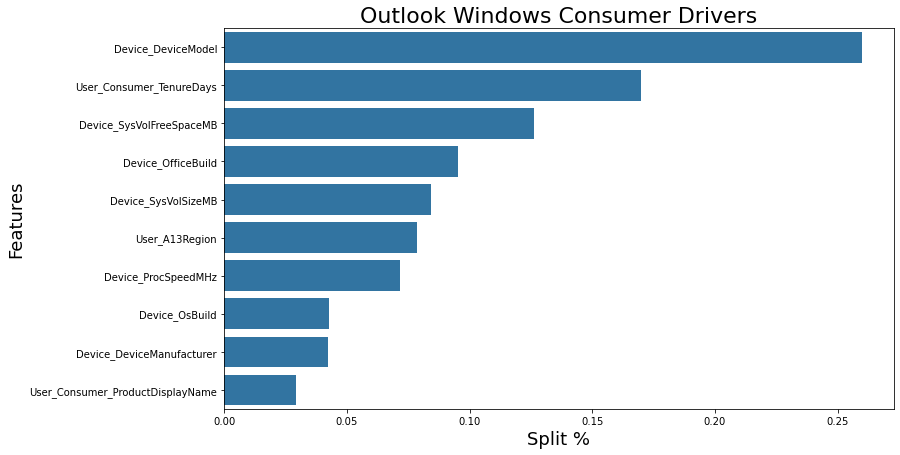

In [528]:
outlook_windows_consumer_drivers = driver_analysis.find_drivers(outlook_windows_consumer_drivers, 'Outlook Windows Consumer Drivers')

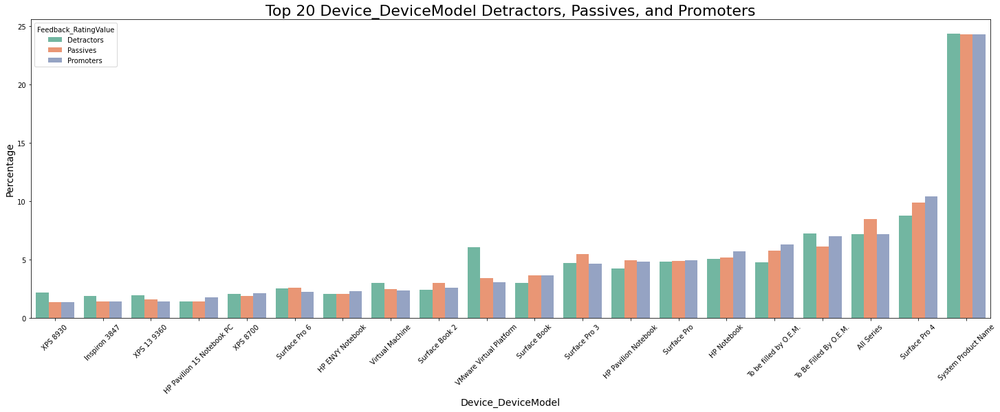

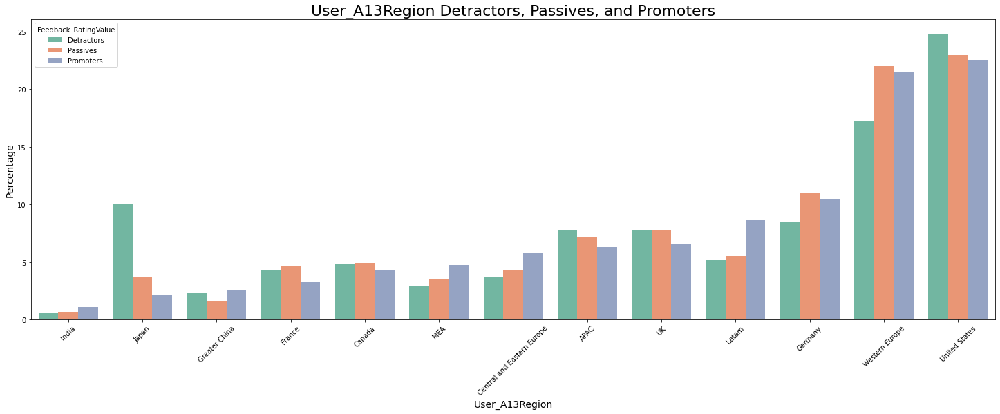

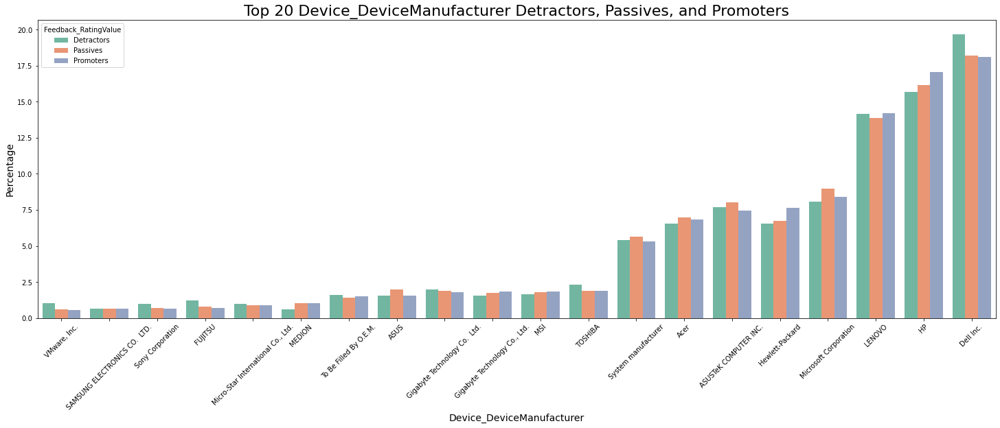

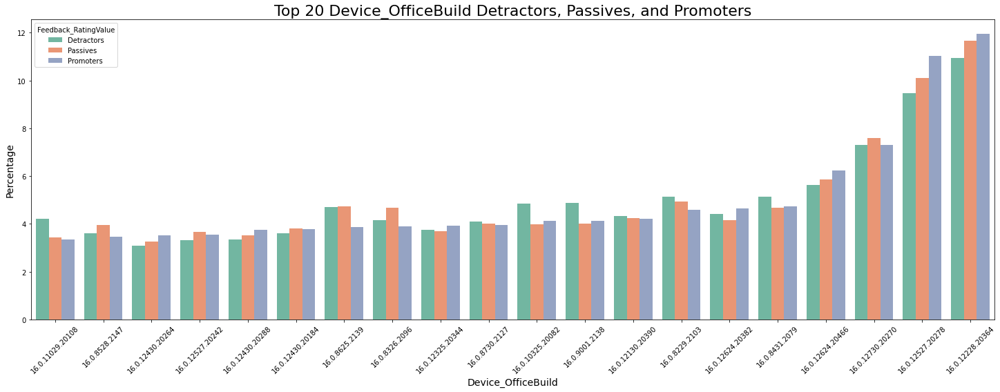

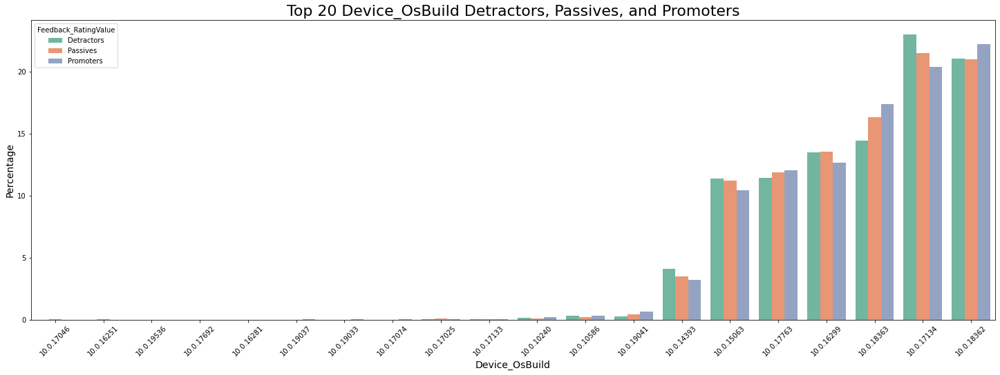

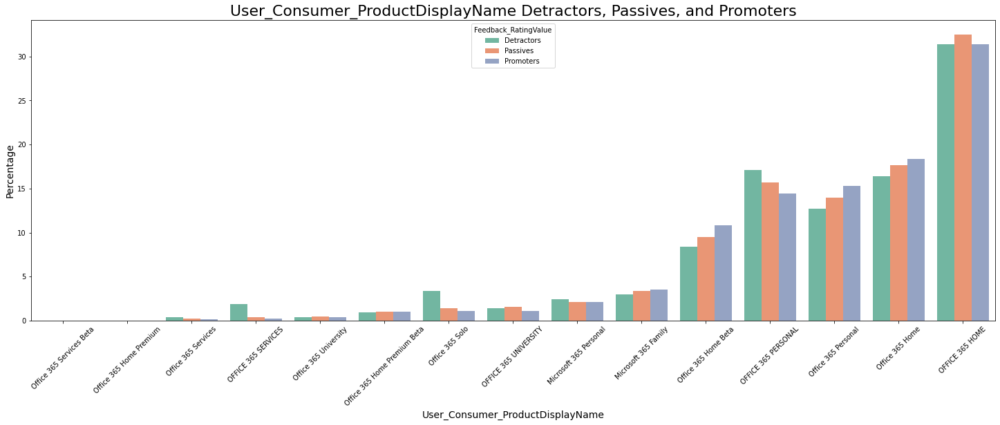

In [585]:
driver_analysis.plot_promoter_and_detractor_percentages(outlook_windows_consumer_drivers)

### Outlook Windows Commercial Edu NPS Profile

Shape before: (12656, 251)
Shape after throwing out useless features: (12656, 162)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 12.0min remaining:  2.6min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 15.3min remaining:   58.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 15.4min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   21.2s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  1.7min remaining:   22.3s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  1.9min remaining:    7.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.0min finished


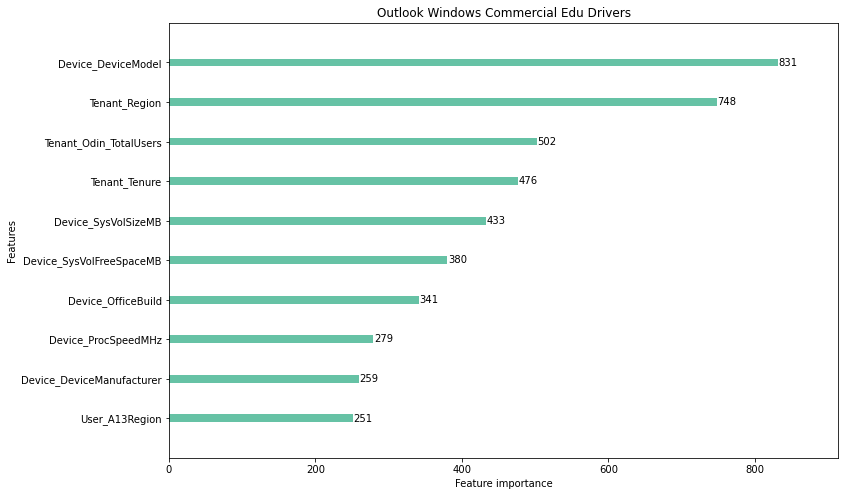

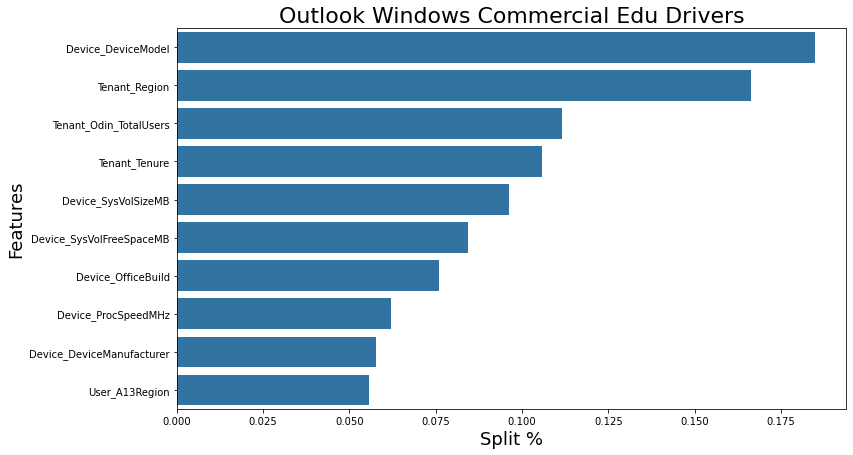

In [531]:
outlook_windows_comedu_drivers = driver_analysis.find_drivers(outlook_windows_comedu_drivers, 'Outlook Windows Commercial Edu Drivers')

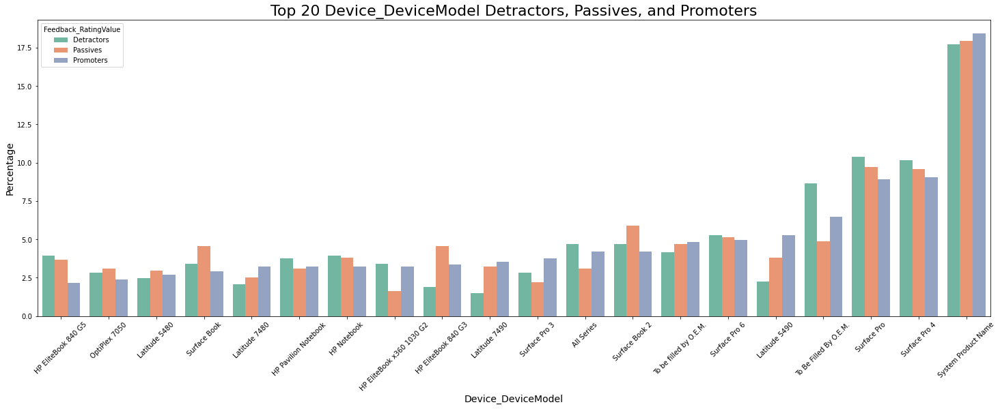

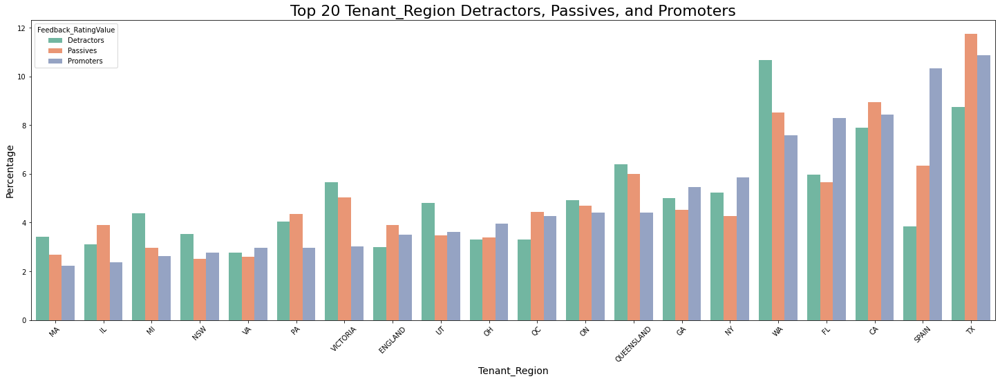

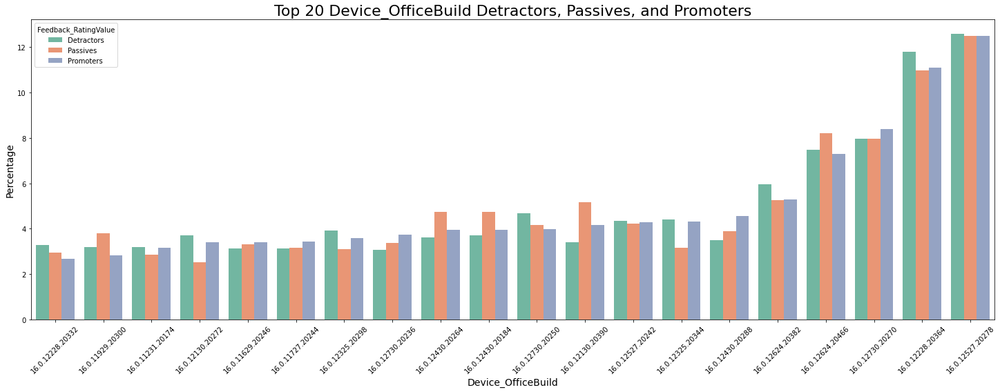

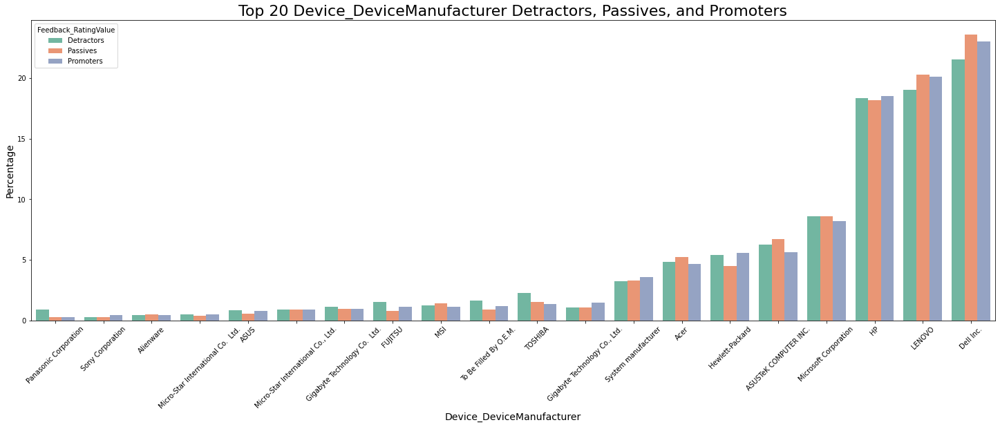

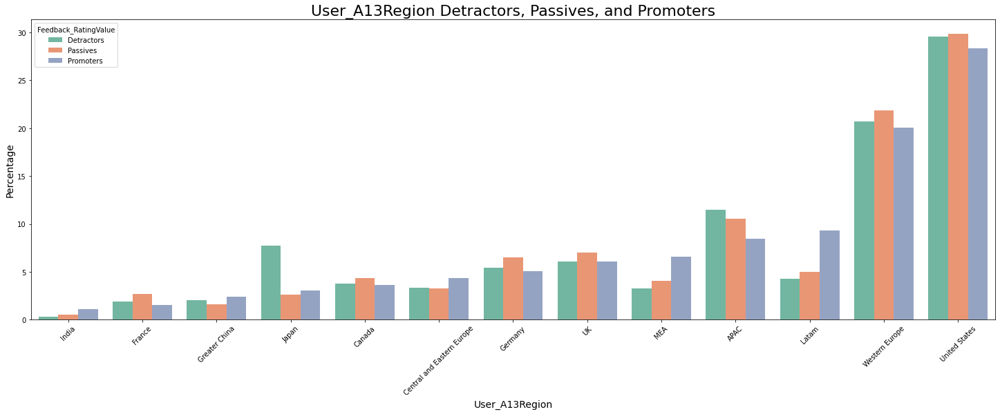

In [586]:
driver_analysis.plot_promoter_and_detractor_percentages(outlook_windows_comedu_drivers)

### Outlook Windows Commercial Non-Edu NPS Profile

Shape before: (73978, 11)
Shape after throwing out useless features: (73978, 11)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  2.1min remaining:   27.5s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  2.2min remaining:    8.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.2min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  6.1min remaining:  1.3min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  6.6min remaining:   25.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  6.8min finished


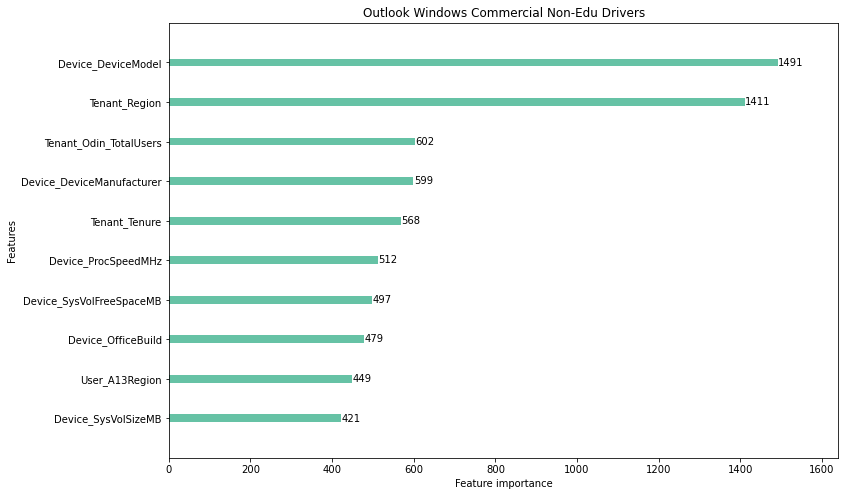

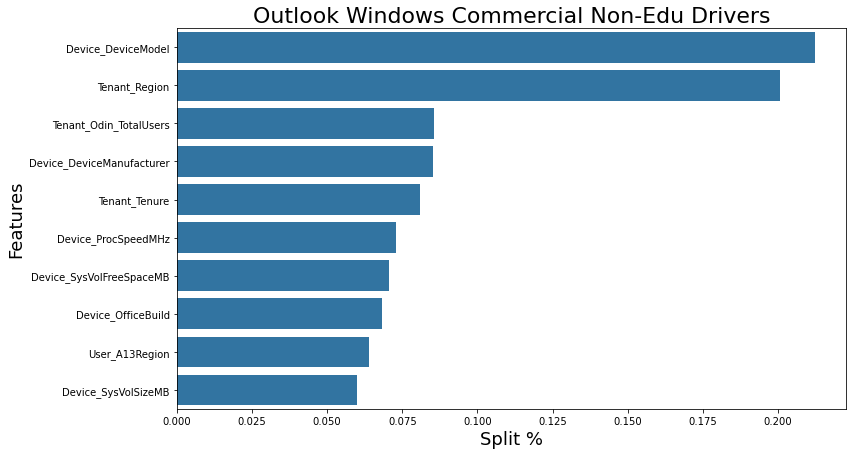

In [533]:
outlook_windows_nonedu_drivers = driver_analysis.find_drivers(outlook_windows_nonedu_drivers, 'Outlook Windows Commercial Non-Edu Drivers')

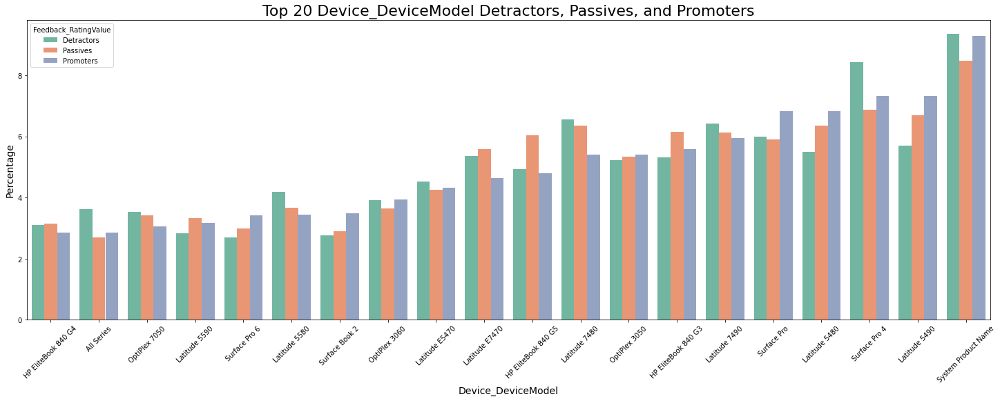

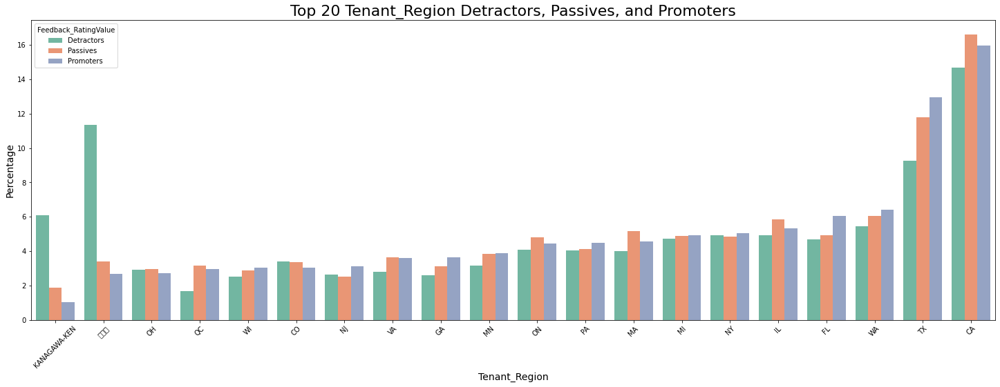

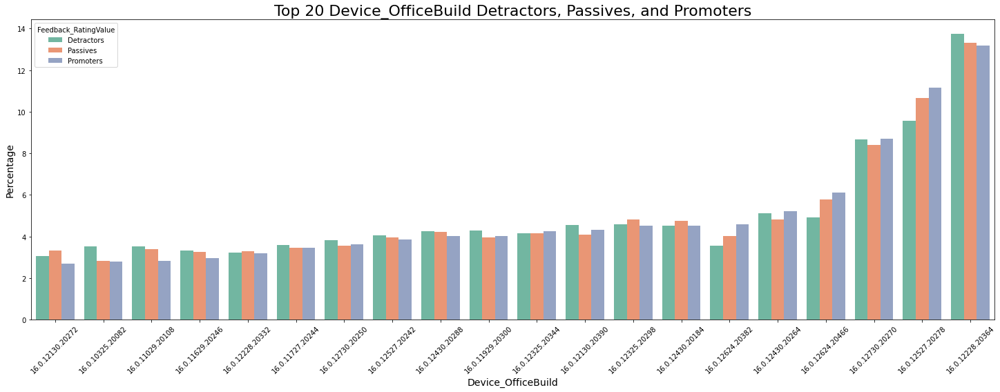

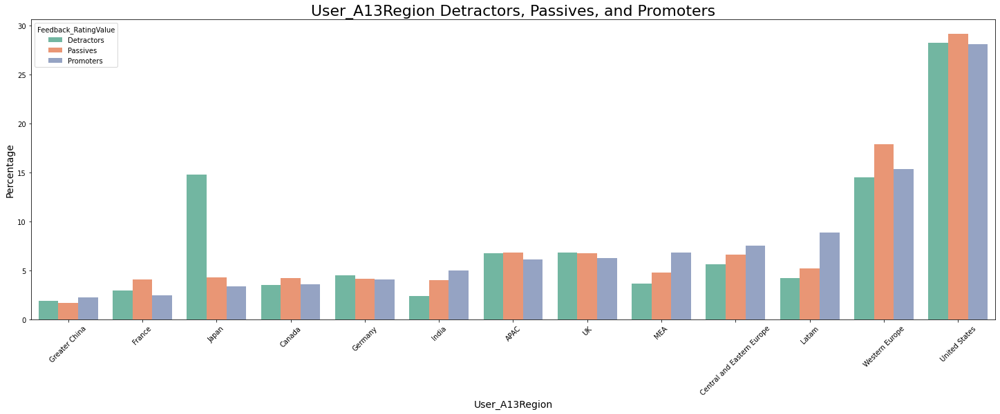

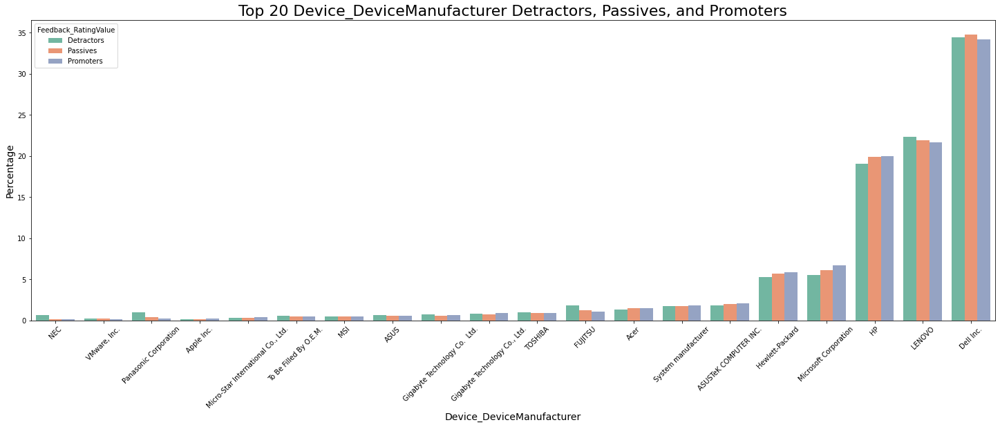

In [587]:
driver_analysis.plot_promoter_and_detractor_percentages(outlook_windows_nonedu_drivers)

# Excel
- web and windows

In [521]:
#get initial dfs split by web and windows
excel_web_consumer, excel_web_comedu, excel_web_nonedu, excel_windows_consumer, excel_windows_comedu, excel_windows_nonedu = \
                                                        driver_analysis.web_and_windows_slicer('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Excel', 'Excel_Windows_and_Web.csv')

shape before deleting missing columns: (22379, 321)
shape after deleting missing columns: (22379, 39)
shape before deleting missing columns: (19320, 321)
shape after deleting missing columns: (19320, 240)
shape before deleting missing columns: (100711, 321)
shape after deleting missing columns: (100711, 241)
shape before deleting missing columns: (25104, 321)
shape after deleting missing columns: (25104, 74)
shape before deleting missing columns: (7951, 321)
shape after deleting missing columns: (7951, 252)
shape before deleting missing columns: (28190, 321)
shape after deleting missing columns: (28190, 253)


In [329]:
#get nps specific dfs
excel_nps_dfs = driver_analysis.get_detractors_and_promoters('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Excel', 'Excel_Windows_and_Web.csv')

shape before deleting missing columns: (22379, 321)
shape after deleting missing columns: (22379, 39)
shape before deleting missing columns: (19320, 321)
shape after deleting missing columns: (19320, 240)
shape before deleting missing columns: (100711, 321)
shape after deleting missing columns: (100711, 241)
shape before deleting missing columns: (25104, 321)
shape after deleting missing columns: (25104, 74)
shape before deleting missing columns: (7951, 321)
shape after deleting missing columns: (7951, 252)
shape before deleting missing columns: (28190, 321)
shape after deleting missing columns: (28190, 253)


### Excel Web Consumer NPS Profile

Shape before: (22379, 38)
Shape after throwing out useless features: (22379, 13)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   31.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   55.9s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  1.7min remaining:   22.7s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  1.8min remaining:    6.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.9min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   20.1s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  1.4min remaining:   18.7s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  1.7min remaining:    6.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.9min finished


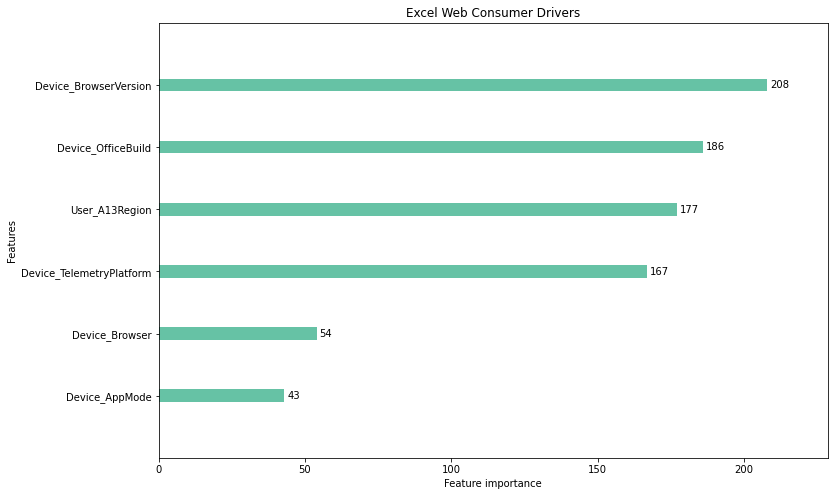

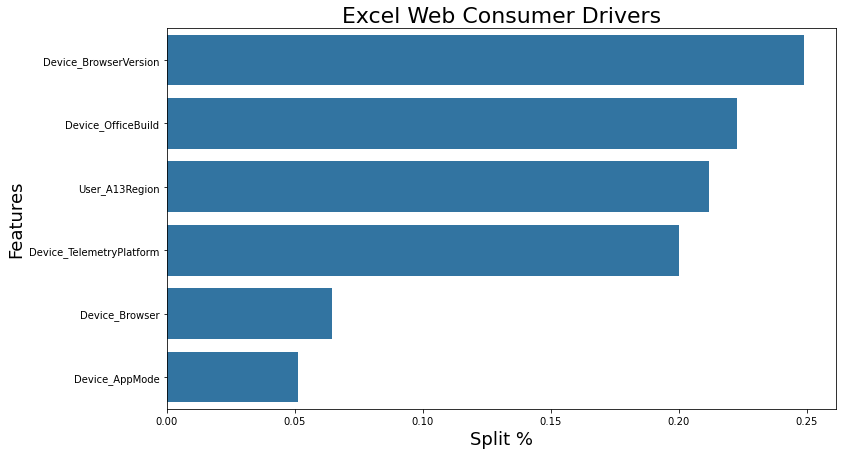

In [516]:
excel_web_consumer_drivers = driver_analysis.find_drivers(excel_web_consumer, 'Excel Web Consumer Drivers')

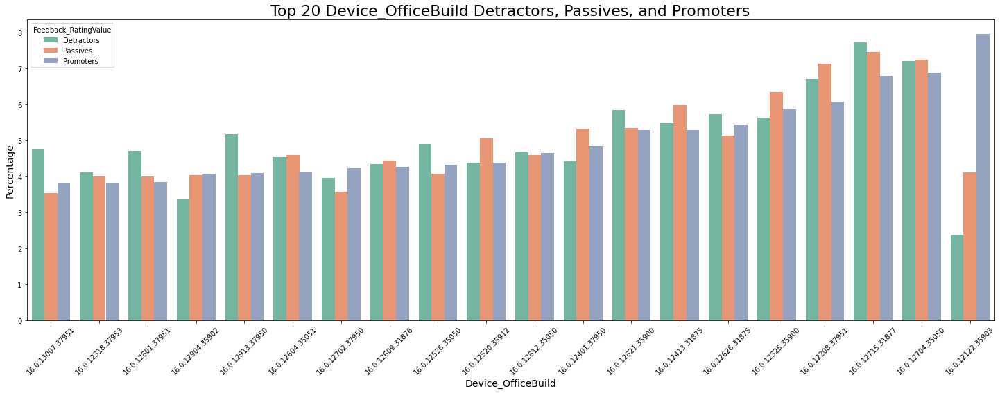

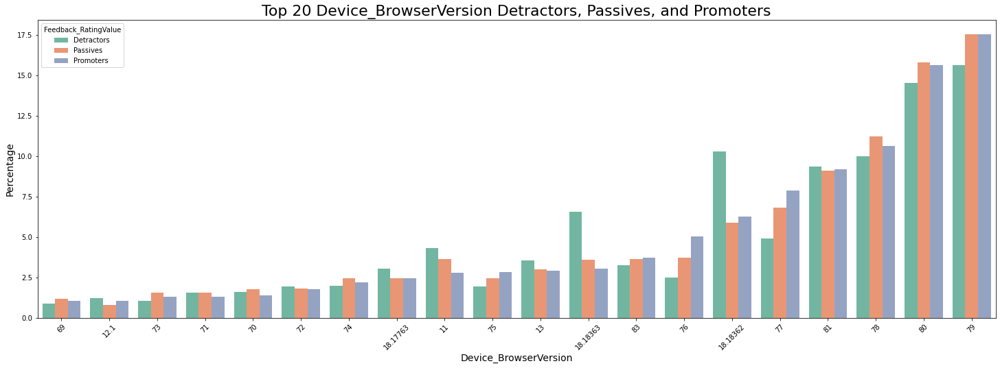

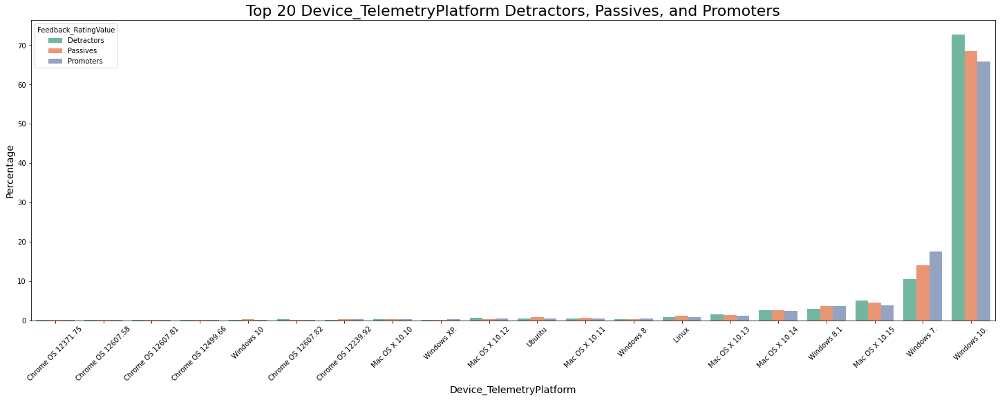

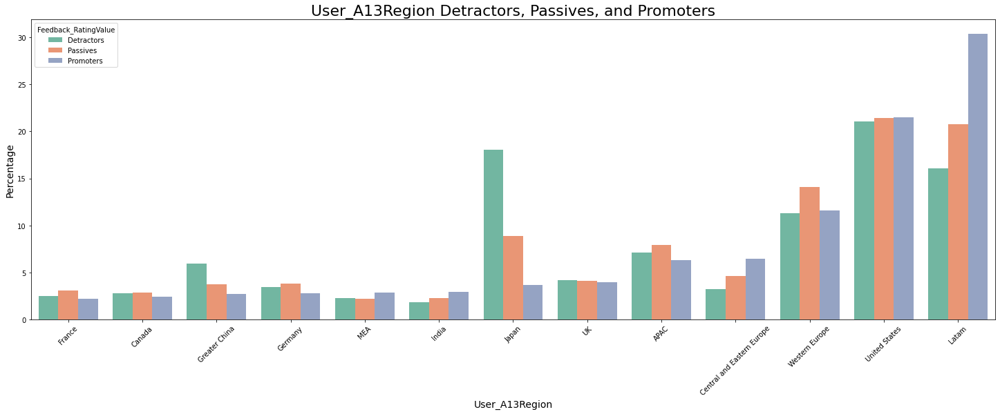

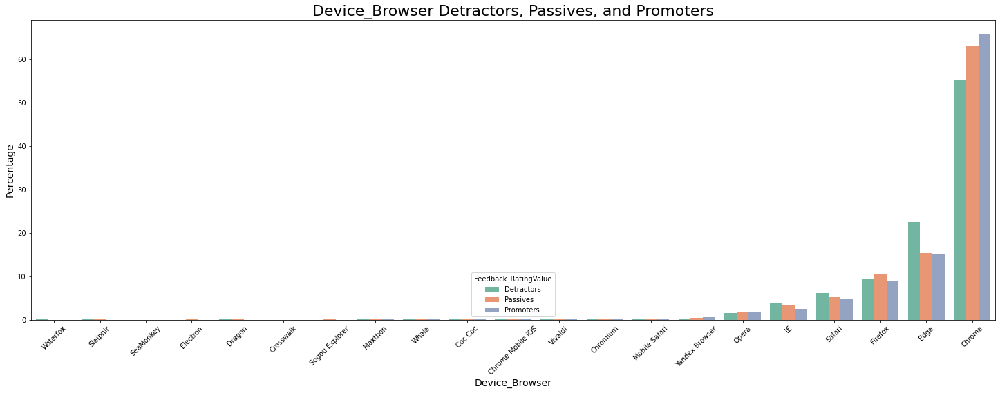

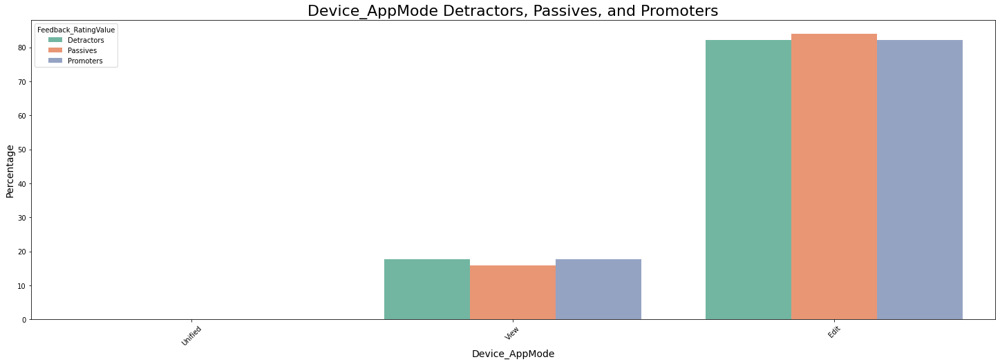

In [588]:
driver_analysis.plot_promoter_and_detractor_percentages(excel_web_consumer_drivers)

### Excel Web Commercial Edu NPS Profile

Shape before: (19320, 239)
Shape after throwing out useless features: (19320, 151)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  7.7min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 13.9min remaining:  3.0min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 14.3min remaining:   54.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 16.1min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  2.4min remaining:   30.9s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  2.5min remaining:    9.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.6min finished


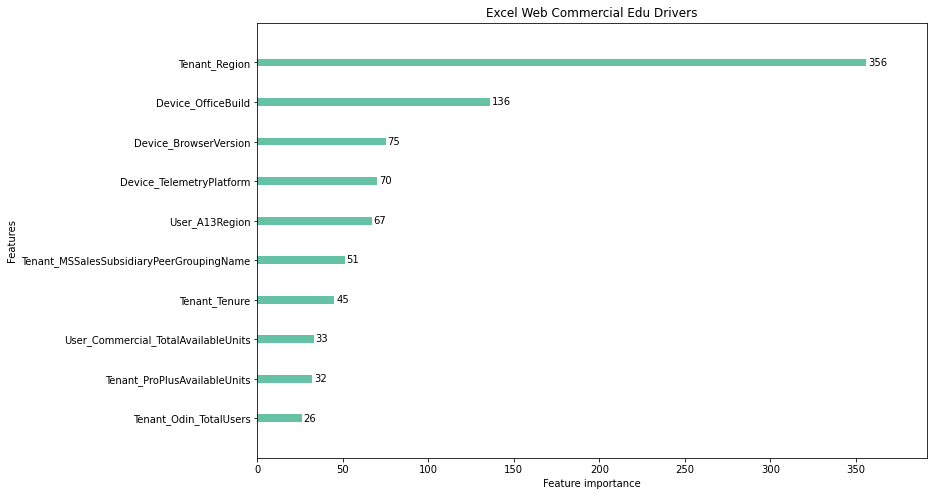

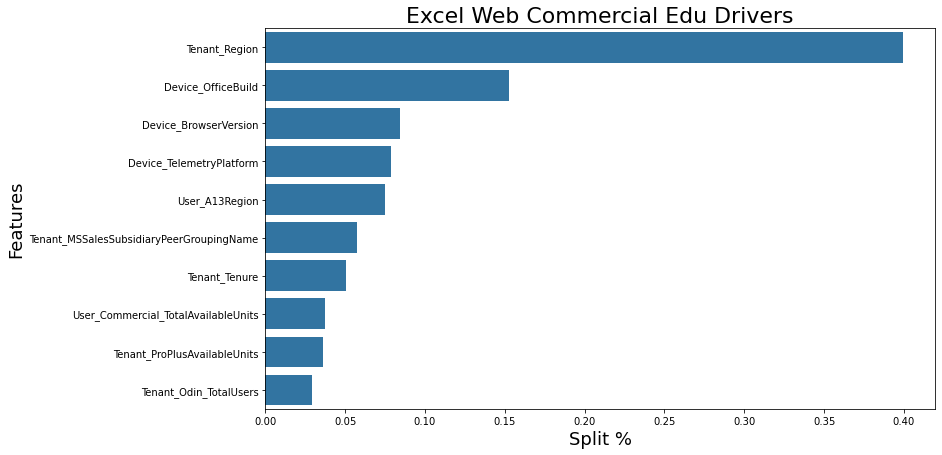

In [517]:
excel_web_comedu_drivers = driver_analysis.find_drivers(excel_web_comedu, 'Excel Web Commercial Edu Drivers')

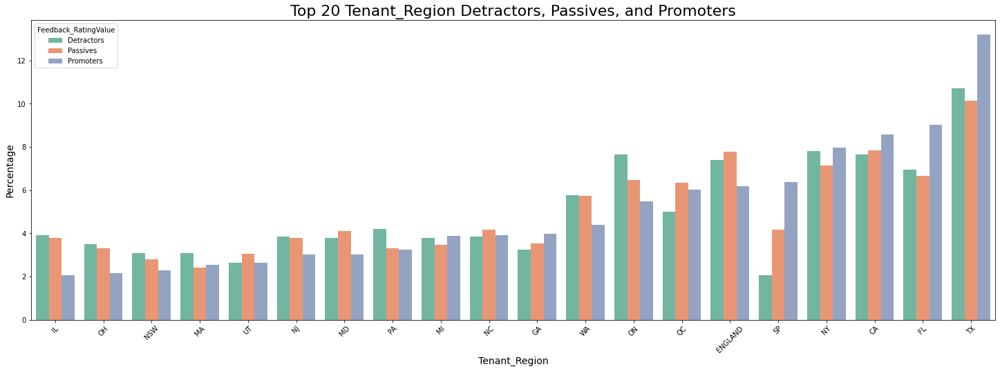

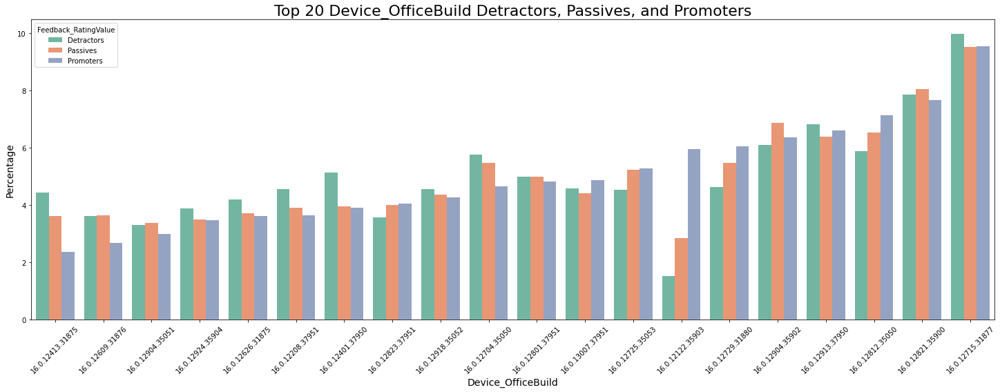

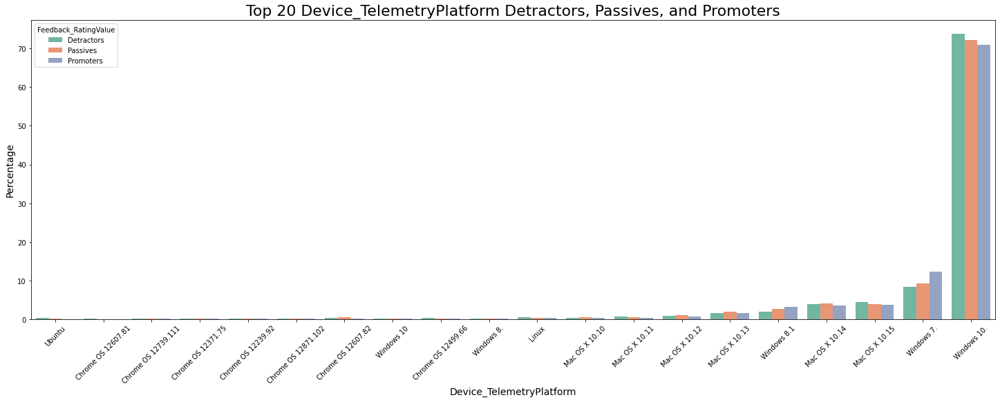

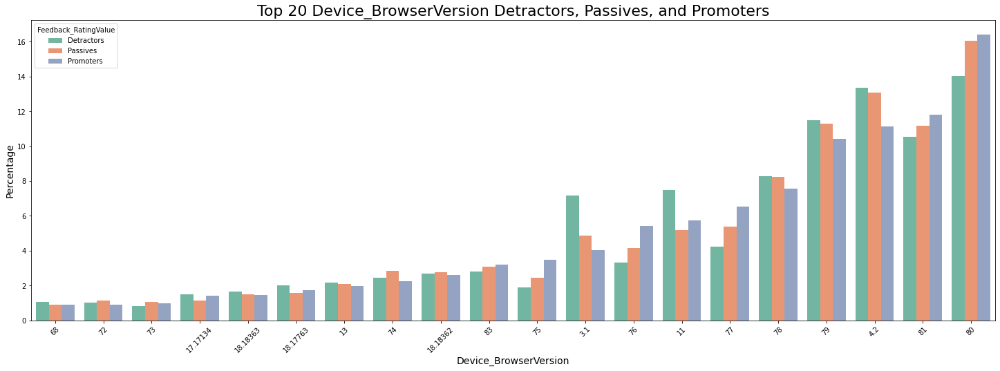

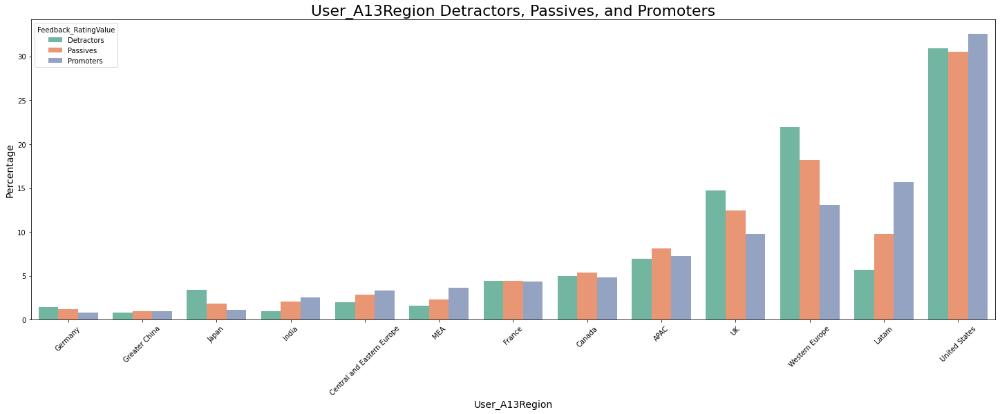

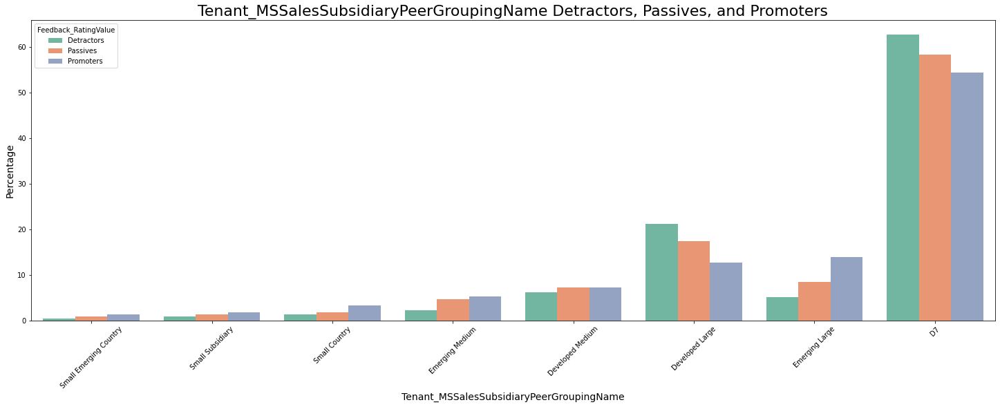

In [589]:
driver_analysis.plot_promoter_and_detractor_percentages(excel_web_comedu_drivers)

### Excel Web Commercial Non-Edu NPS Profile

Shape before: (100711, 240)
Shape after throwing out useless features: (100711, 152)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 17.4min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 32.3min remaining:  7.1min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 40.1min remaining:  2.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 41.1min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   36.2s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  3.8min remaining:   49.6s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.7min remaining:   18.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.8min finished


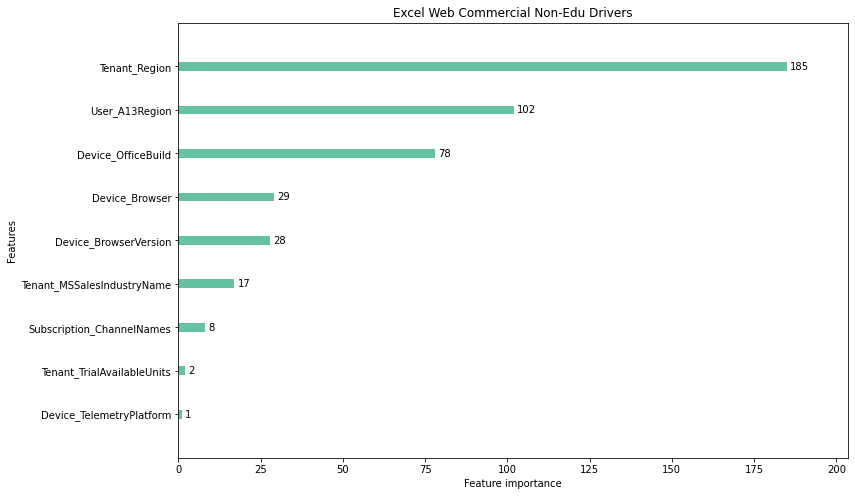

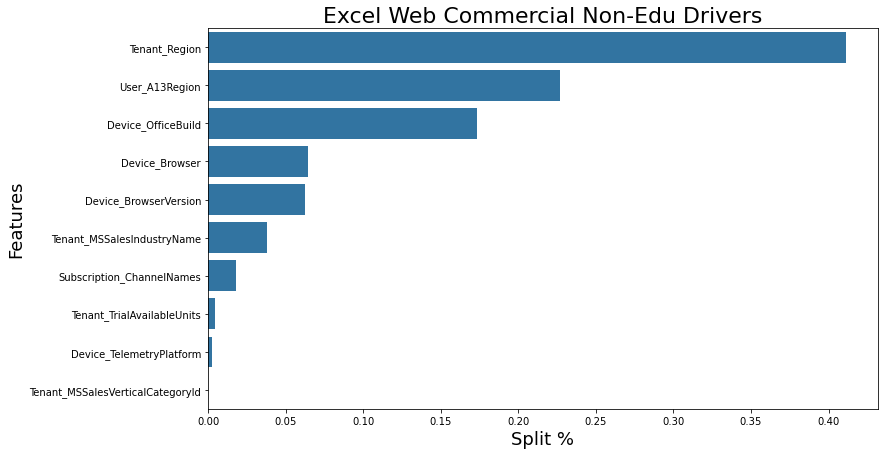

In [518]:
excel_web_nonedu_drivers = driver_analysis.find_drivers(excel_web_nonedu, 'Excel Web Commercial Non-Edu Drivers')

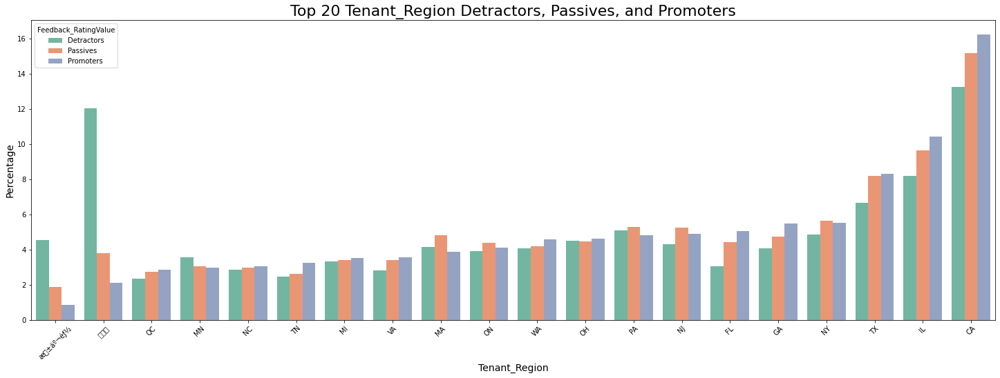

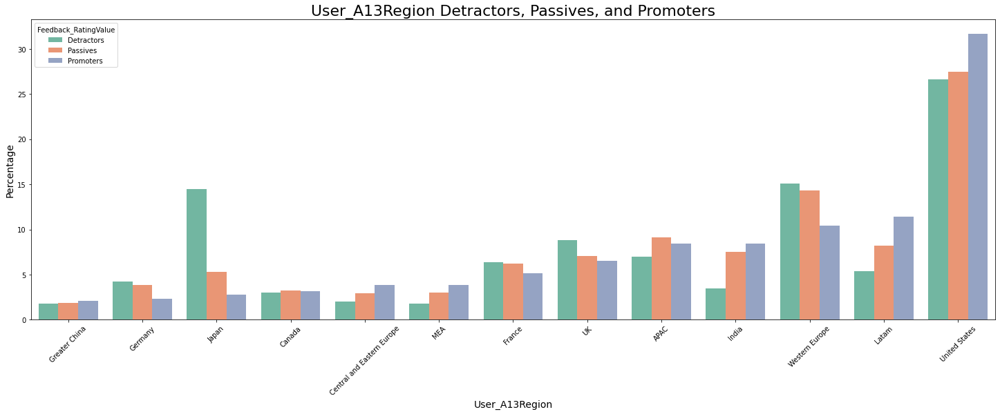

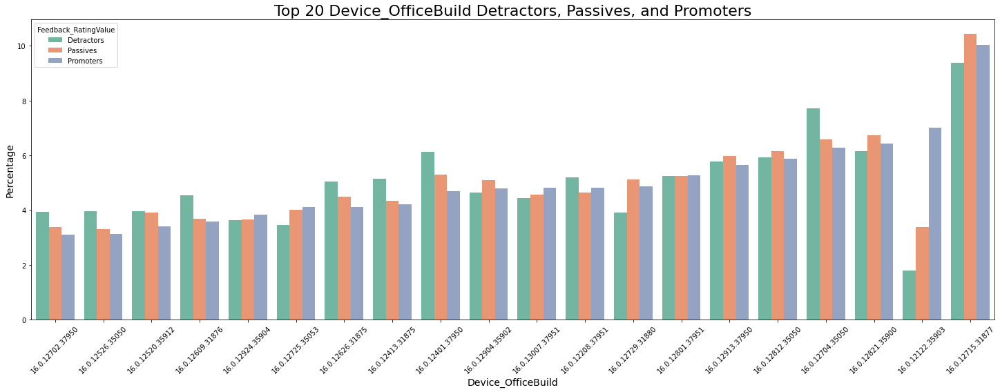

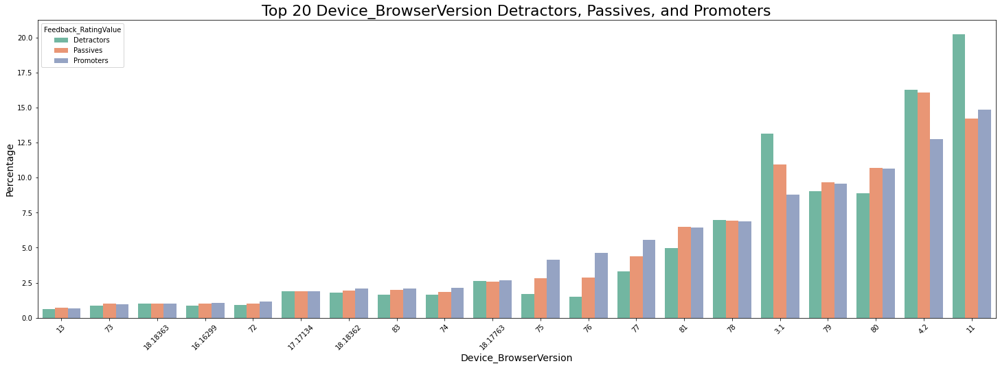

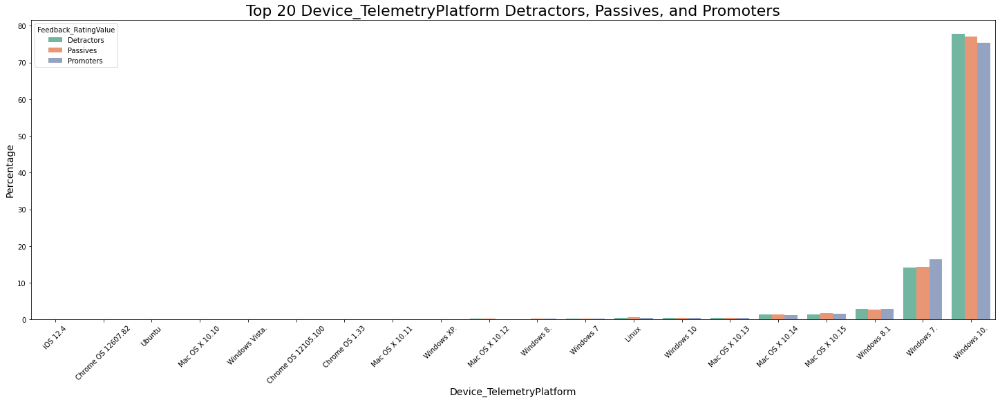

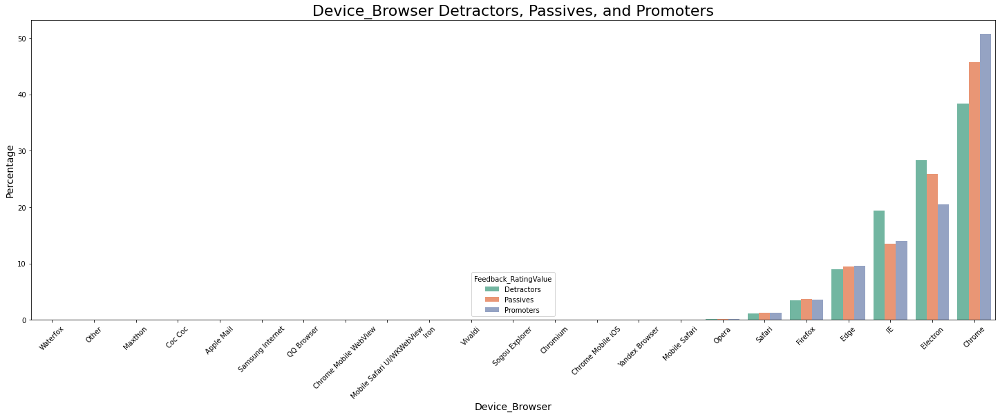

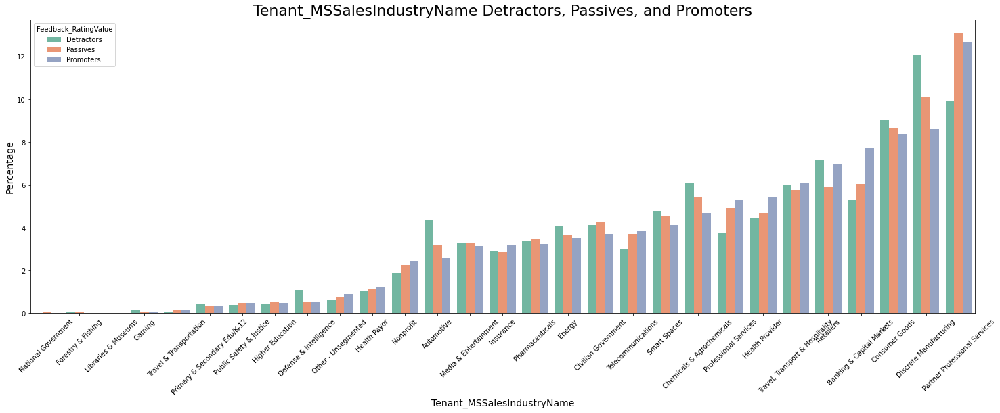

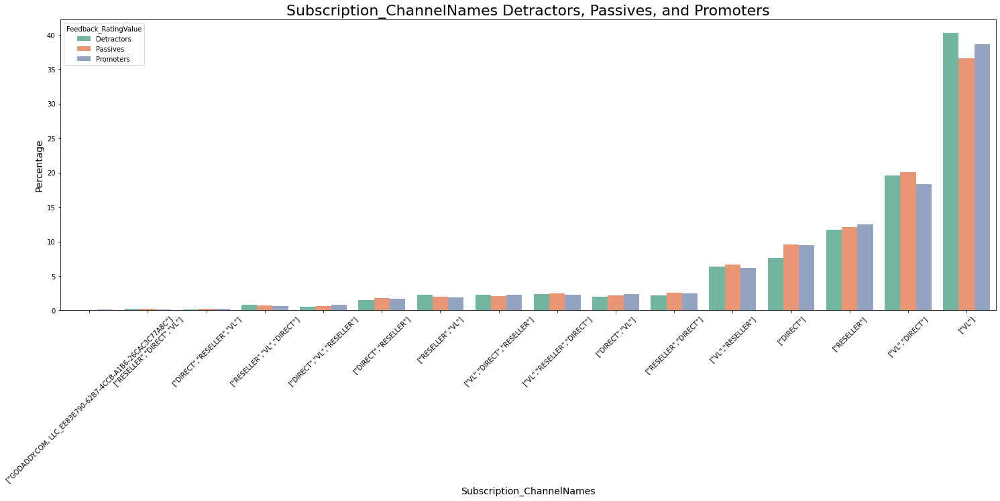

In [590]:
driver_analysis.plot_promoter_and_detractor_percentages(excel_web_nonedu_drivers)

### Excel Windows Consumer NPS Profile

Shape before: (25104, 73)
Shape after throwing out useless features: (25104, 43)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   39.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  6.3min remaining:  1.4min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  7.4min remaining:   28.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  7.5min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  1.7min remaining:   22.7s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  1.9min remaining:    7.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.0min finished


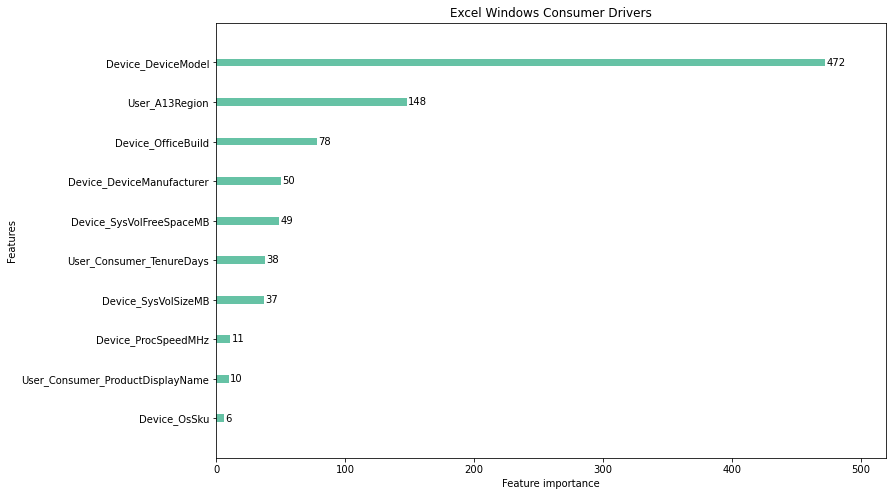

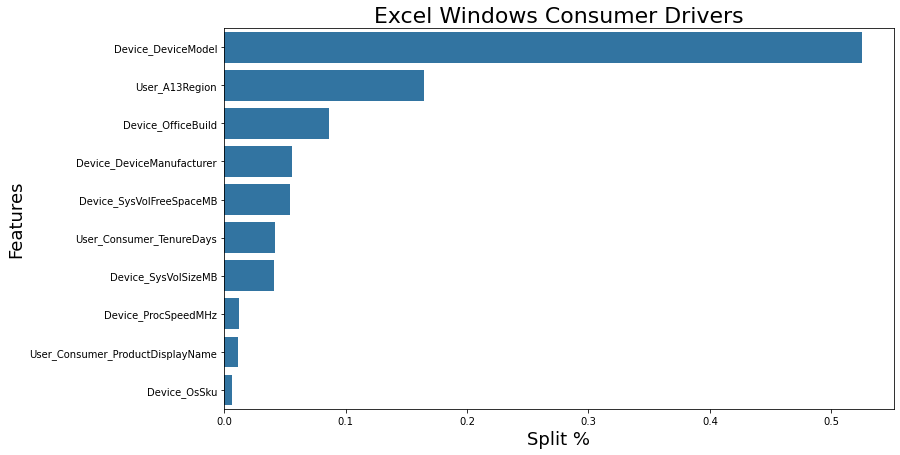

In [519]:
excel_windows_consumer_drivers = driver_analysis.find_drivers(excel_windows_consumer, 'Excel Windows Consumer Drivers')

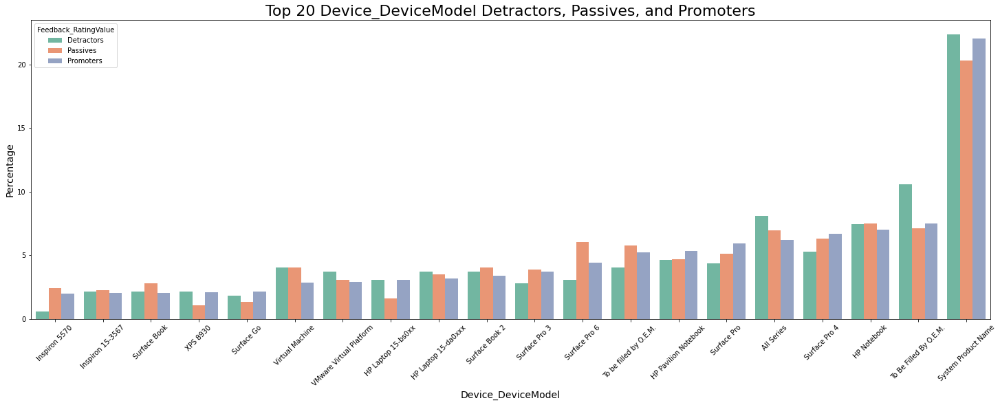

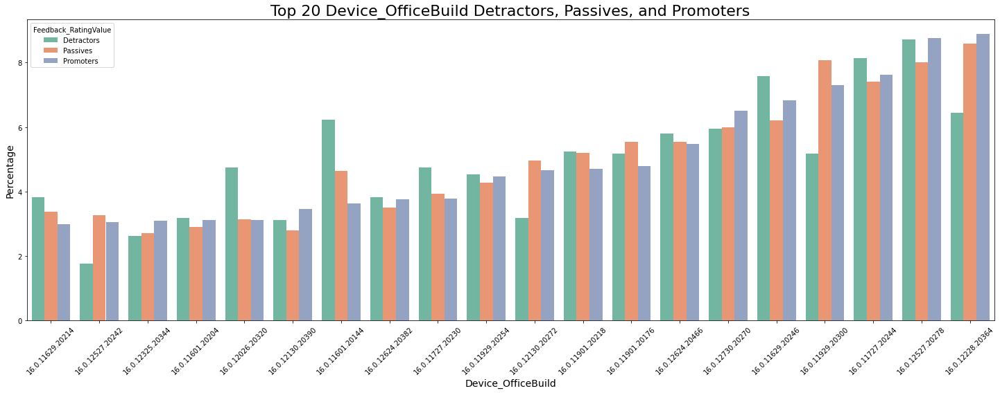

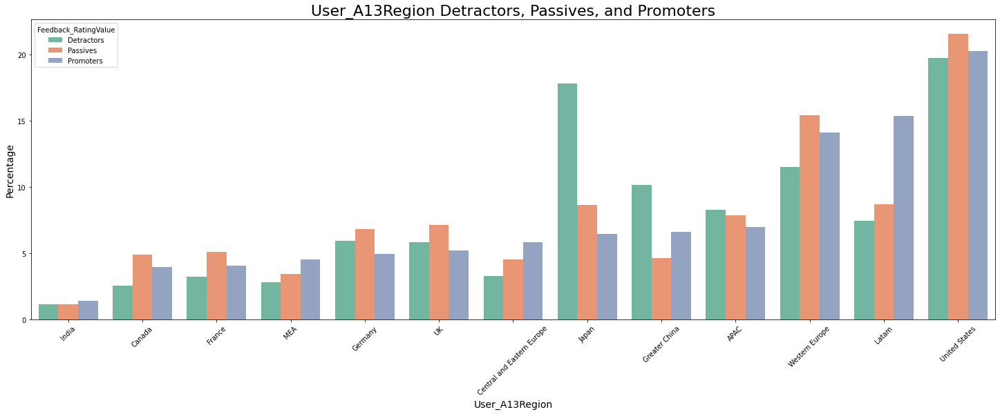

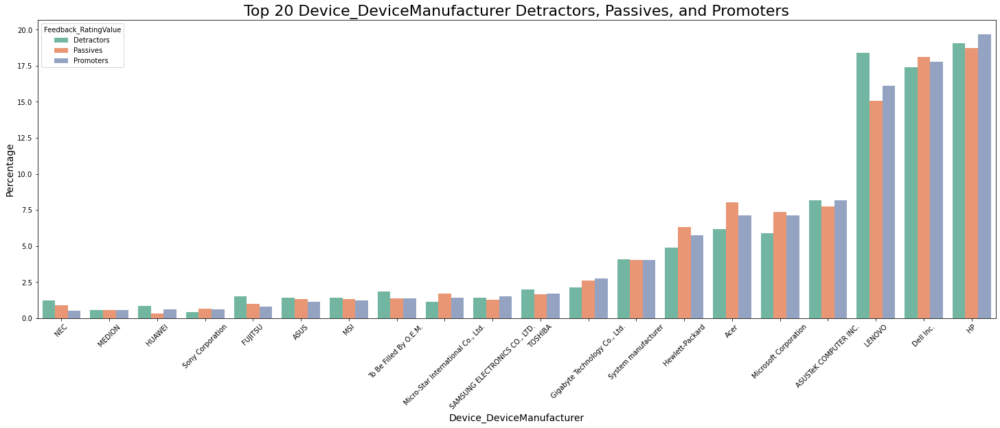

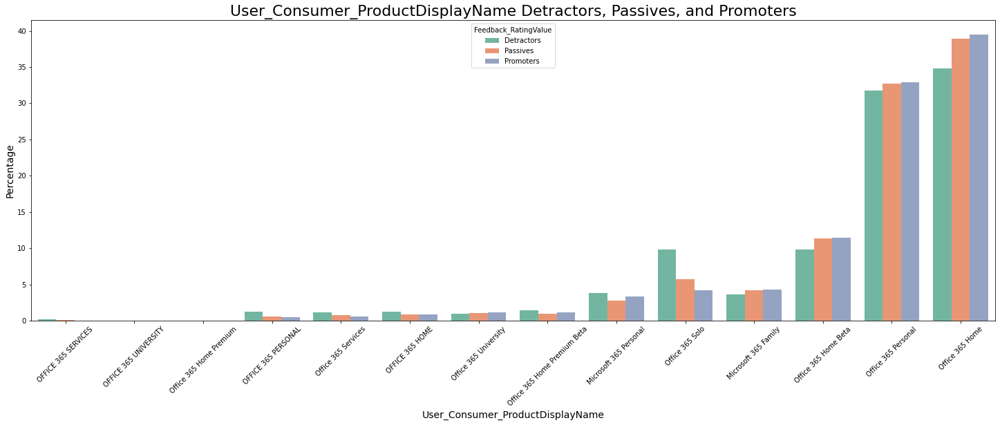

In [591]:
driver_analysis.plot_promoter_and_detractor_percentages(excel_windows_consumer_drivers)

### Excel Windows Commercial Edu NPS Profile

Shape before: (7951, 251)
Shape after throwing out useless features: (7951, 162)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   17.4s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  4.1min remaining:   53.3s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  5.1min remaining:   19.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  5.2min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   29.6s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   39.8s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:   45.7s remaining:   10.0s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:   48.8s remaining:    3.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   49.0s finished


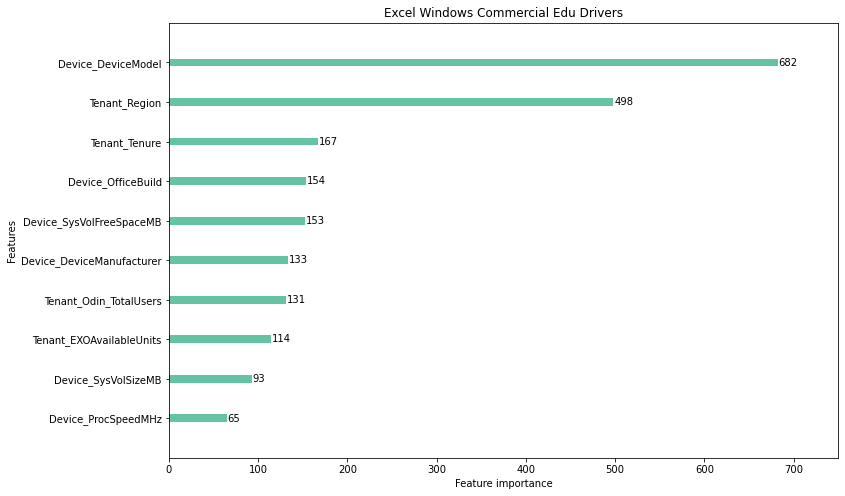

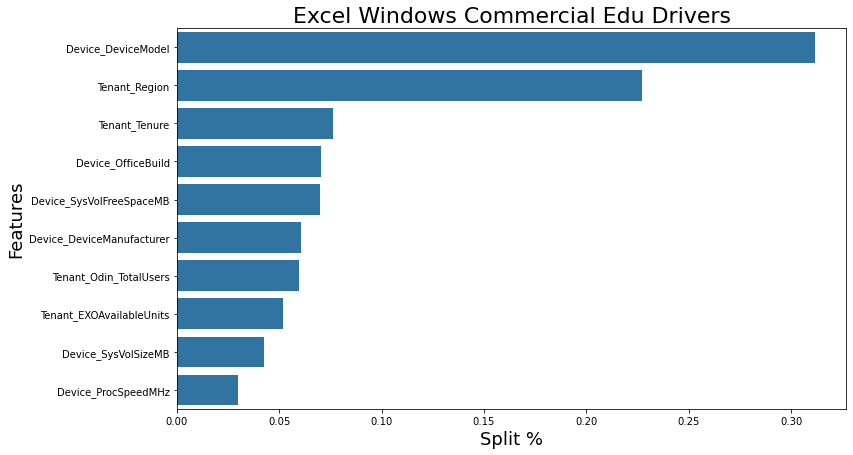

In [523]:
excel_windows_comedu_drivers = driver_analysis.find_drivers(excel_windows_comedu, 'Excel Windows Commercial Edu Drivers')

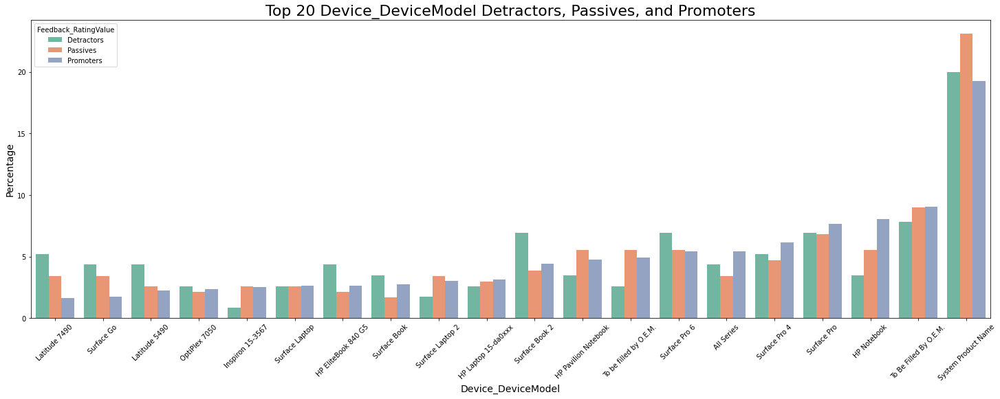

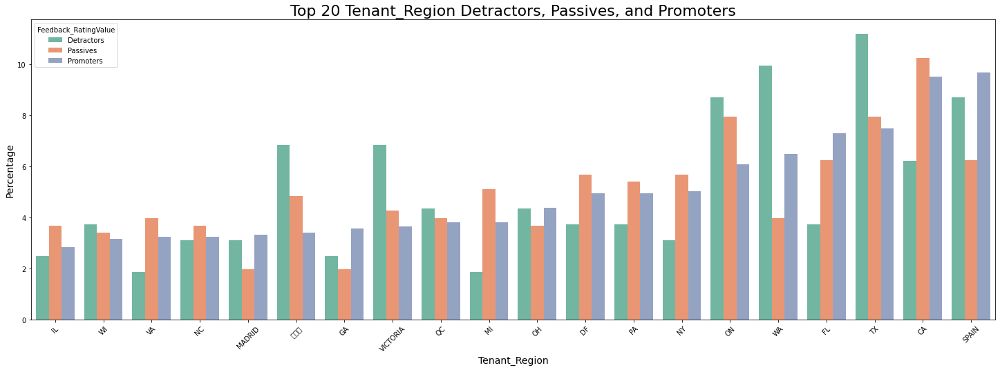

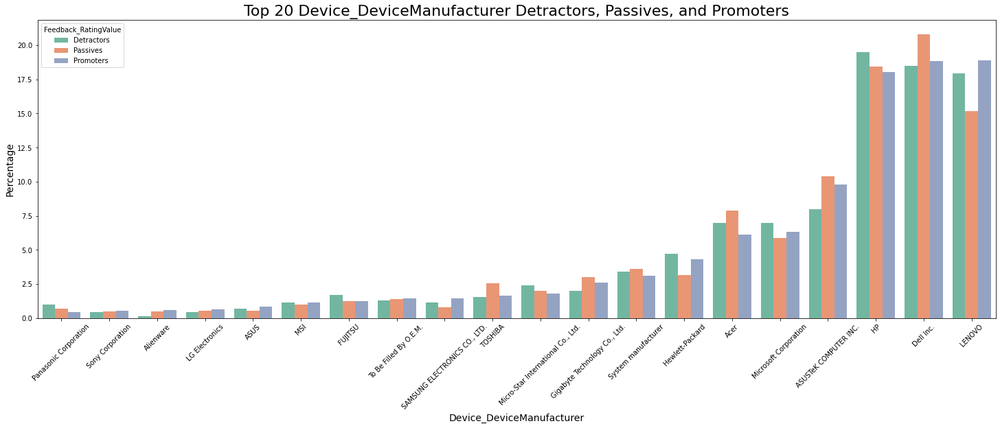

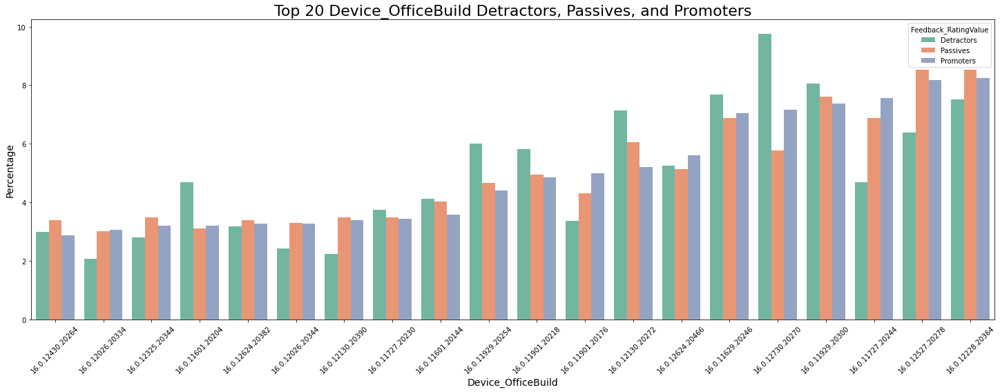

In [592]:
driver_analysis.plot_promoter_and_detractor_percentages(excel_windows_comedu_drivers)

### Excel Windows Commercial Non-Edu NPS Profile

Shape before: (28190, 252)
Shape after throwing out useless features: (28190, 162)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   24.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   55.9s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  6.7min remaining:  1.5min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  7.2min remaining:   27.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  8.0min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   54.5s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   59.2s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  2.4min remaining:   32.0s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  2.8min remaining:   10.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.9min finished


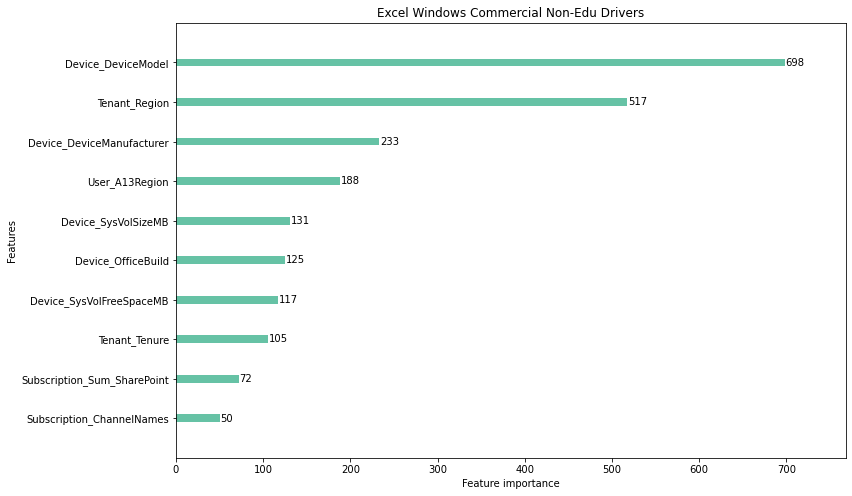

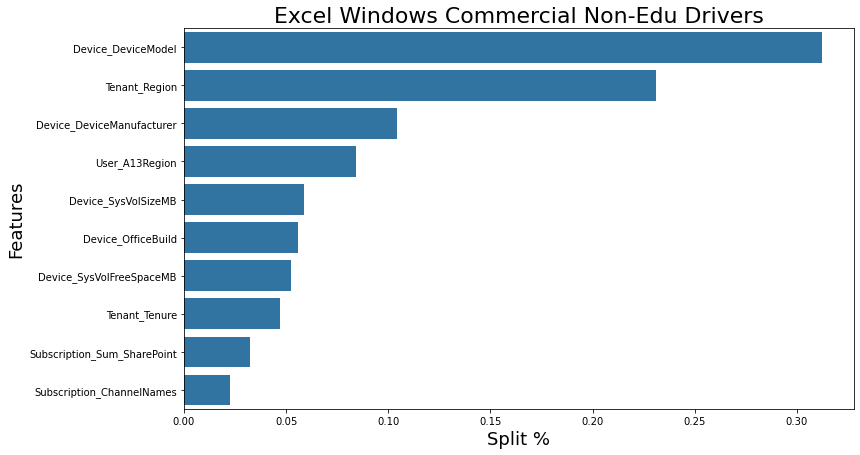

In [524]:
ezxel_windows_nonedu_drivers = driver_analysis.find_drivers(excel_windows_nonedu, 'Excel Windows Commercial Non-Edu Drivers')

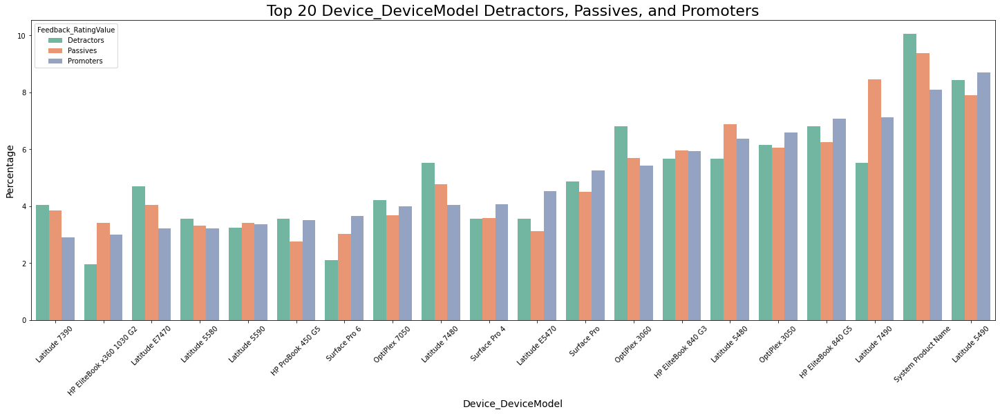

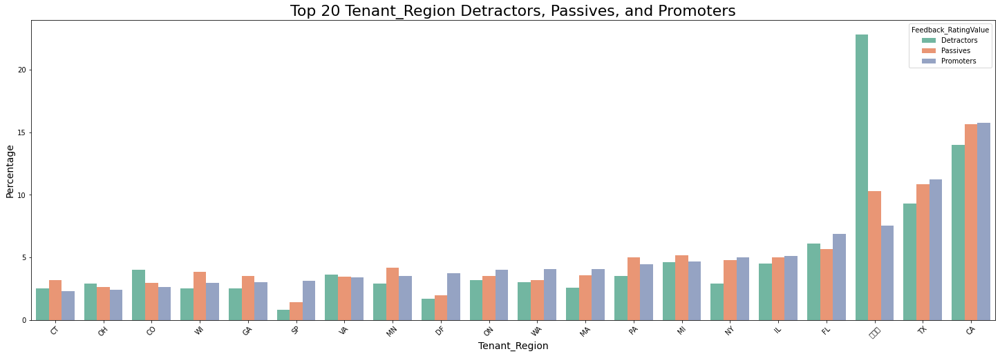

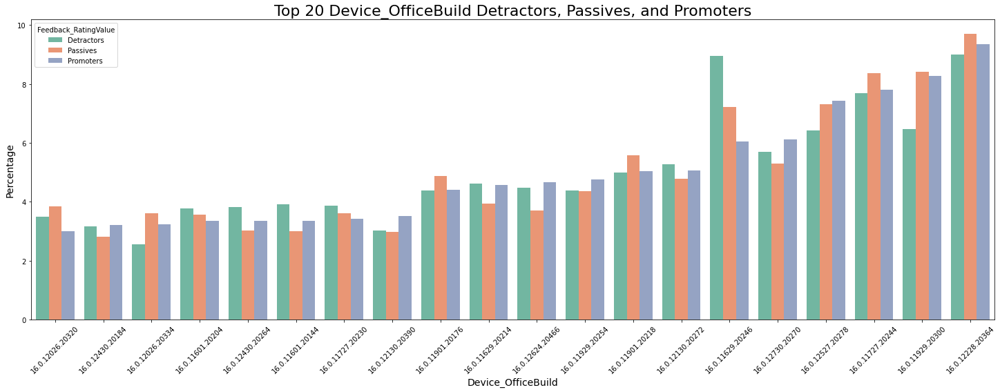

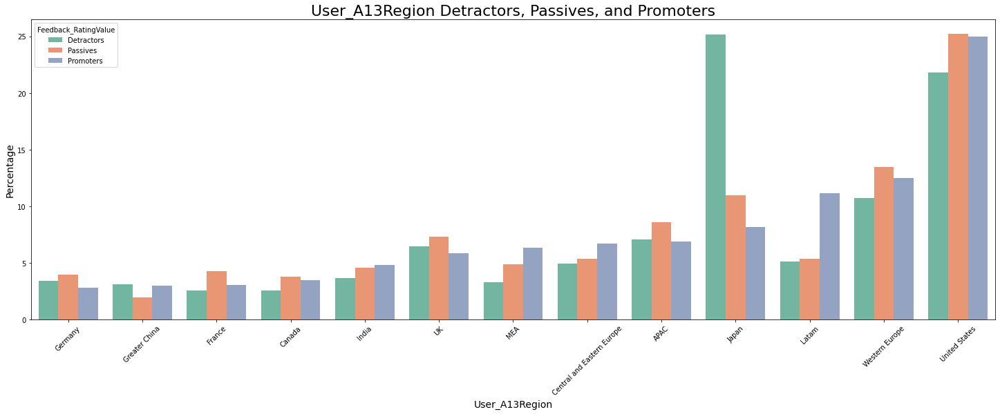

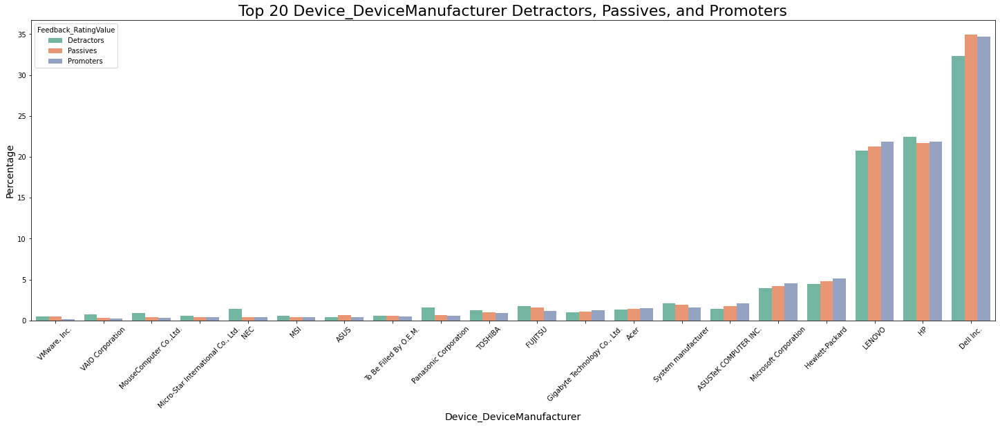

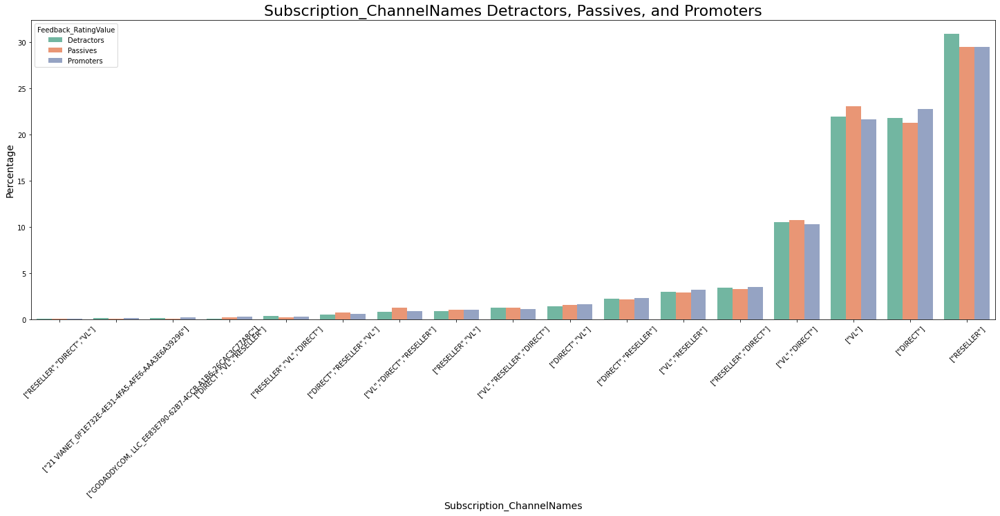

In [593]:
driver_analysis.plot_promoter_and_detractor_percentages(ezxel_windows_nonedu_drivers)

# Powerpoint
- web and windows

In [331]:
#get web and windows specific dfs
pp_web_consumer, pp_web_comedu, pp_web_nonedu, pp_windows_consumer, pp_windows_comedu, pp_windows_nonedu = \
                                                driver_analysis.web_and_windows_slicer('C:\\Users\\fulto\\Desktop\\Driver Analysis\\PP', 'PP_Web_and_Windows.csv')

shape before deleting missing columns: (31922, 321)
shape after deleting missing columns: (31922, 39)
shape before deleting missing columns: (135627, 321)
shape after deleting missing columns: (135627, 236)
shape before deleting missing columns: (54256, 321)
shape after deleting missing columns: (54256, 241)
shape before deleting missing columns: (33381, 321)
shape after deleting missing columns: (33381, 74)
shape before deleting missing columns: (30548, 321)
shape after deleting missing columns: (30548, 252)
shape before deleting missing columns: (30180, 321)
shape after deleting missing columns: (30180, 253)


In [332]:
#get nps specific dfs
pp_nps_dfs = driver_analysis.get_detractors_and_promoters('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Excel', 'Excel_Windows_and_Web.csv')

shape before deleting missing columns: (22379, 321)
shape after deleting missing columns: (22379, 39)
shape before deleting missing columns: (19320, 321)
shape after deleting missing columns: (19320, 240)
shape before deleting missing columns: (100711, 321)
shape after deleting missing columns: (100711, 241)
shape before deleting missing columns: (25104, 321)
shape after deleting missing columns: (25104, 74)
shape before deleting missing columns: (7951, 321)
shape after deleting missing columns: (7951, 252)
shape before deleting missing columns: (28190, 321)
shape after deleting missing columns: (28190, 253)


### Powerpoint Web Consumer NPS Profile

Shape before: (31922, 38)
Shape after throwing out useless features: (31922, 13)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   15.1s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   41.0s
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:   41.7s remaining:    9.1s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  1.1min remaining:    4.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.1min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   48.2s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  1.2min remaining:   16.1s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  1.3min remaining:    4.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.3min finished


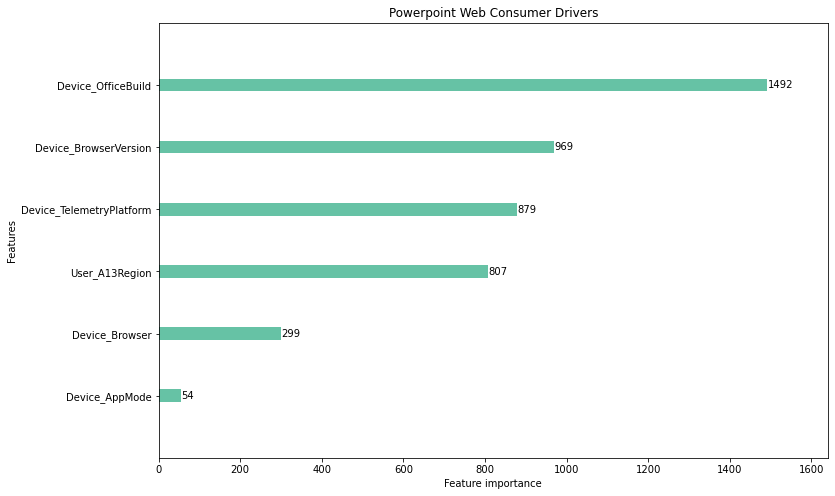

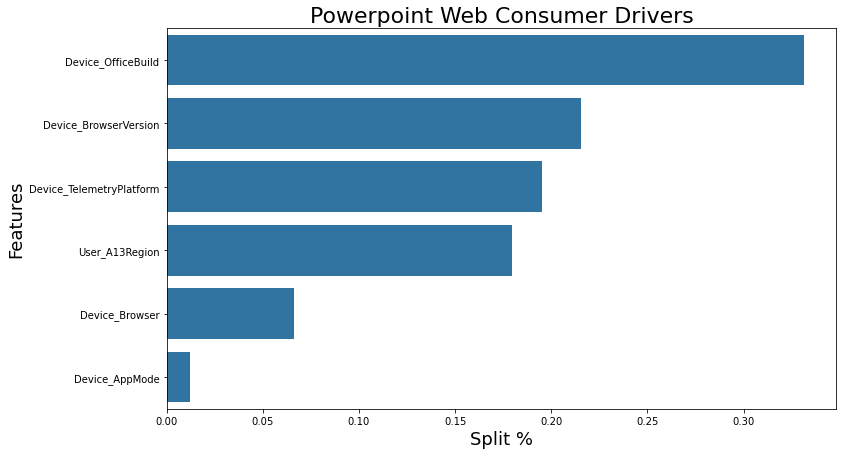

In [545]:
pp_web_consumer_drivers = driver_analysis.find_drivers(pp_web_consumer, 'Powerpoint Web Consumer Drivers')

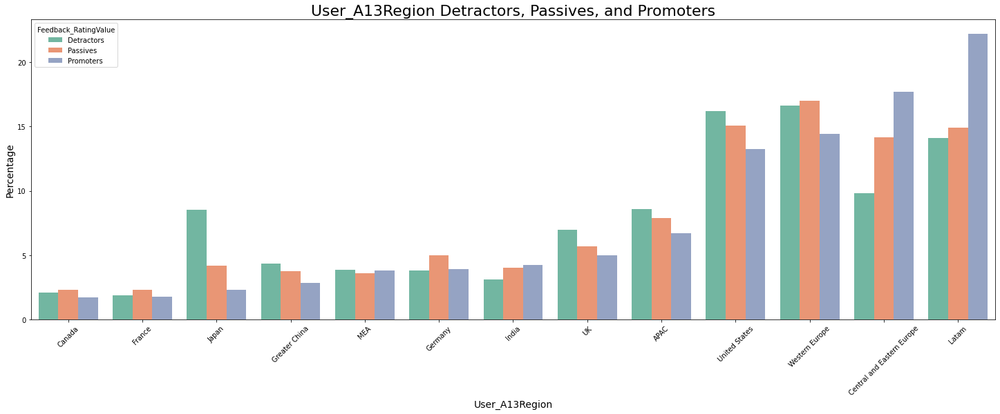

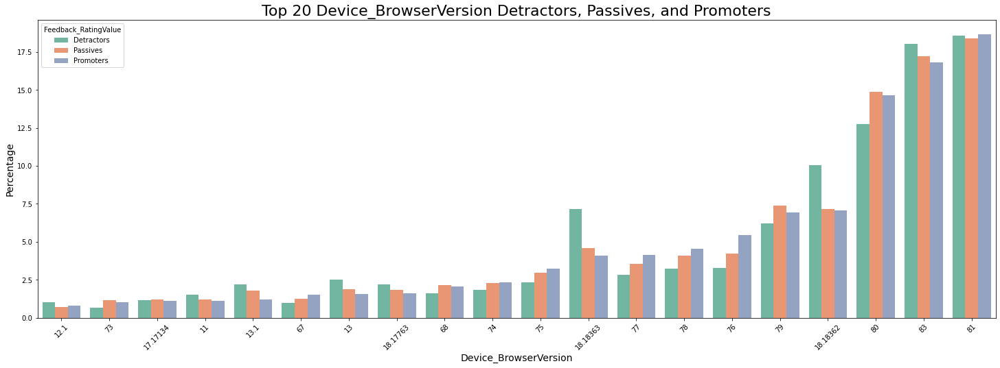

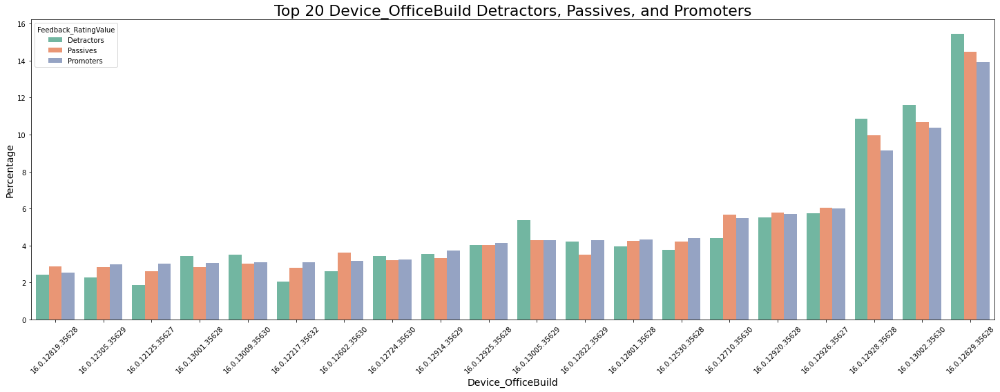

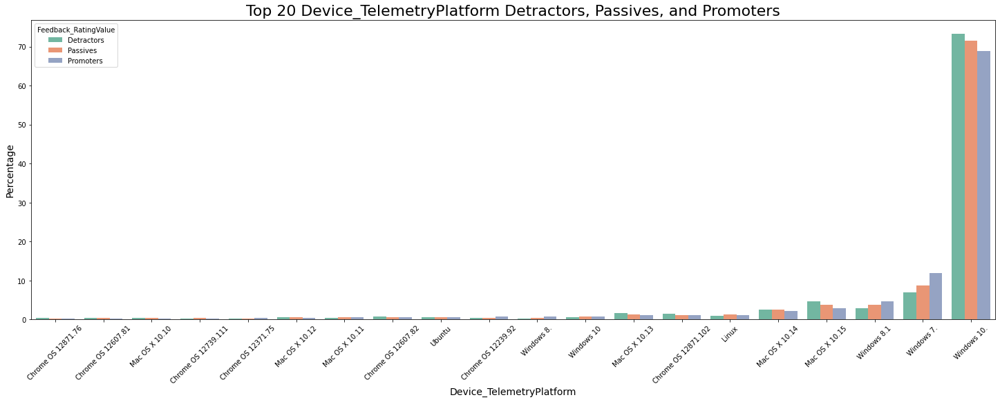

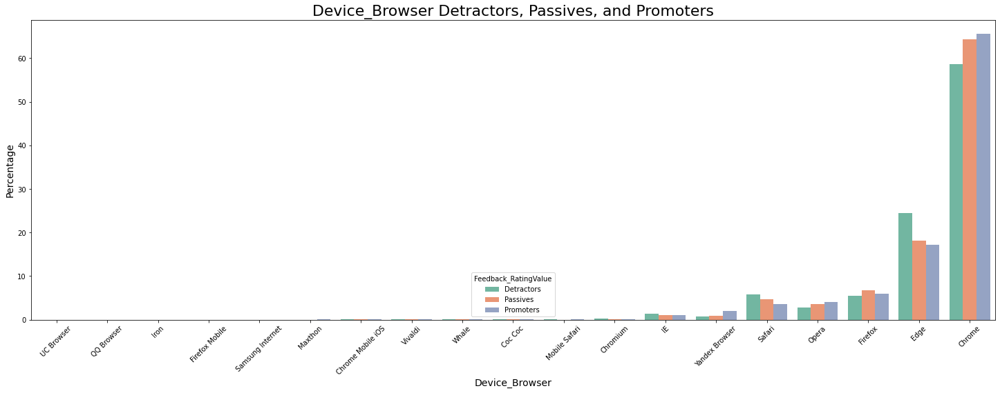

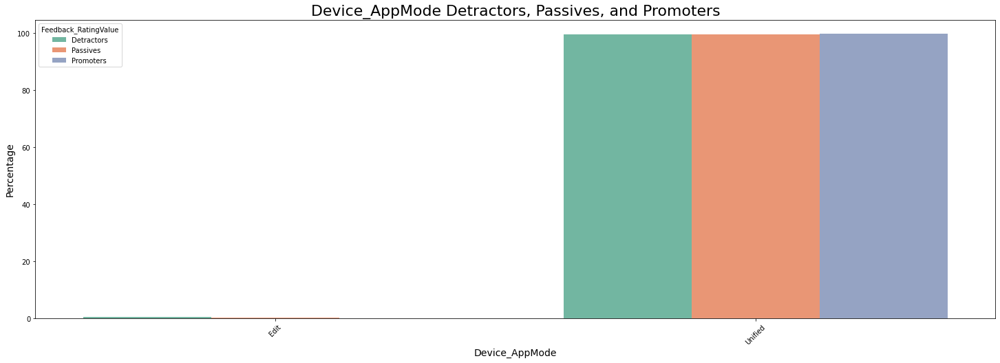

In [594]:
driver_analysis.plot_promoter_and_detractor_percentages(pp_web_consumer_drivers)

### Powerpoint Web Commercial Edu NPS Profile

Shape before: (135627, 235)
Shape after throwing out useless features: (135627, 150)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed: 19.9min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 23.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 32.7min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 35.3min remaining:  7.8min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 37.5min remaining:  2.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 39.3min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   11.7s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  6.2min remaining:  1.4min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  7.1min remaining:   27.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  7.5min finished


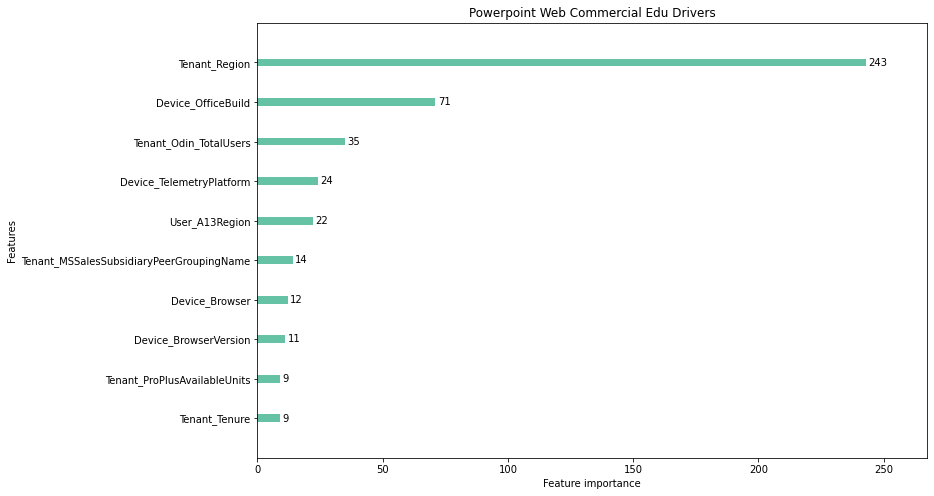

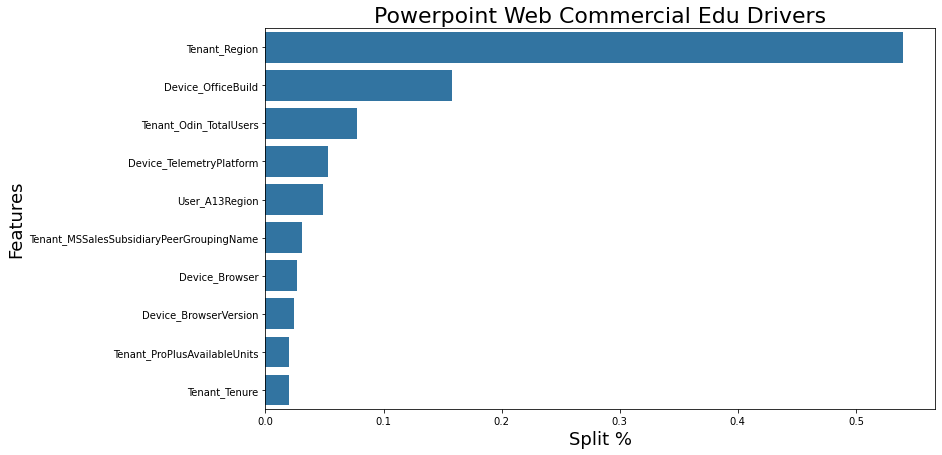

In [546]:
pp_web_comedu_drivers = driver_analysis.find_drivers(pp_web_comedu, 'Powerpoint Web Commercial Edu Drivers')

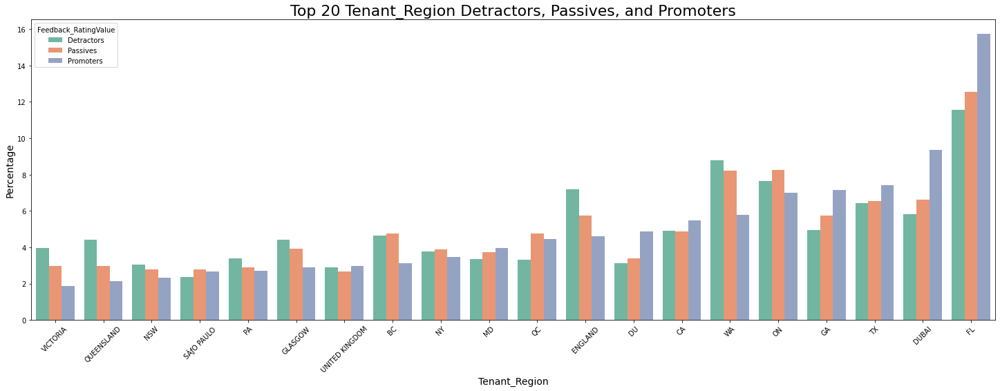

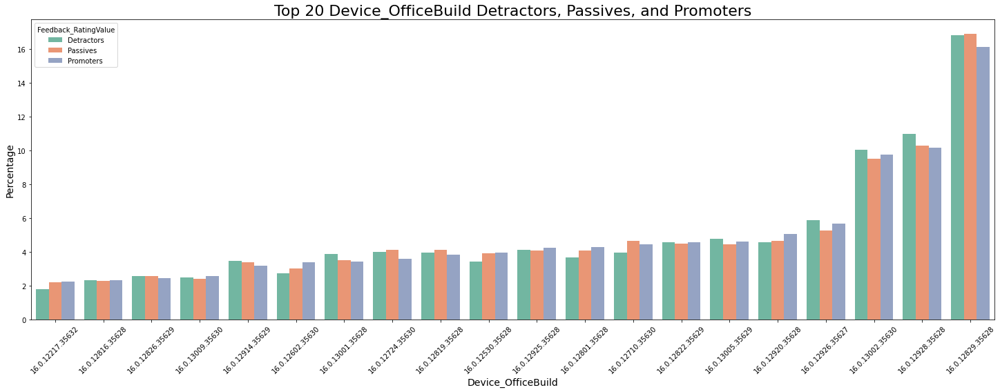

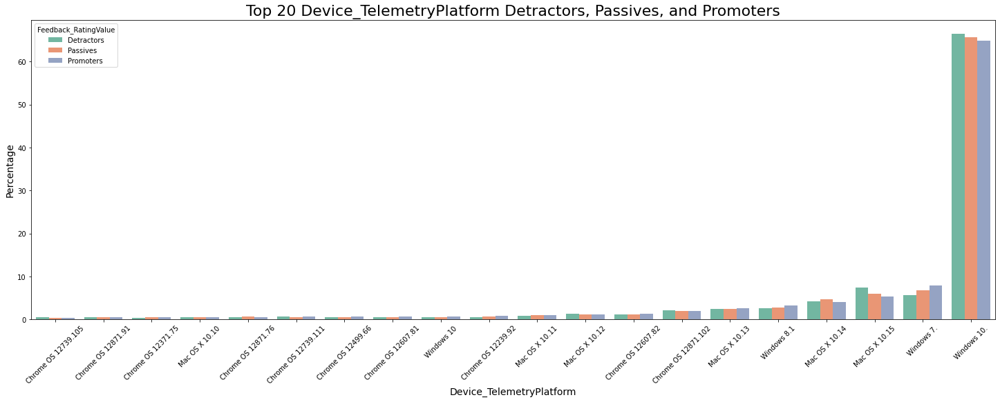

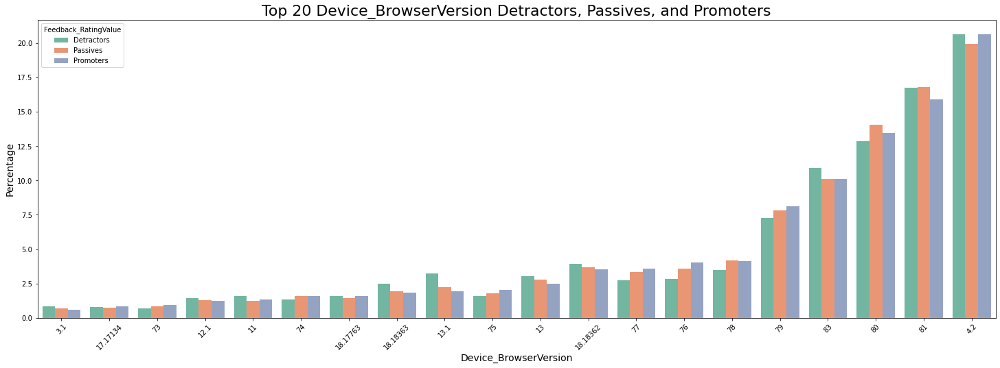

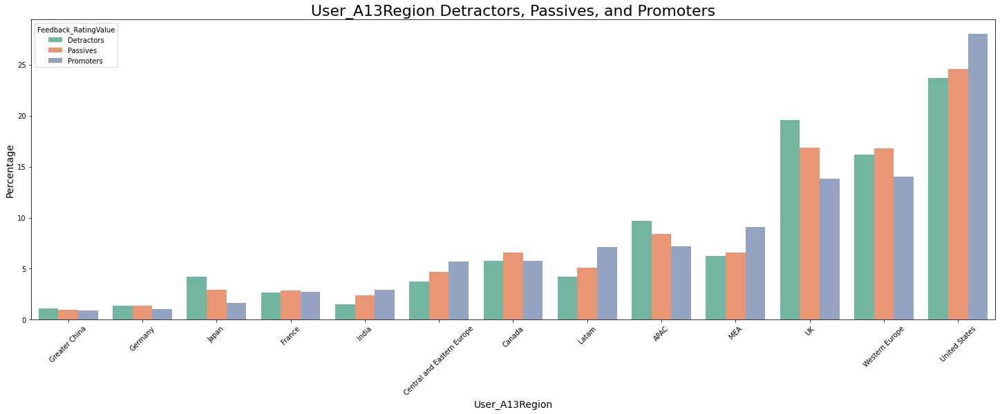

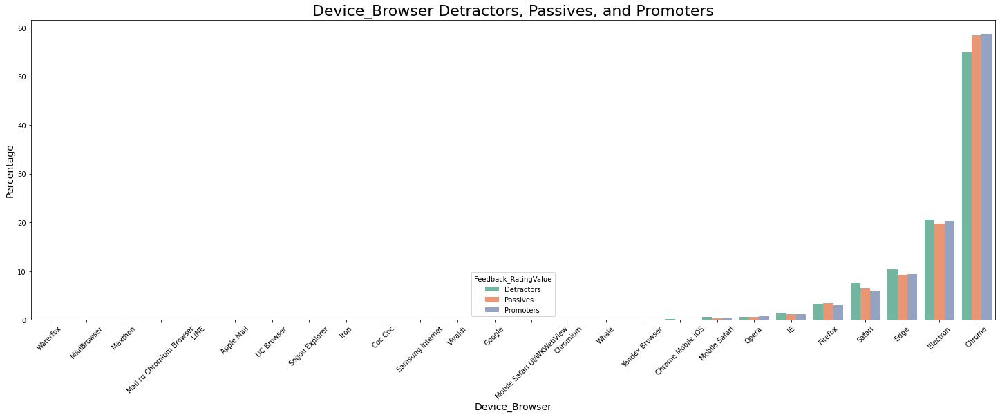

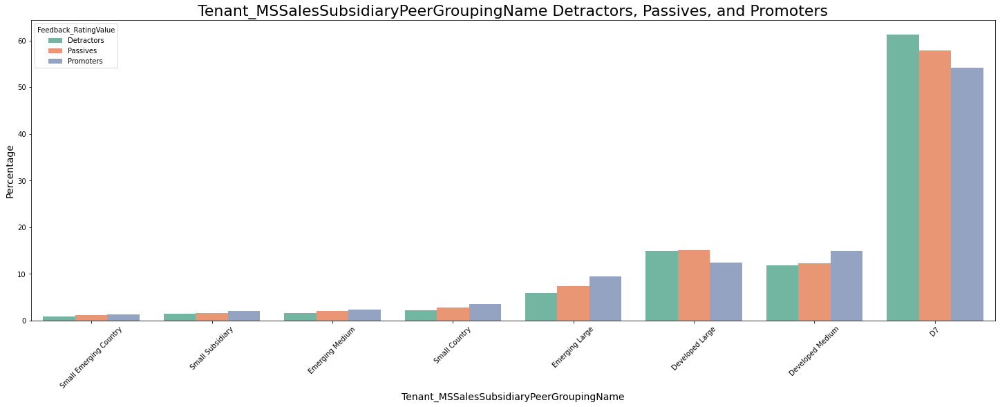

In [595]:
driver_analysis.plot_promoter_and_detractor_percentages(pp_web_comedu_drivers)

### Powerpoint Web Commercial Non-Edu NPS Drivers

Shape before: (54256, 240)
Shape after throwing out useless features: (54256, 152)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   39.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 14.4min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 19.7min remaining:  4.3min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 25.3min remaining:  1.6min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 26.3min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   11.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  4.5min remaining:   59.2s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  5.0min remaining:   19.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  5.1min finished


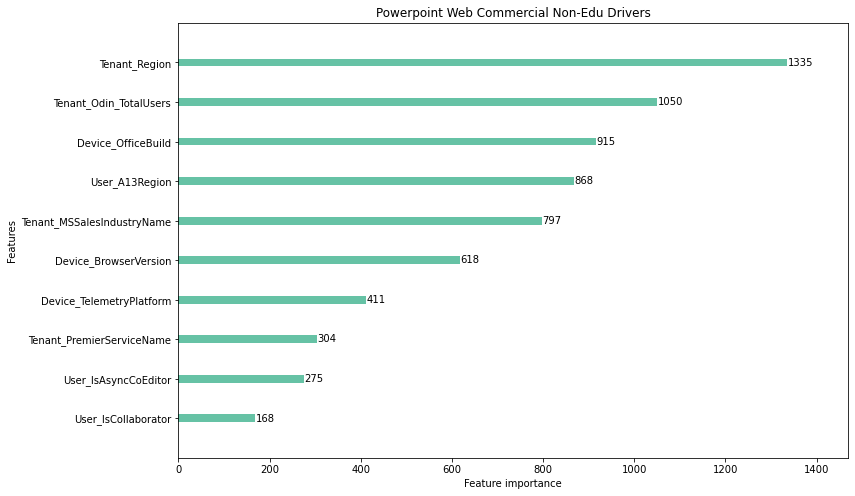

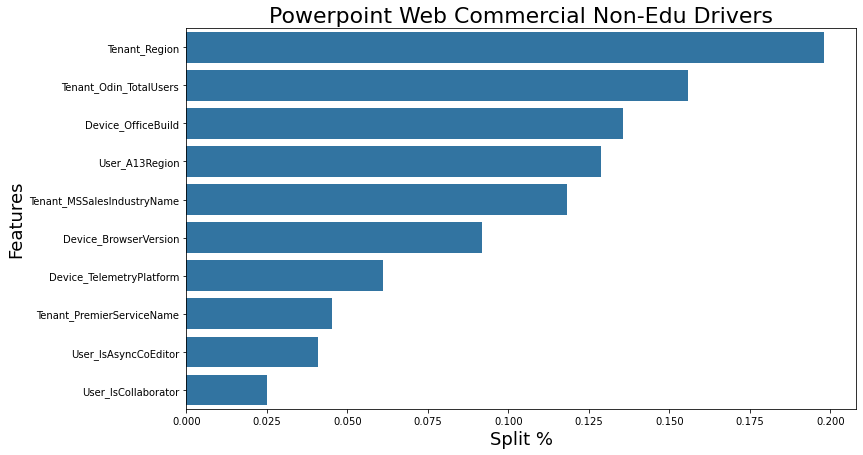

In [547]:
pp_web_nonedu_drivers = driver_analysis.find_drivers(pp_web_nonedu, 'Powerpoint Web Commercial Non-Edu Drivers')

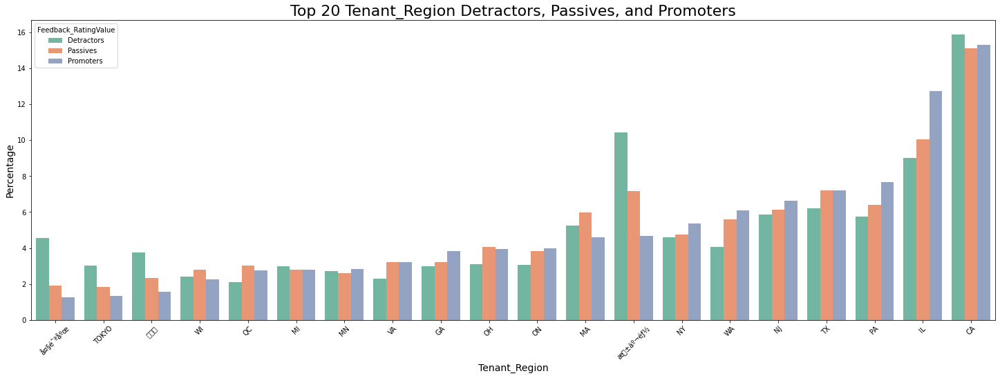

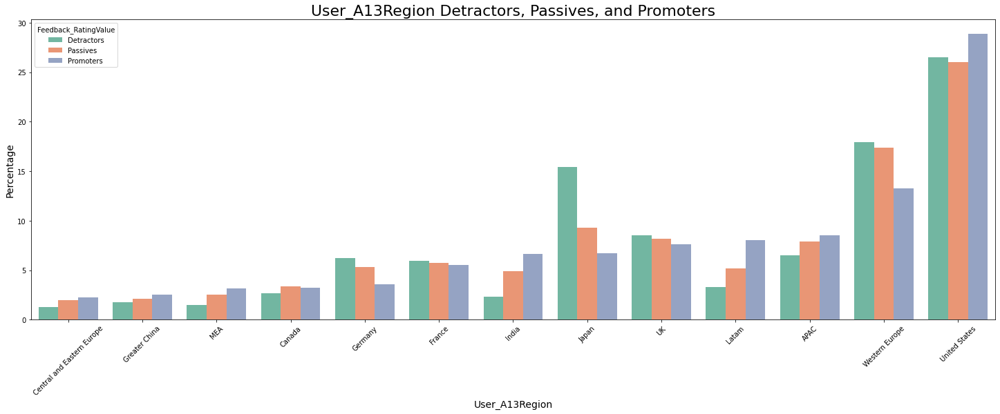

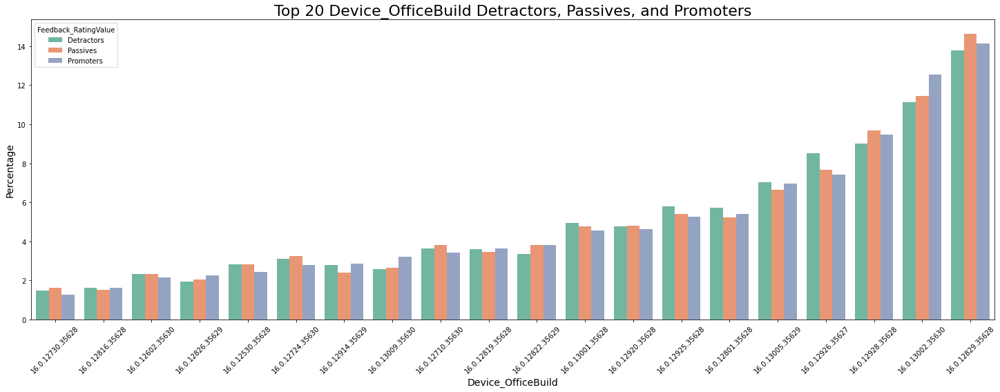

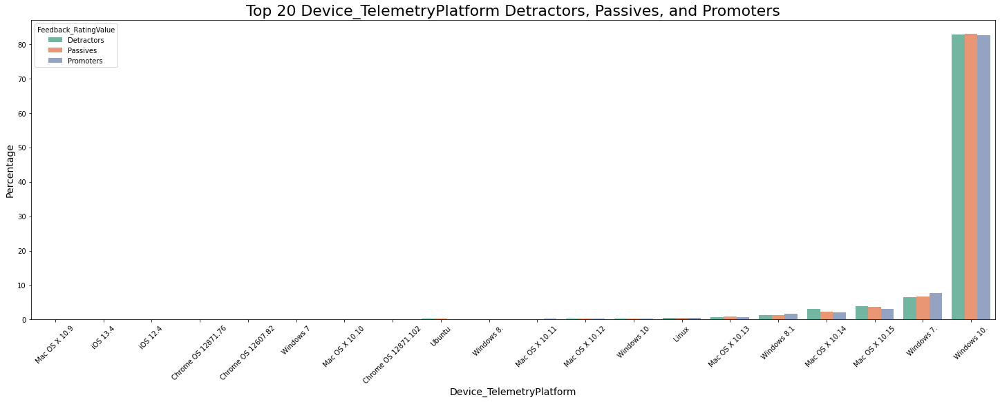

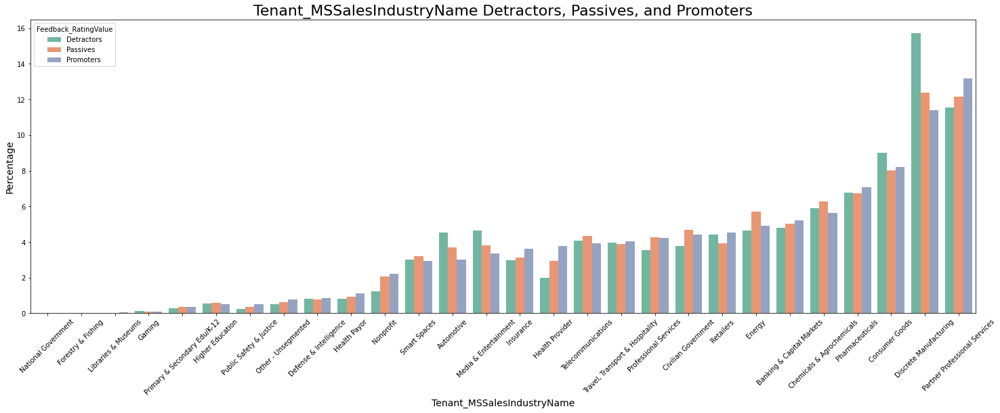

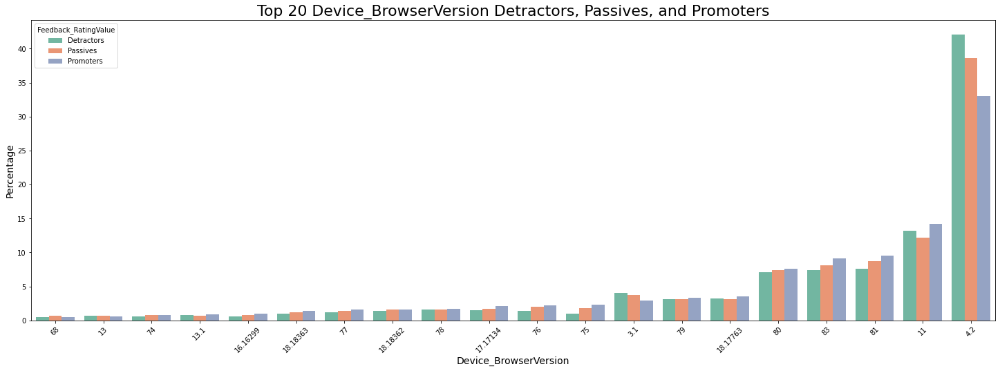

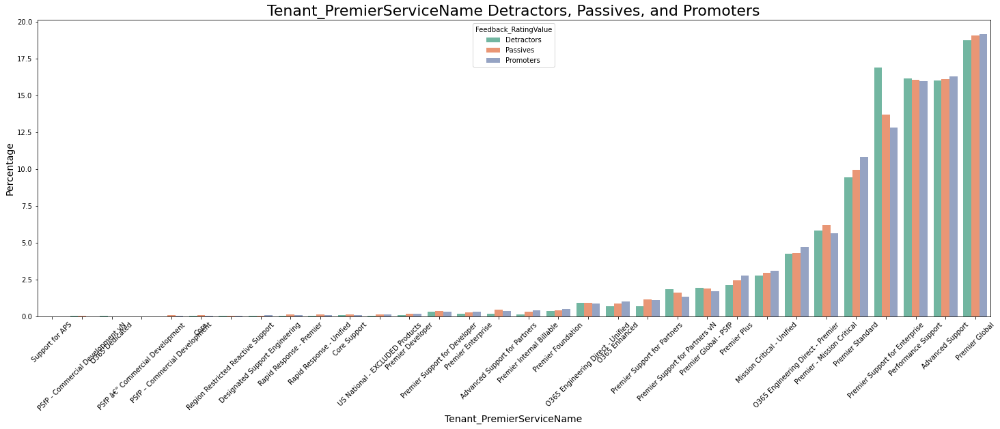

In [596]:
driver_analysis.plot_promoter_and_detractor_percentages(pp_web_nonedu_drivers)

### Powerpoint Web Commercial Non-Edu NPS Profile

Shape before: (33381, 73)
Shape after throwing out useless features: (33381, 43)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   45.5s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  6.5min remaining:  1.4min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  6.7min remaining:   25.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  7.8min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   40.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   46.6s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  3.6min remaining:   47.1s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.0min remaining:   15.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.0min finished


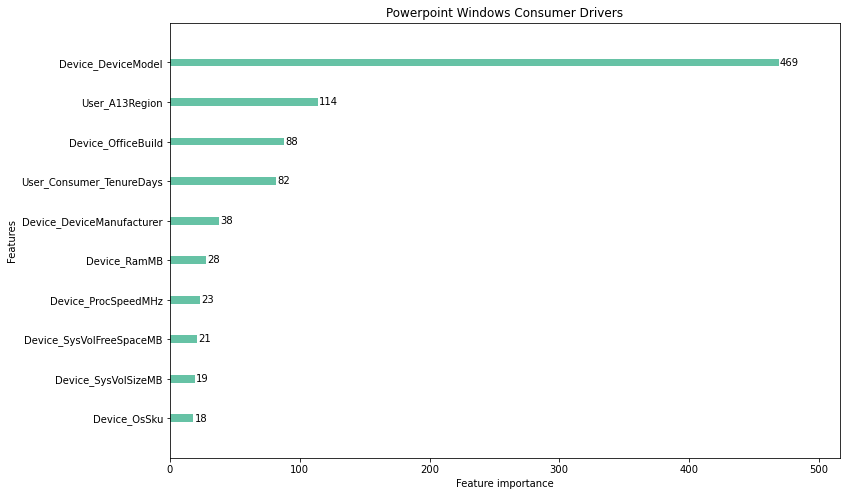

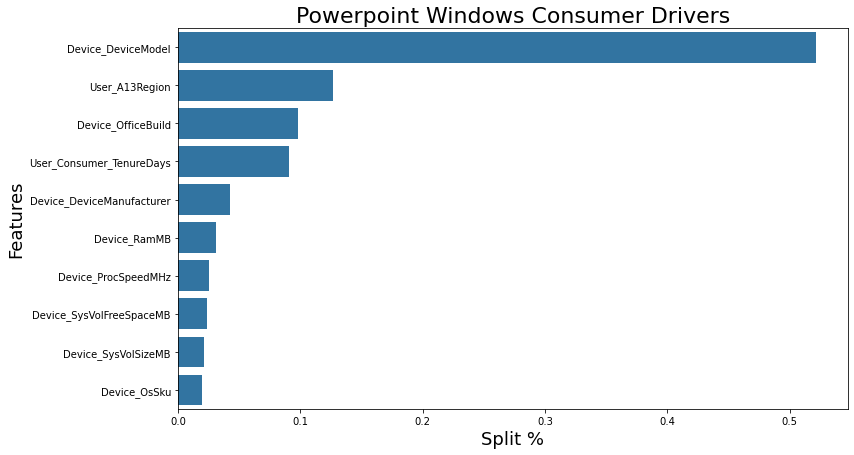

In [548]:
pp_windows_consumer_drivers = driver_analysis.find_drivers(pp_windows_consumer, 'Powerpoint Windows Consumer Drivers')

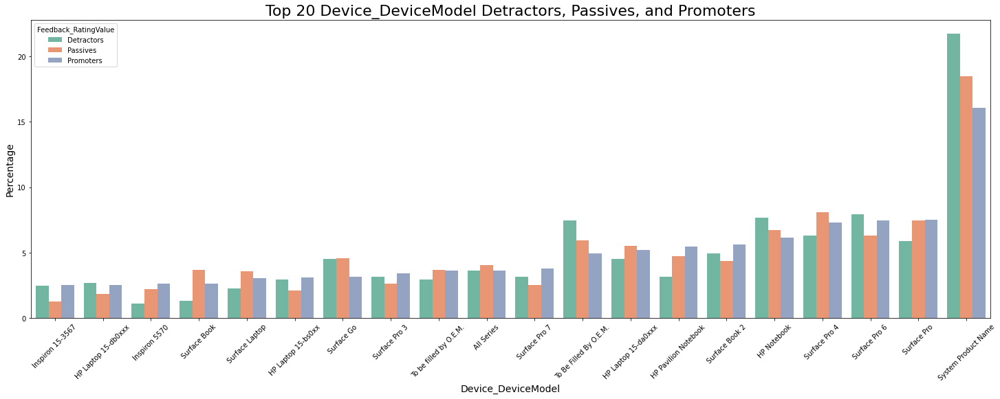

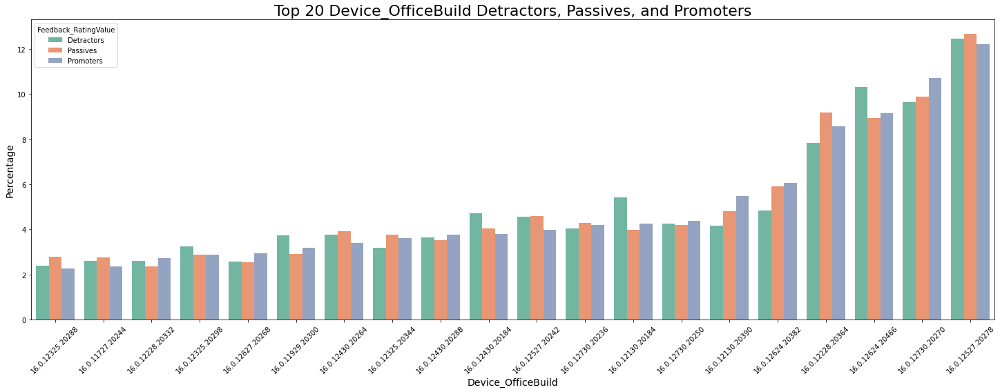

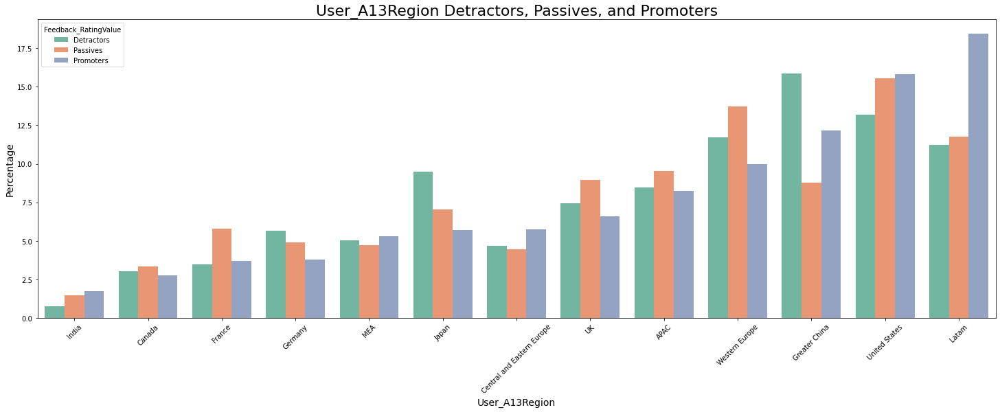

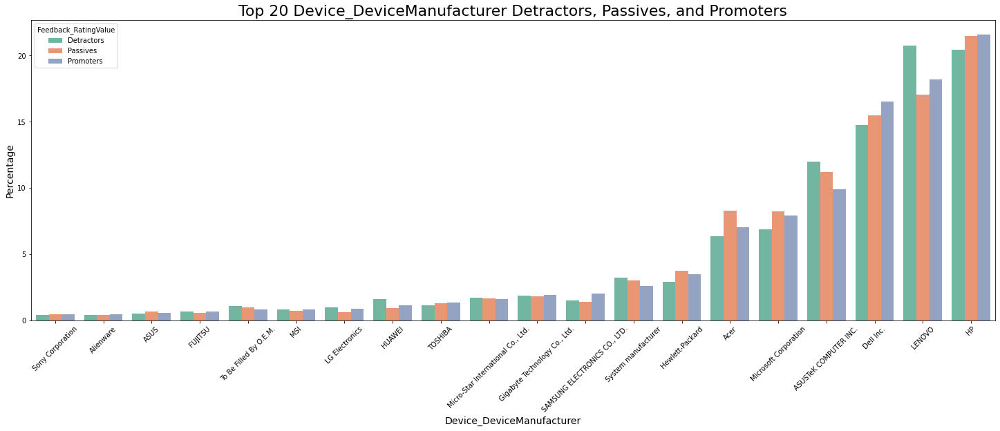

In [597]:
driver_analysis.plot_promoter_and_detractor_percentages(pp_windows_consumer_drivers)

### Powerpoint Windows Commercial Edu NPS Profile

Shape before: (30548, 251)
Shape after throwing out useless features: (30548, 162)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 18.0min remaining:  4.0min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 20.2min remaining:  1.3min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 20.4min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   57.4s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  3.9min remaining:   51.7s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.1min remaining:   15.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.3min finished


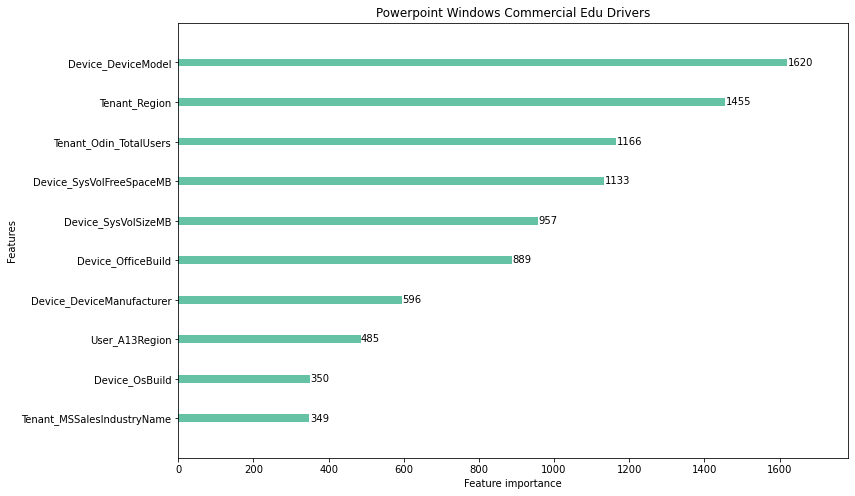

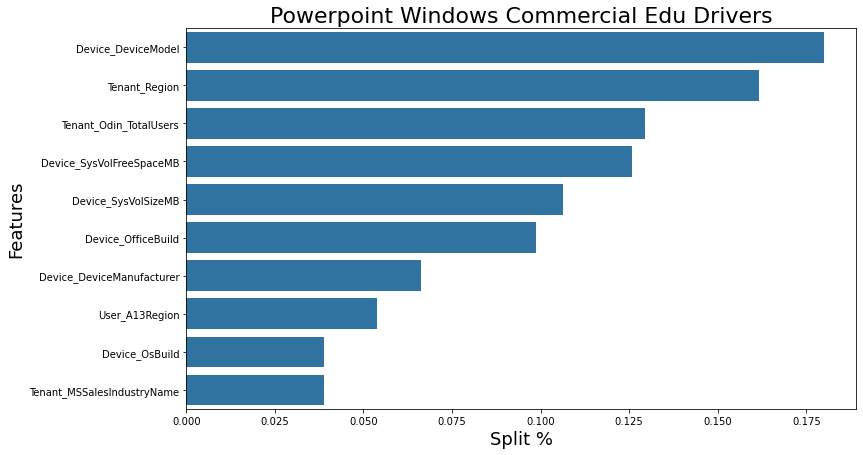

In [549]:
pp_windows_comedu_drivers = driver_analysis.find_drivers(pp_windows_comedu, 'Powerpoint Windows Commercial Edu Drivers')

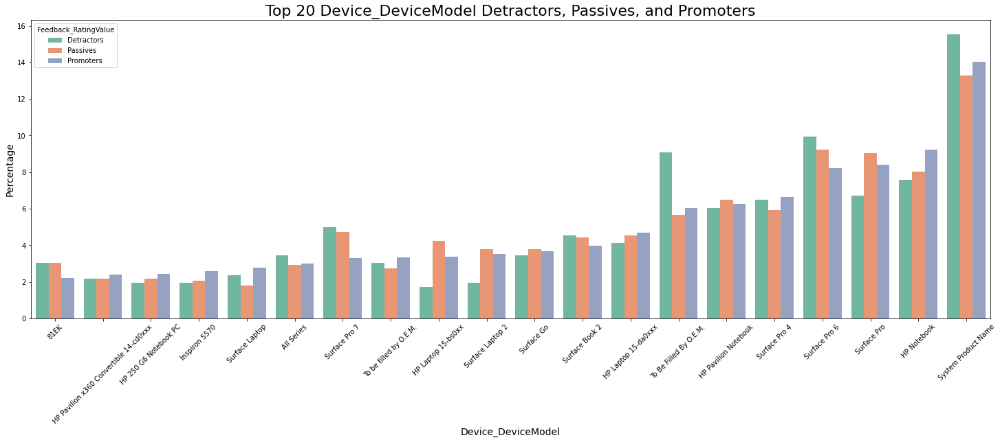

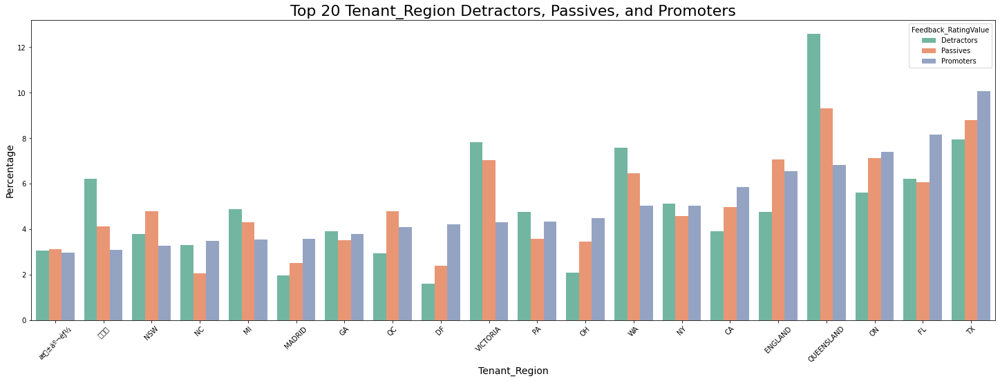

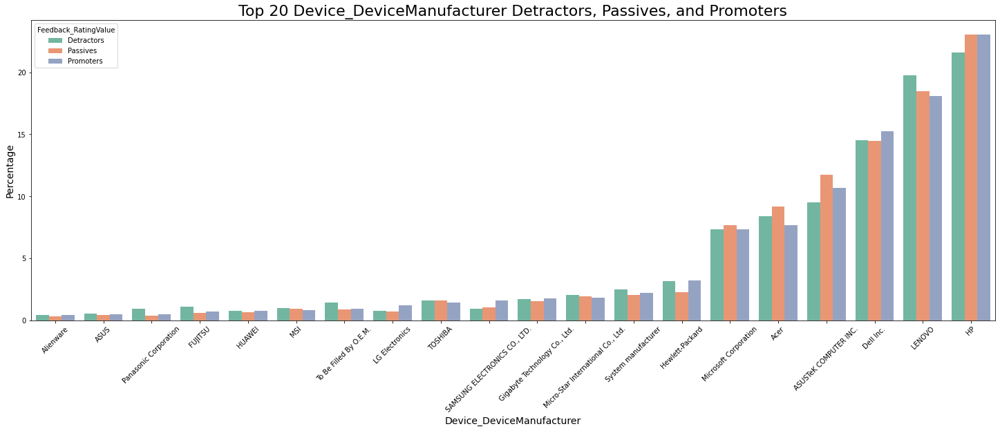

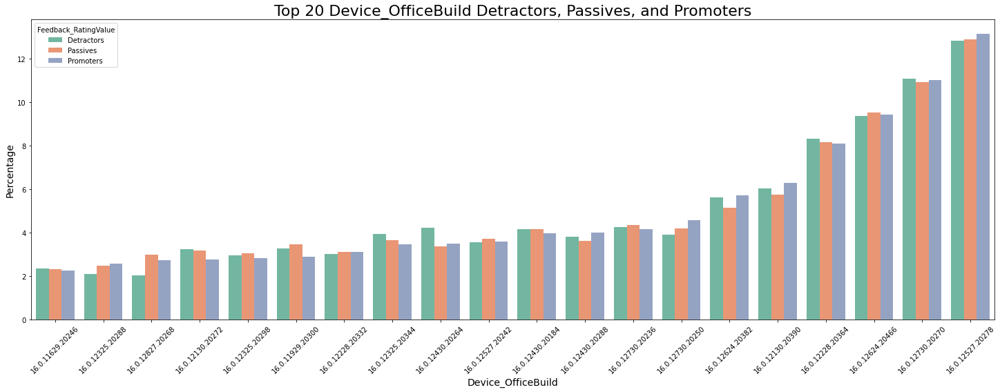

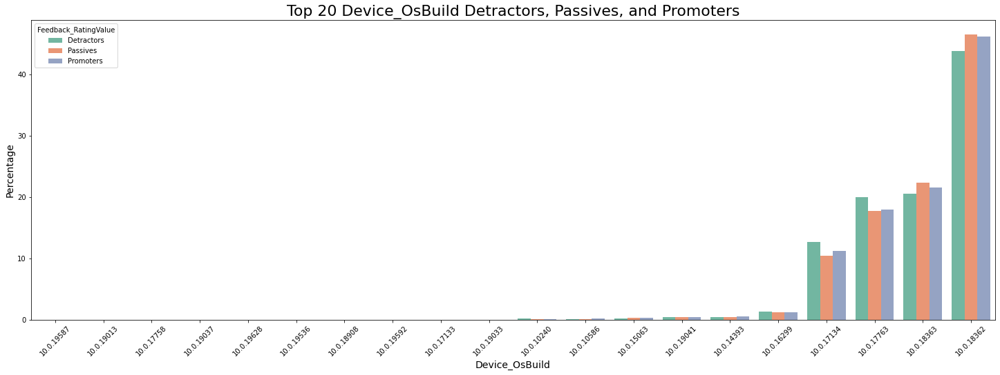

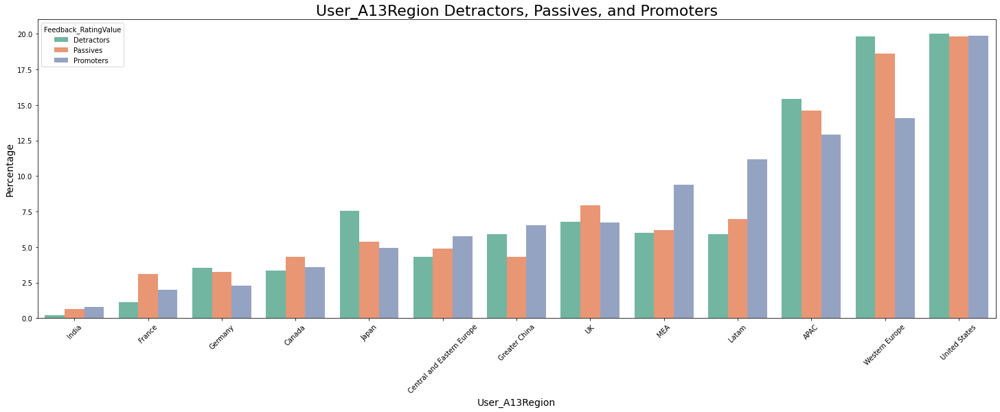

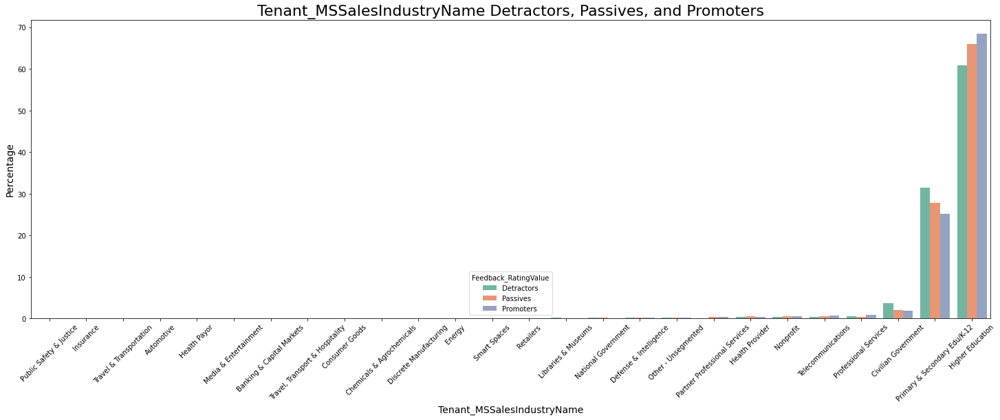

In [598]:
driver_analysis.plot_promoter_and_detractor_percentages(pp_windows_comedu_drivers)

### Powerpoint Windows Commercial Non-Edu NPS Profile

Shape before: (30180, 252)
Shape after throwing out useless features: (30180, 162)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 15.1min remaining:  3.3min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 18.6min remaining:  1.2min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 19.1min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   46.3s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  4.0min remaining:   52.2s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.5min remaining:   17.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.8min finished


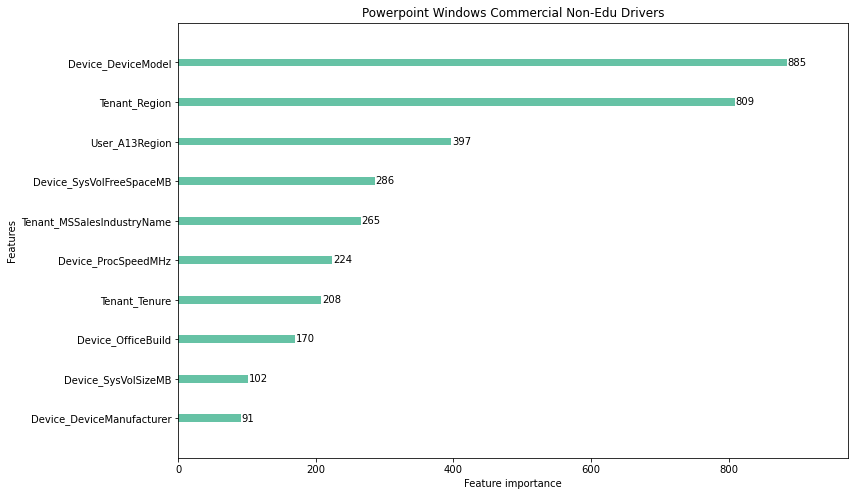

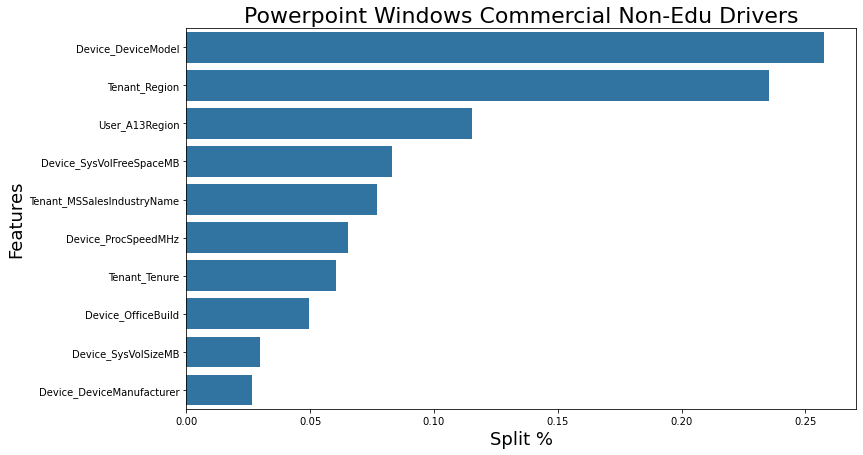

In [550]:
pp_windows_nonedu_drivers = driver_analysis.find_drivers(pp_windows_nonedu, 'Powerpoint Windows Commercial Non-Edu Drivers')

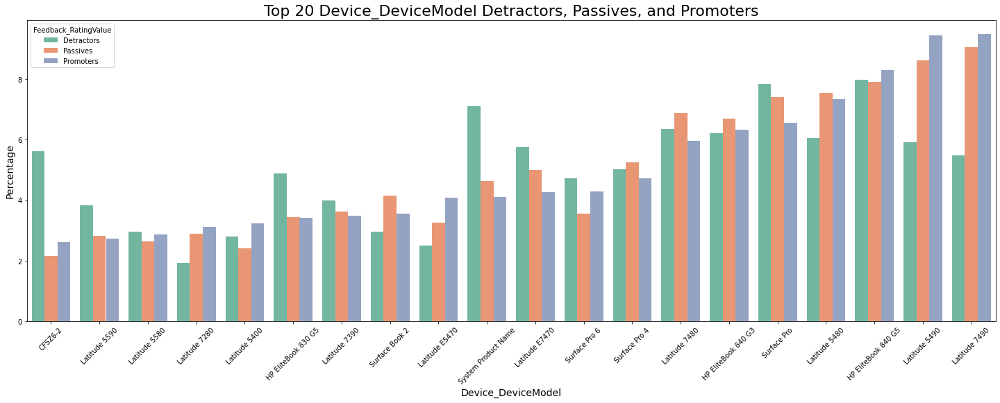

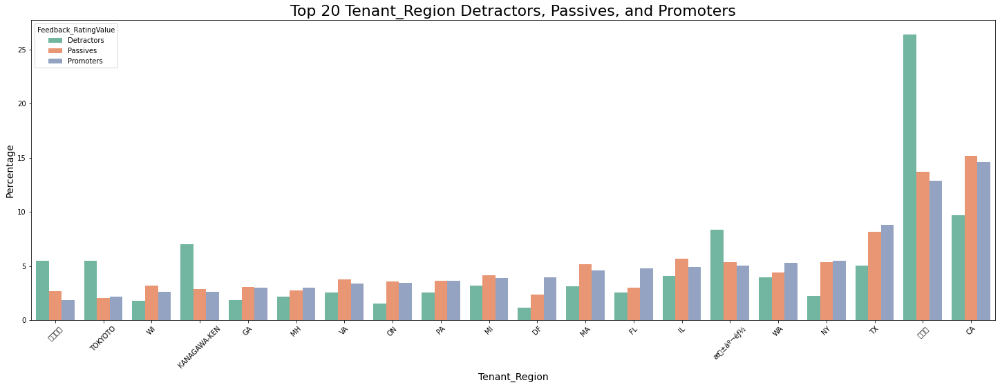

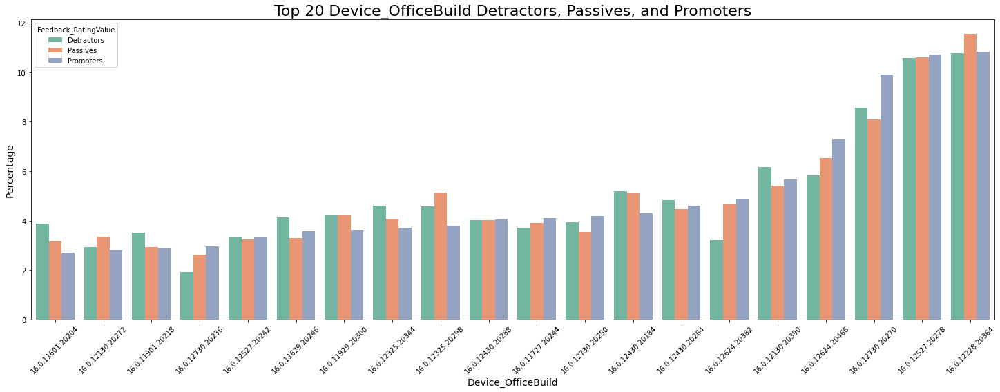

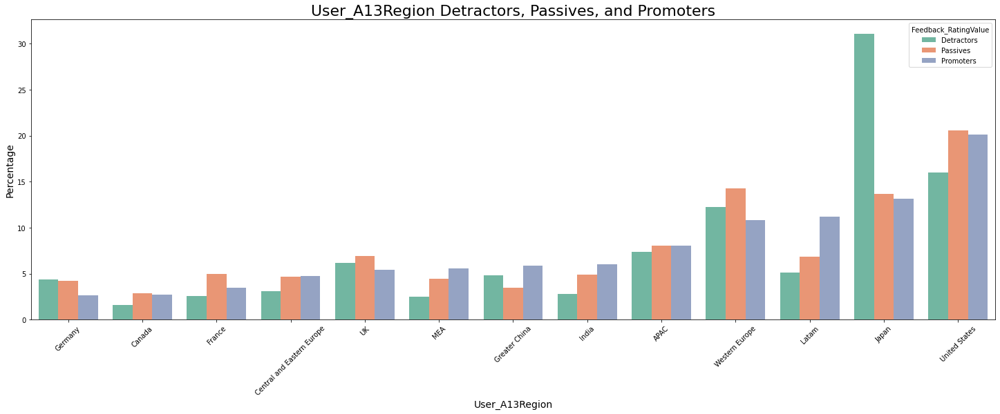

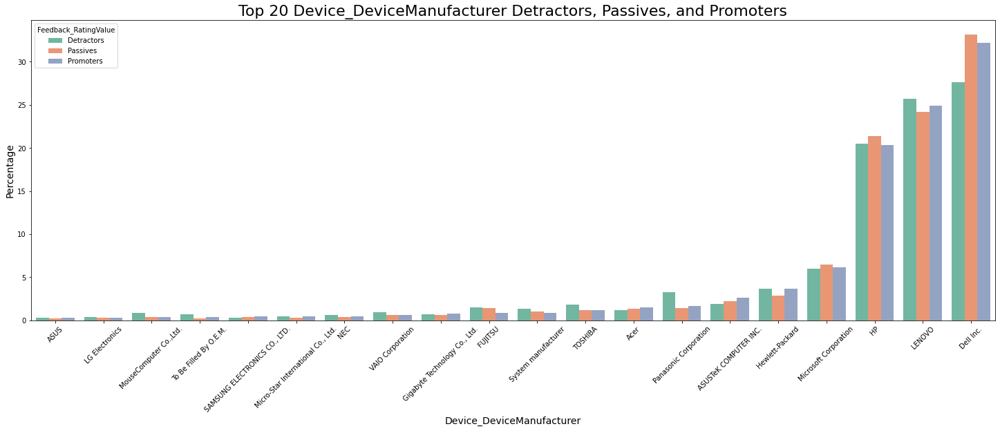

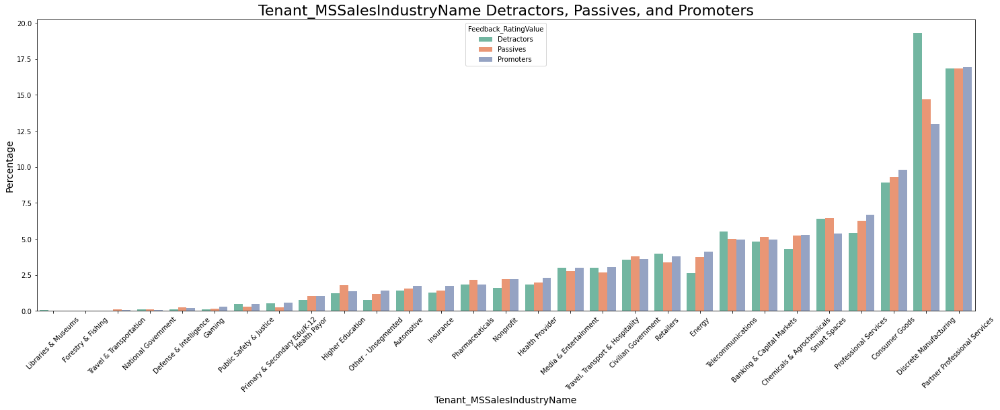

In [599]:
driver_analysis.plot_promoter_and_detractor_percentages(pp_windows_nonedu_drivers)

## Teams
- no "consumer" in web or windows

In [333]:
# get web and windows specific dfs
teams_web_consumer, teams_web_comedu, teams_web_nonedu, teams_windows_consumer, teams_windows_comedu, teams_windows_nonedu = \
                                                driver_analysis.web_and_windows_slicer('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Teams', 'Teams_Web_and_Windows.csv')

shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (14658, 321)
shape after deleting missing columns: (14658, 231)
shape before deleting missing columns: (4645, 321)
shape after deleting missing columns: (4645, 231)
shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (11246, 321)
shape after deleting missing columns: (11246, 229)
shape before deleting missing columns: (34499, 321)
shape after deleting missing columns: (34499, 234)


In [334]:
teams_nps_dfs = driver_analysis.get_detractors_and_promoters('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Teams', 'Teams_Web_and_Windows.csv')

shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (14658, 321)
shape after deleting missing columns: (14658, 231)
shape before deleting missing columns: (4645, 321)
shape after deleting missing columns: (4645, 231)
shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (11246, 321)
shape after deleting missing columns: (11246, 229)
shape before deleting missing columns: (34499, 321)
shape after deleting missing columns: (34499, 234)


Shape before: (14658, 230)
Shape after throwing out useless features: (14658, 146)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   10.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   22.9s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   40.5s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  8.0min remaining:  1.8min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  9.4min remaining:   35.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  9.8min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   24.6s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   42.1s
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:   46.8s remaining:   10.2s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:   58.9s remaining:    3.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   59.7s finished


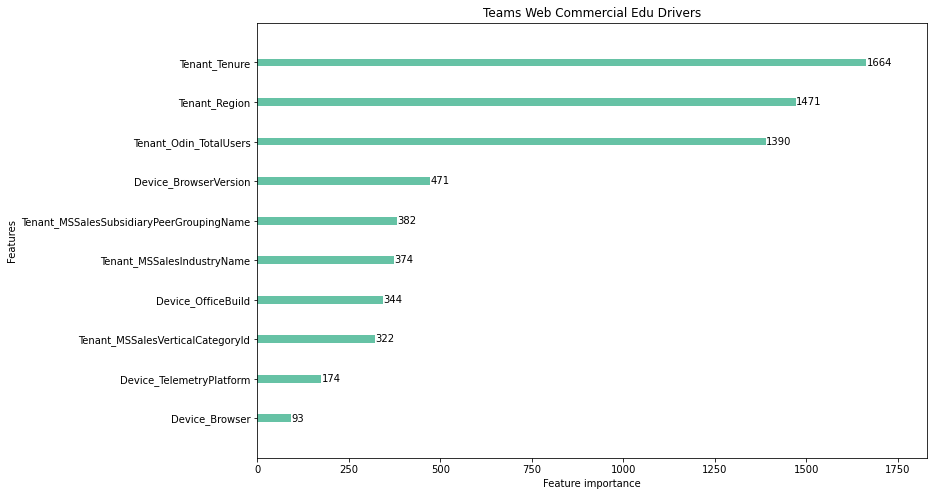

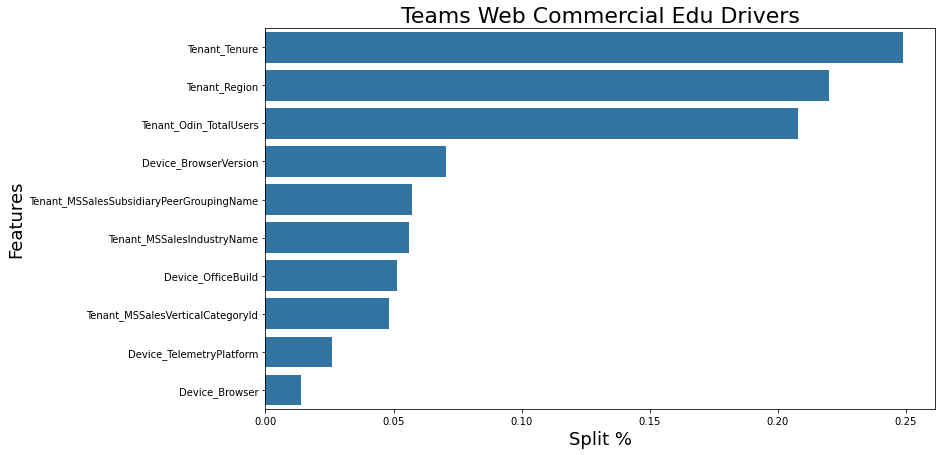

In [601]:
teams_web_comedu_drivers = driver_analysis.find_drivers(teams_web_comedu, 'Teams Web Commercial Edu Drivers')

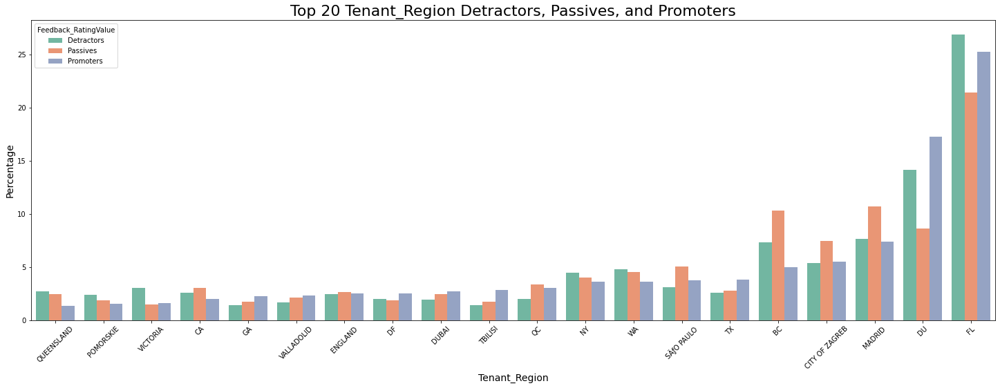

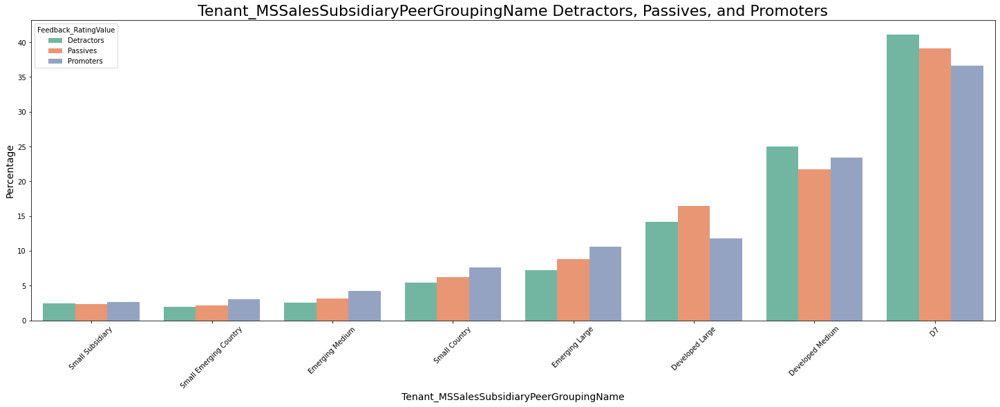

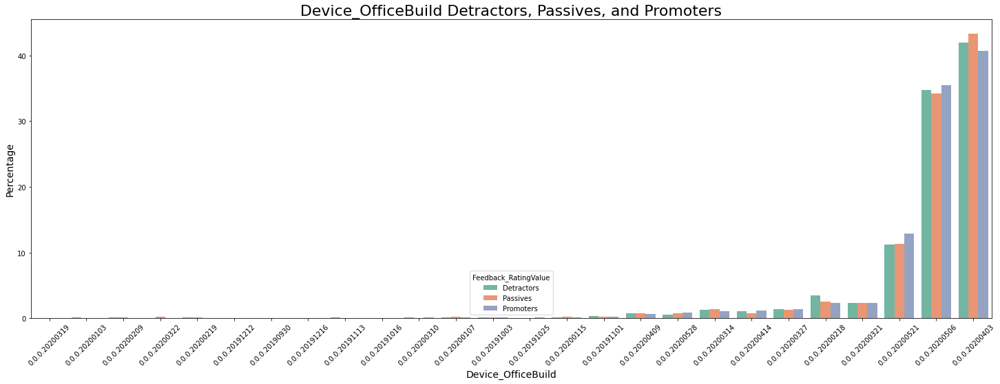

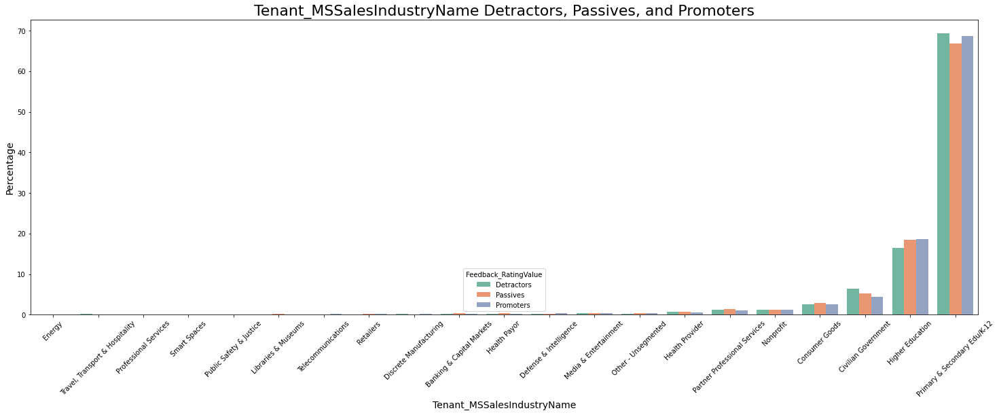

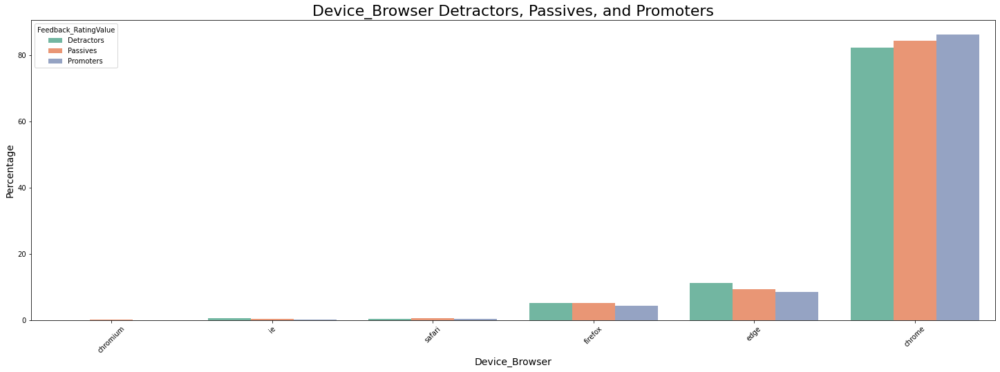

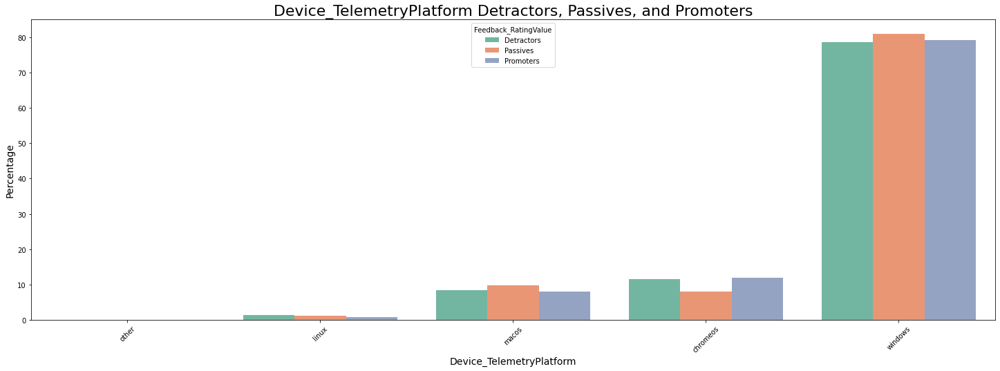

In [616]:
driver_analysis.plot_promoter_and_detractor_percentages(teams_web_comedu_drivers)

### Teams Web Commercial Non-Edu NPS Profile

Shape before: (4645, 230)
Shape after throwing out useless features: (4645, 146)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   44.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  2.3min remaining:   30.2s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  2.8min remaining:   10.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.9min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   20.9s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   26.7s
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:   38.6s remaining:    8.4s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:   45.1s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   47.2s finished


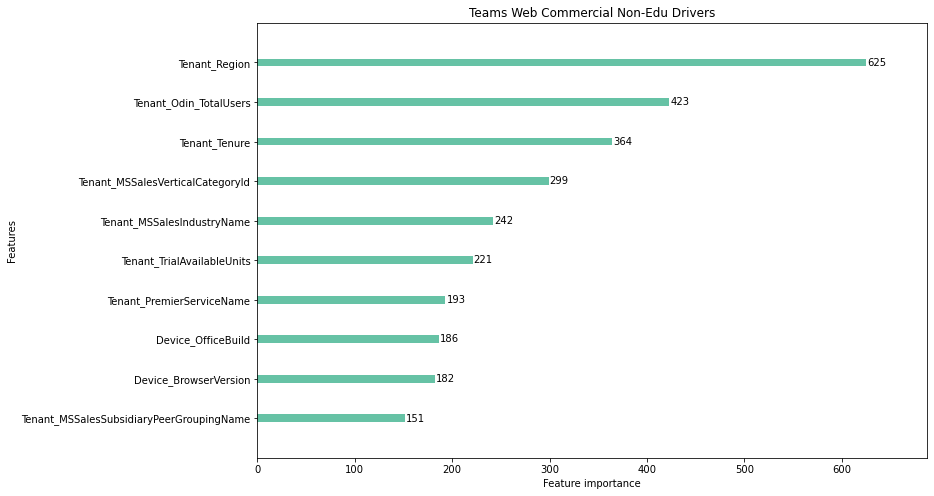

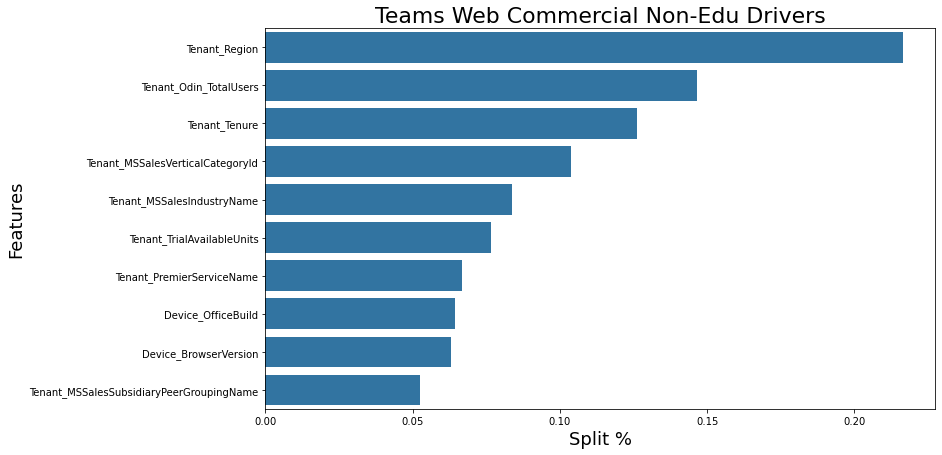

In [602]:
teams_web_nonedu_drivers = driver_analysis.find_drivers(teams_web_nonedu, 'Teams Web Commercial Non-Edu Drivers')

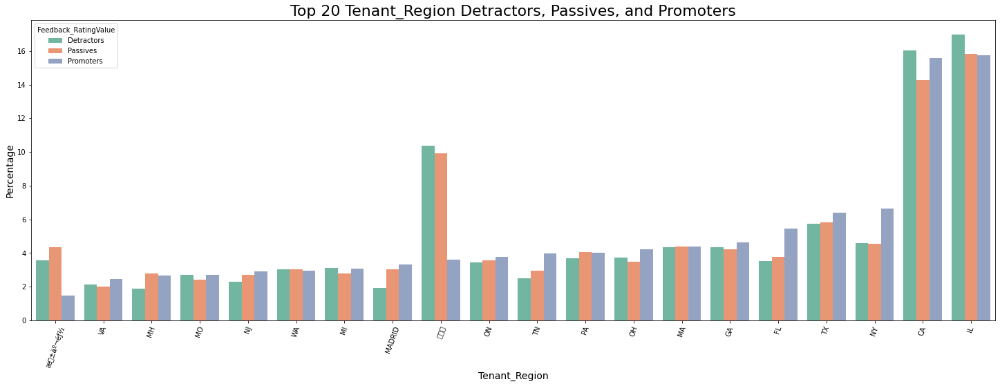

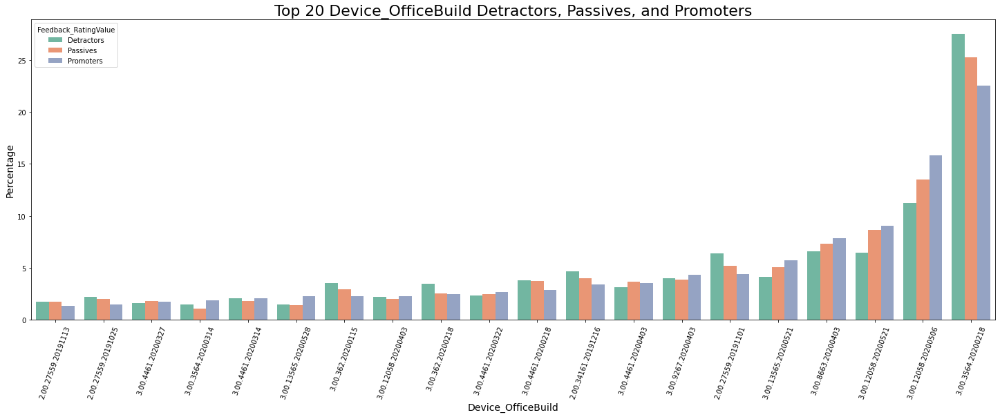

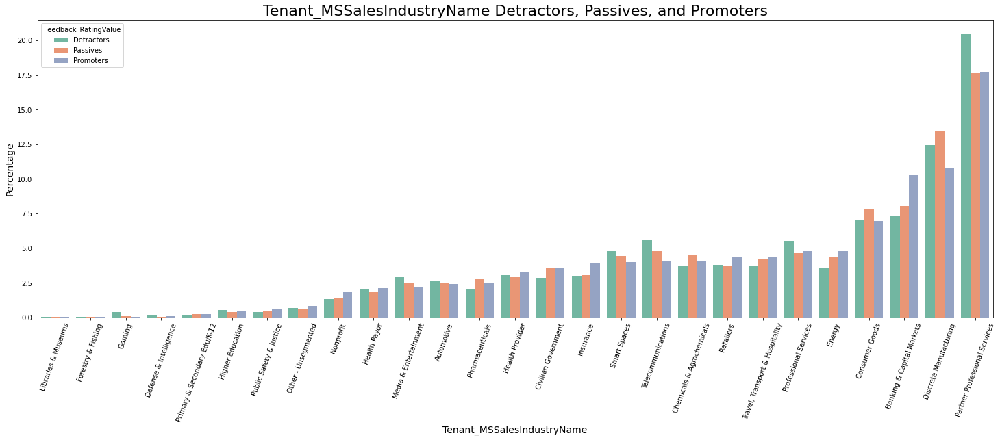

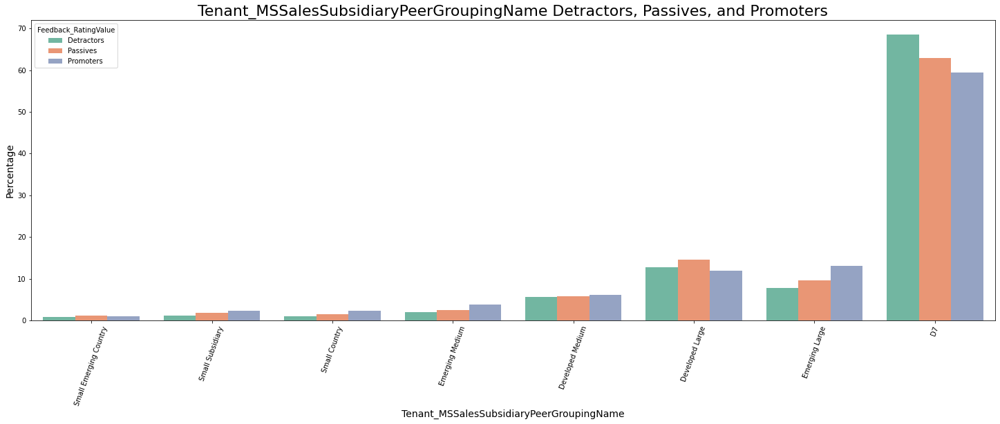

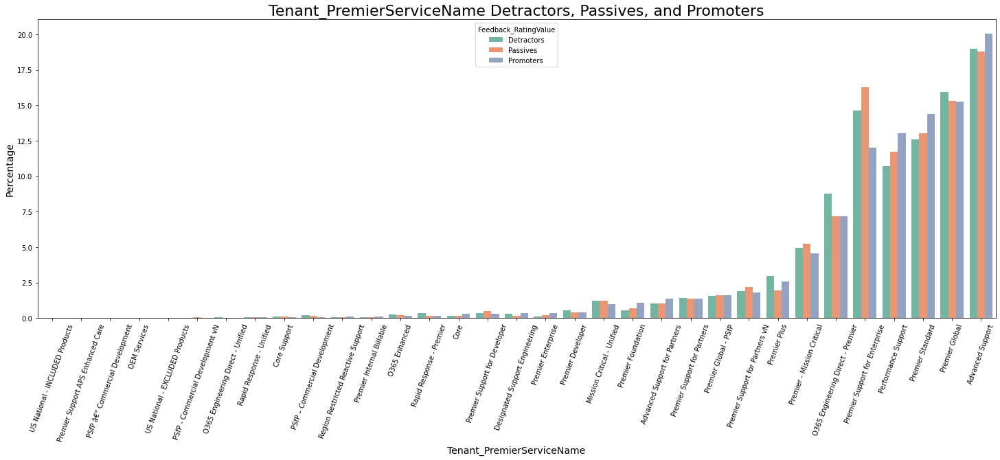

In [619]:
driver_analysis.plot_promoter_and_detractor_percentages(teams_windows_nonedu_drivers)

### Teams Windows Commercial Edu NPS Profile

Shape before: (11246, 228)
Shape after throwing out useless features: (11246, 146)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   22.5s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  5.8min remaining:  1.3min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  6.1min remaining:   23.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  6.5min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   23.9s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   28.9s
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:   32.4s remaining:    7.0s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:   44.7s remaining:    2.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   46.6s finished


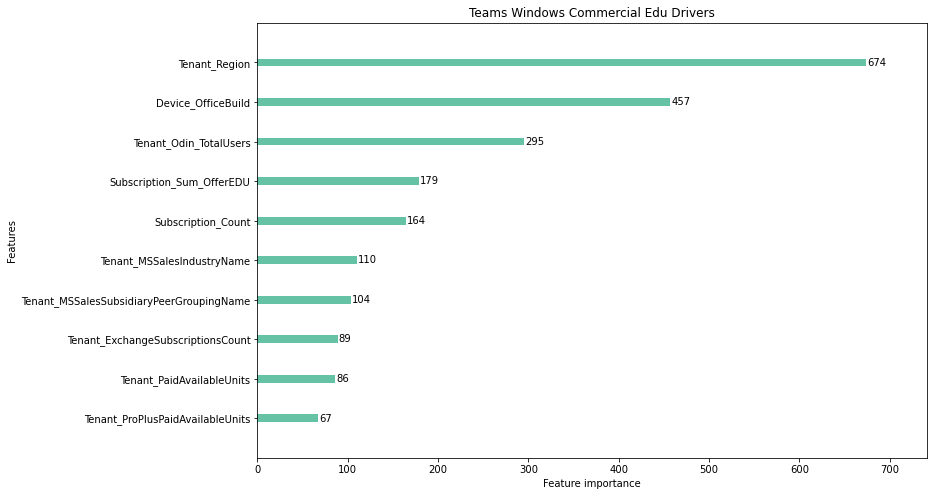

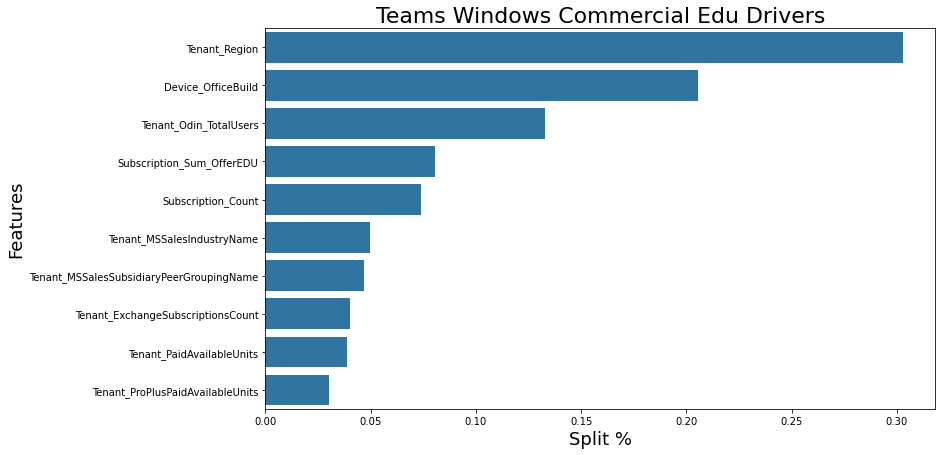

In [603]:
teams_windows_comedu_drivers = driver_analysis.find_drivers(teams_windows_comedu, 'Teams Windows Commercial Edu Drivers')

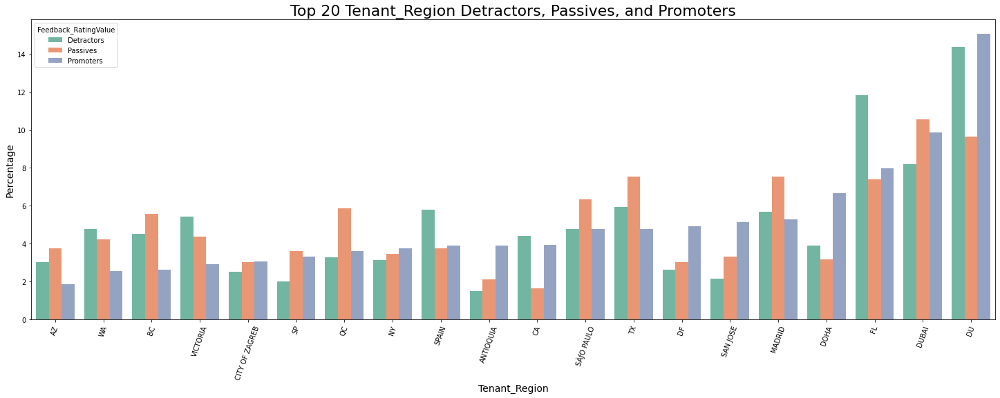

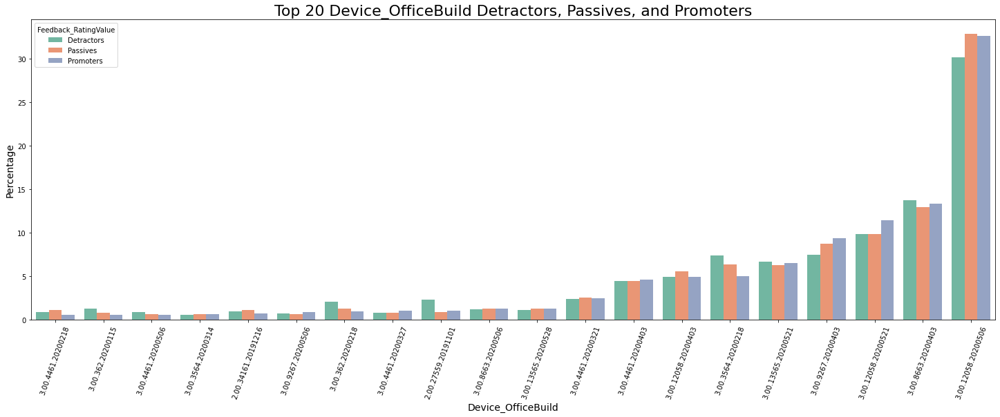

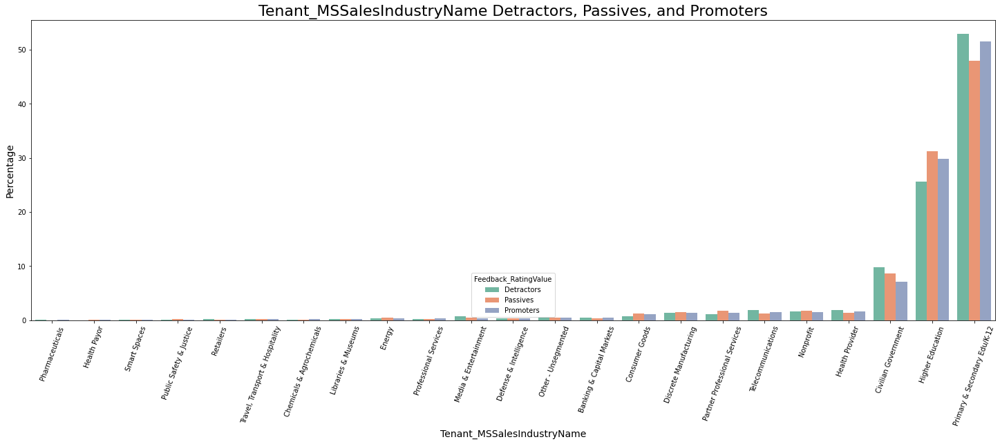

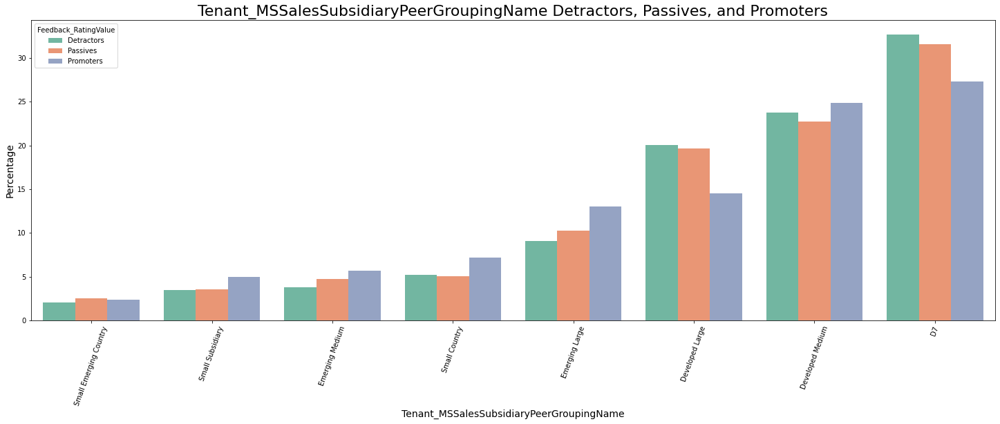

In [620]:
driver_analysis.plot_promoter_and_detractor_percentages(teams_windows_comedu_drivers)

### Teams Windows Commercial Non-Edu NPS Profile

Shape before: (34499, 233)
Shape after throwing out useless features: (34499, 148)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   16.8s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  8.6min remaining:  1.9min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  9.7min remaining:   37.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 10.0min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   17.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   37.4s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   42.0s
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:   45.5s remaining:    9.9s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  1.2min remaining:    4.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.2min finished


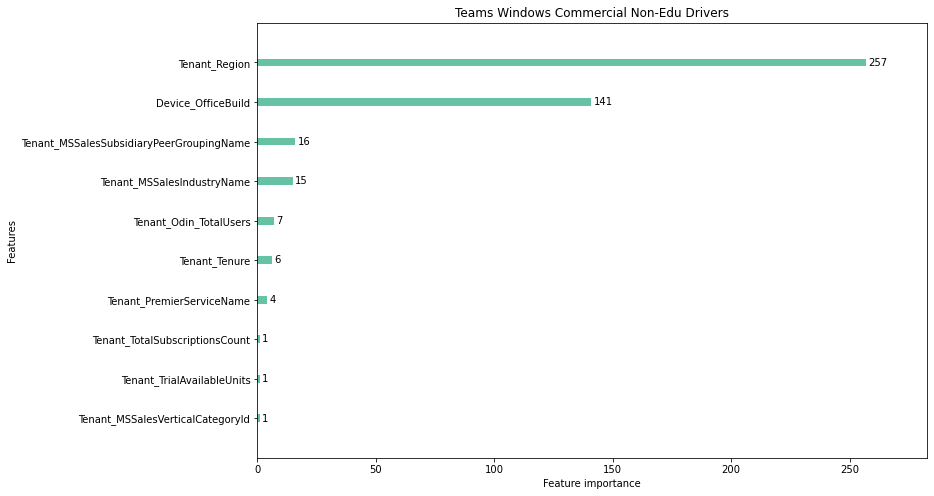

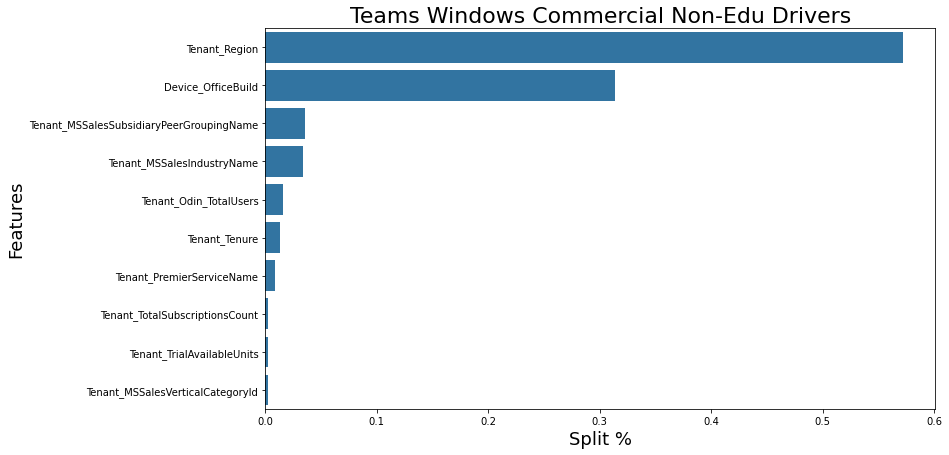

In [604]:
teams_windows_nonedu_drivers = driver_analysis.find_drivers(teams_windows_nonedu, 'Teams Windows Commercial Non-Edu Drivers')

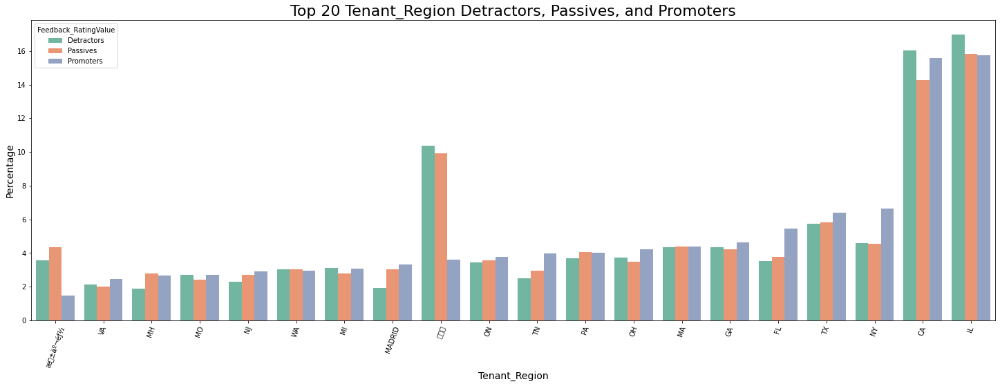

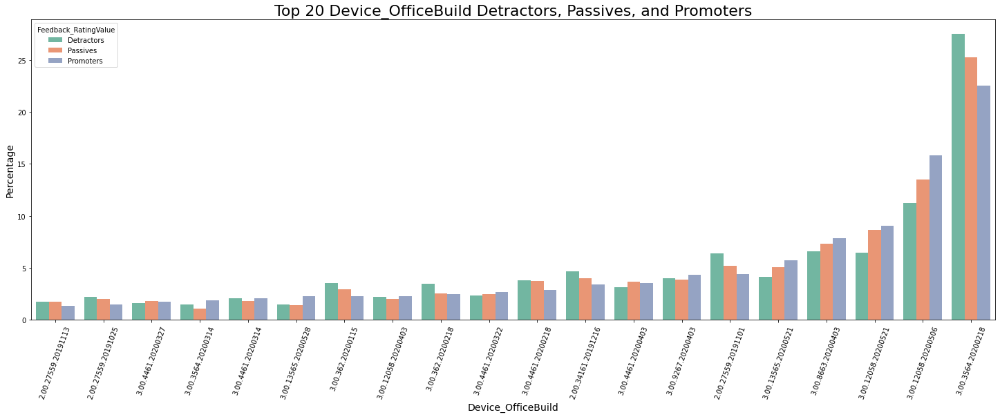

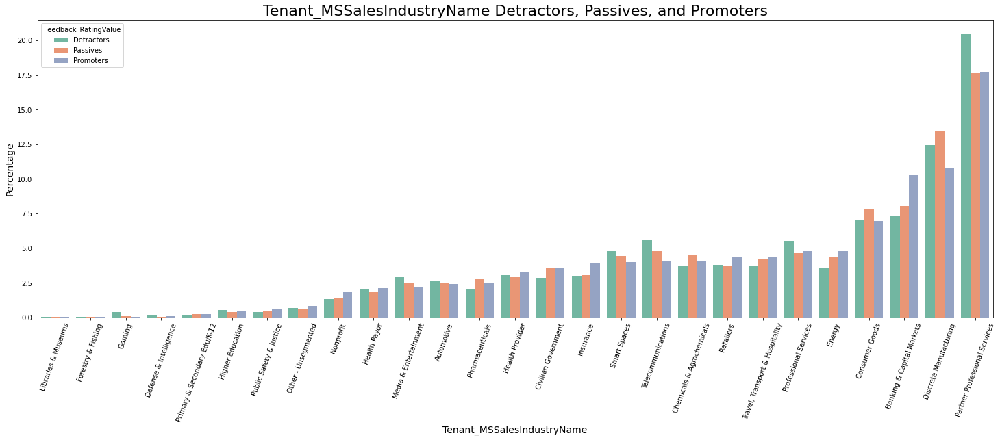

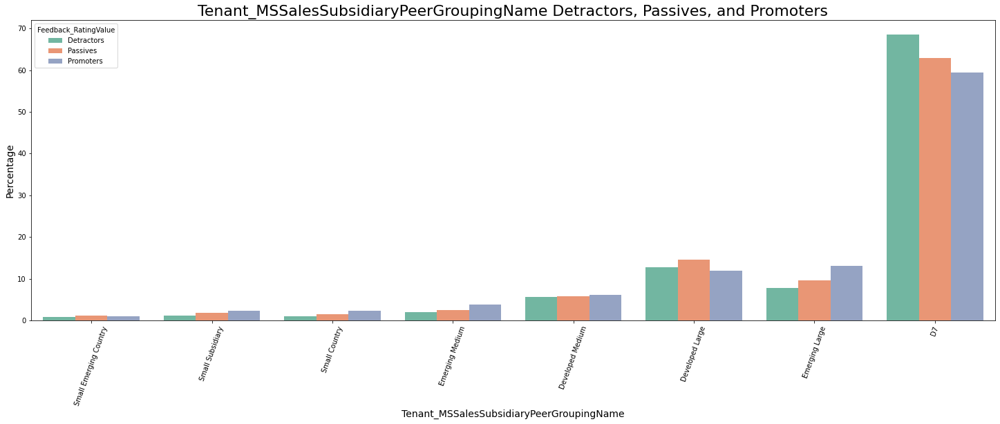

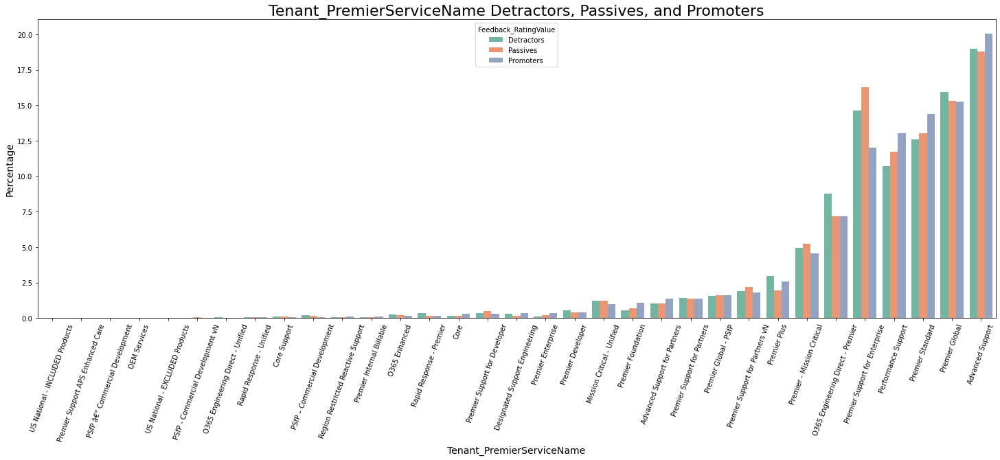

In [621]:
driver_analysis.plot_promoter_and_detractor_percentages(teams_windows_nonedu_drivers)

## Word
- web and windows

In [335]:
# get web and windows specific dfs
word_web_consumer, word_web_comedu, word_web_nonedu, word_windows_consumer, word_windows_comedu, word_windows_nonedu = \
                                                driver_analysis.web_and_windows_slicer('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Word', 'Word_Web_and_Windows.csv')

shape before deleting missing columns: (24726, 321)
shape after deleting missing columns: (24726, 39)
shape before deleting missing columns: (59757, 321)
shape after deleting missing columns: (59757, 240)
shape before deleting missing columns: (16908, 321)
shape after deleting missing columns: (16908, 240)
shape before deleting missing columns: (48245, 321)
shape after deleting missing columns: (48245, 74)
shape before deleting missing columns: (28294, 321)
shape after deleting missing columns: (28294, 253)
shape before deleting missing columns: (27167, 321)
shape after deleting missing columns: (27167, 252)


In [336]:
word_nps_dfs = driver_analysis.get_detractors_and_promoters('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Word', 'Word_Web_and_Windows.csv')

shape before deleting missing columns: (24726, 321)
shape after deleting missing columns: (24726, 39)
shape before deleting missing columns: (59757, 321)
shape after deleting missing columns: (59757, 240)
shape before deleting missing columns: (16908, 321)
shape after deleting missing columns: (16908, 240)
shape before deleting missing columns: (48245, 321)
shape after deleting missing columns: (48245, 74)
shape before deleting missing columns: (28294, 321)
shape after deleting missing columns: (28294, 253)
shape before deleting missing columns: (27167, 321)
shape after deleting missing columns: (27167, 252)


### Word Web Consumer NPS Profile

Shape before: (24726, 38)
Shape after throwing out useless features: (24726, 13)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   18.5s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   26.4s
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:   29.0s remaining:    6.3s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:   41.7s remaining:    2.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   42.6s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   22.1s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   35.4s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   48.1s
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:   55.1s remaining:   12.0s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  1.0min remaining:    3.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.1min finished


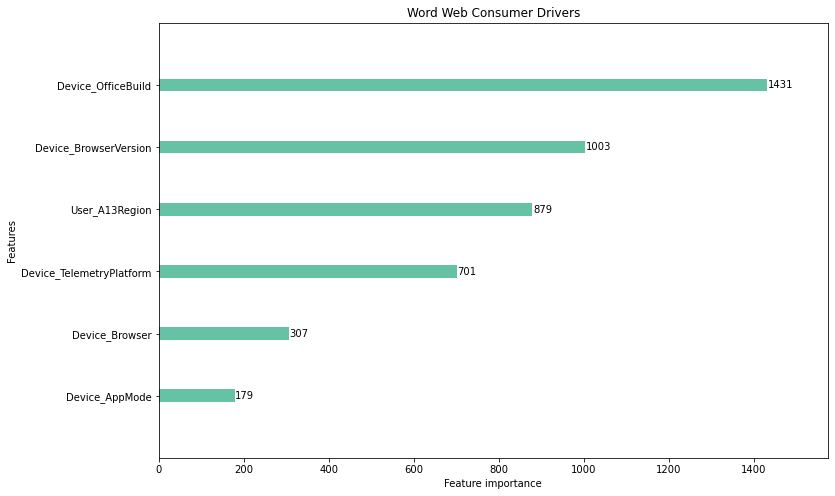

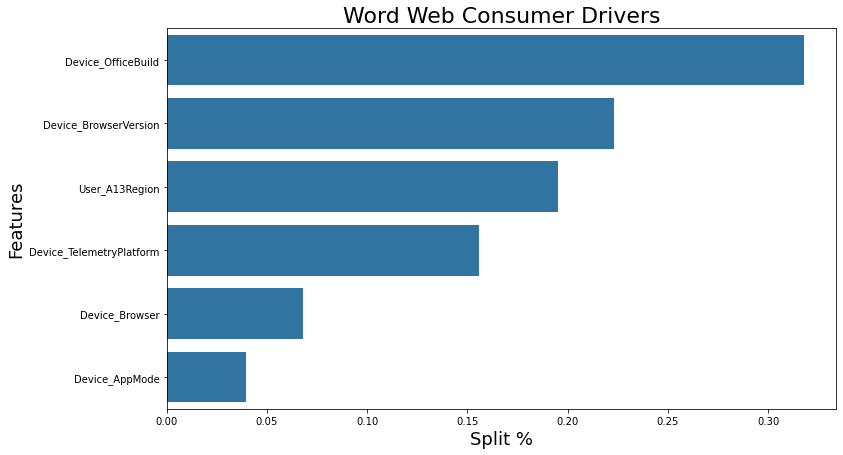

In [605]:
word_web_consumer_drivers = driver_analysis.find_drivers(word_web_consumer, 'Word Web Consumer Drivers')

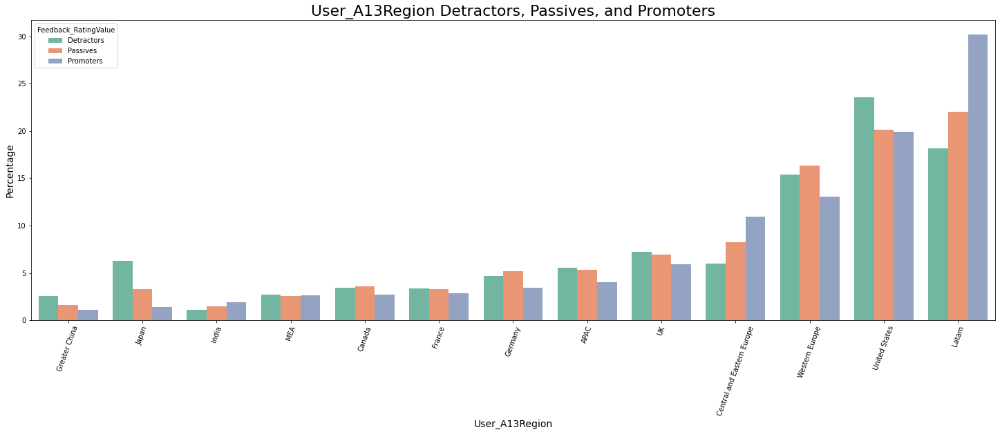

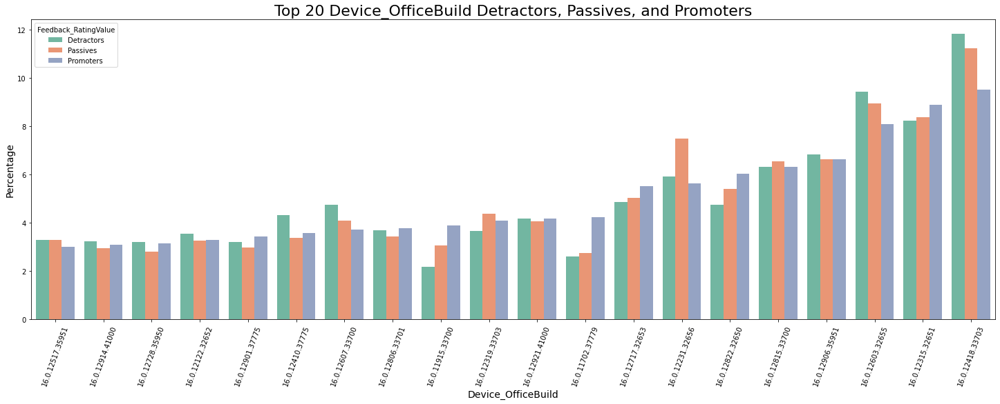

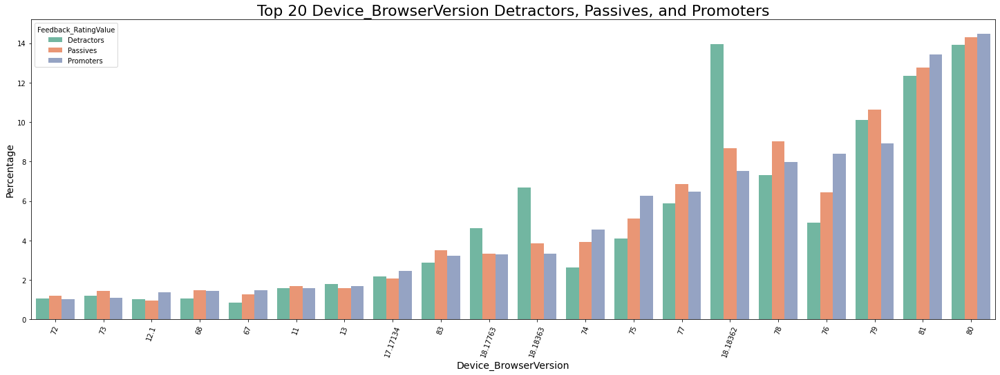

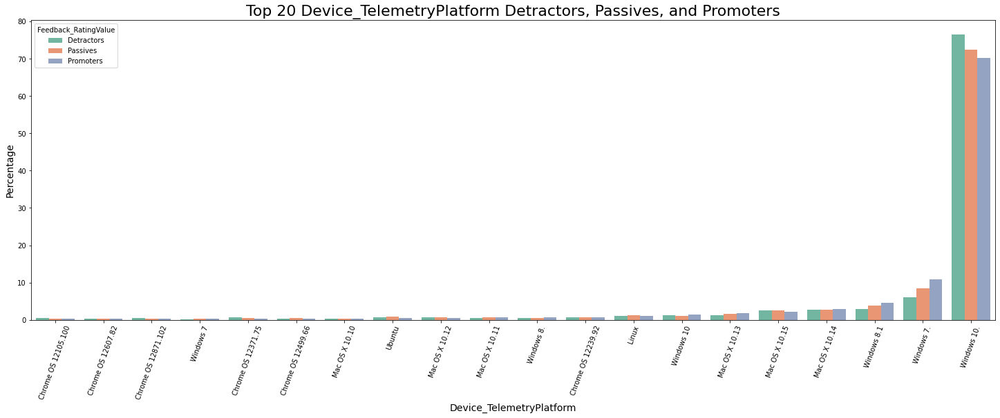

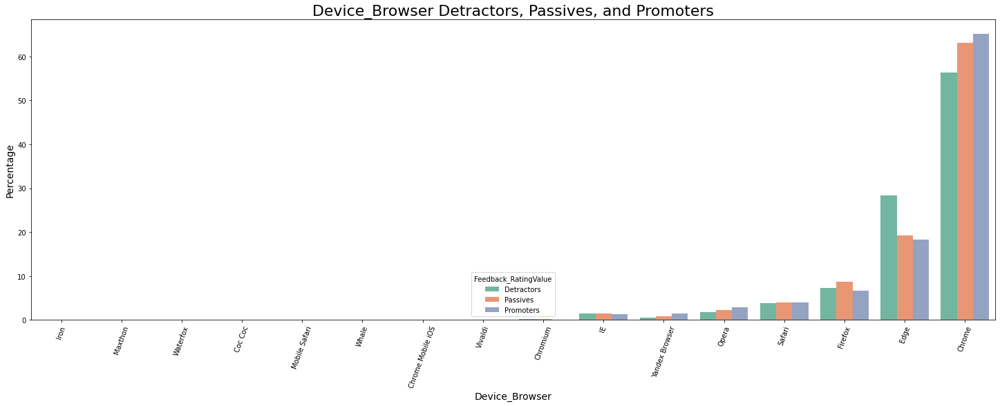

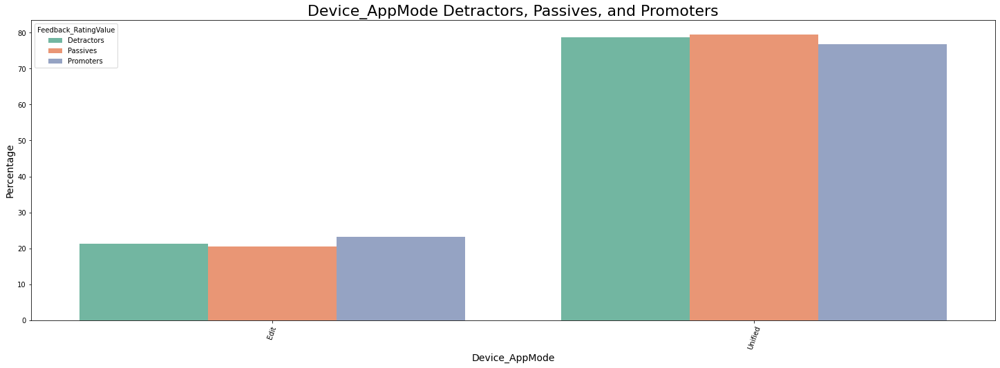

In [622]:
driver_analysis.plot_promoter_and_detractor_percentages(word_web_consumer_drivers)

### Word Web Commercial Edu NPS Profile

Shape before: (59757, 239)
Shape after throwing out useless features: (59757, 151)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   15.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   54.1s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  9.8min remaining:  2.1min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 11.1min remaining:   42.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 11.7min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   26.4s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   55.5s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  2.4min remaining:   31.9s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  2.8min remaining:   10.7s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  3.0min finished


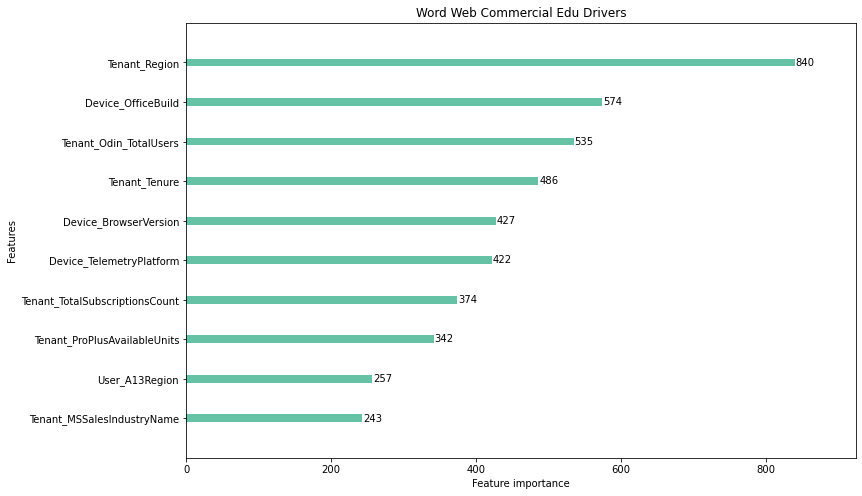

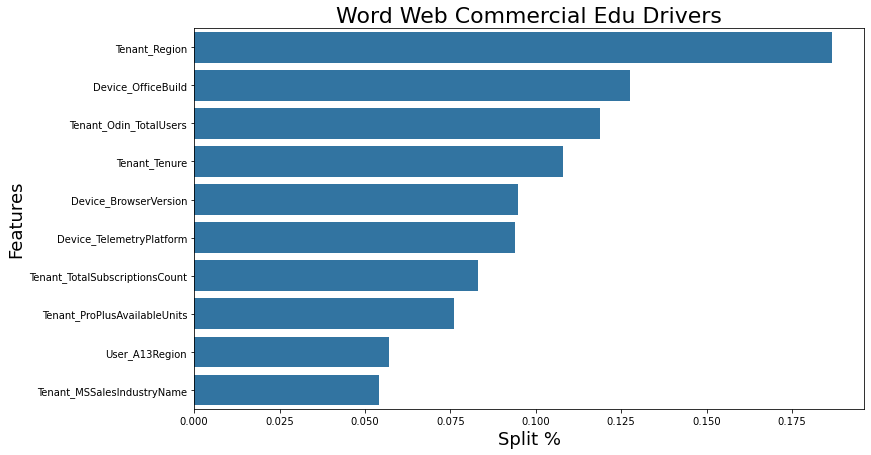

In [606]:
word_web_comedu_drivers = driver_analysis.find_drivers(word_web_comedu, 'Word Web Commercial Edu Drivers')

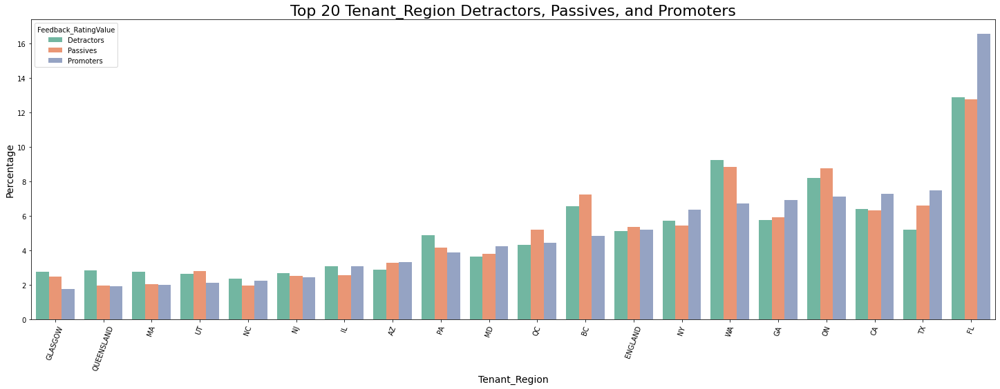

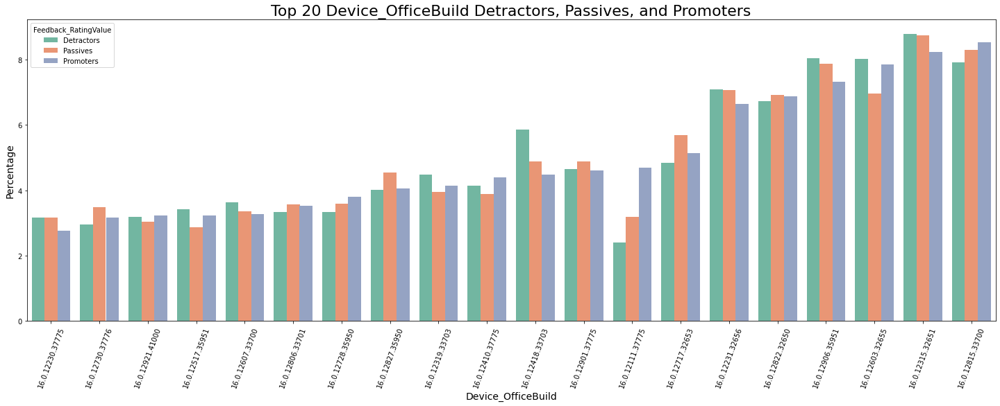

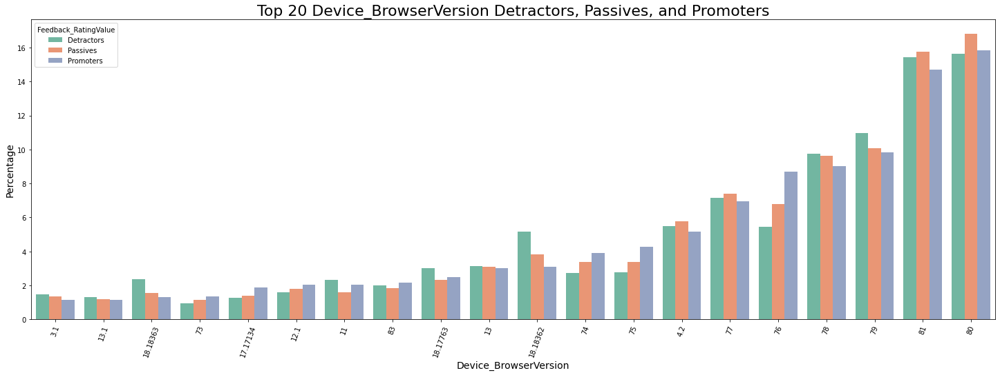

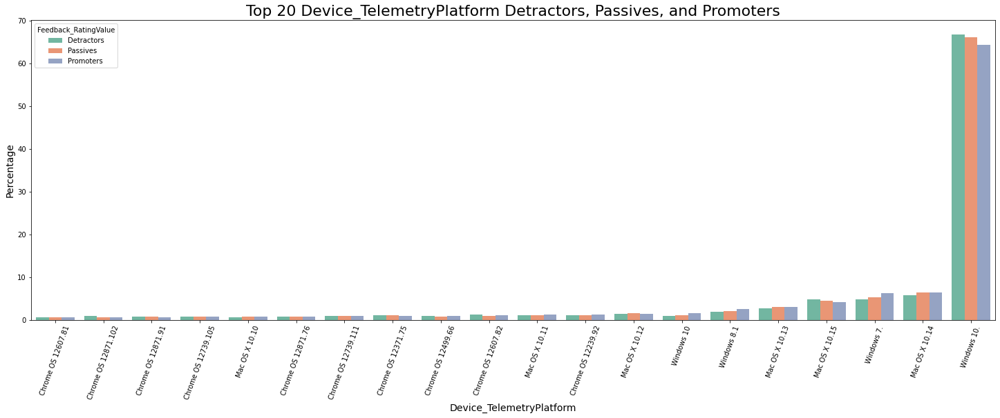

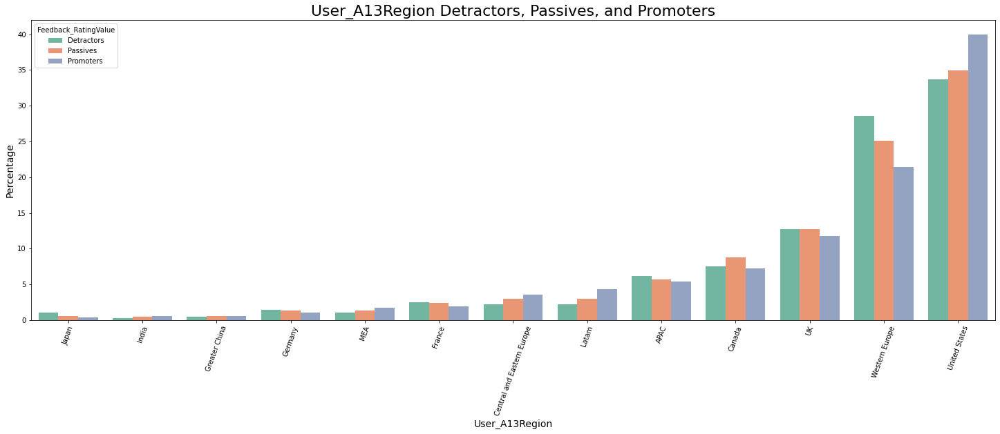

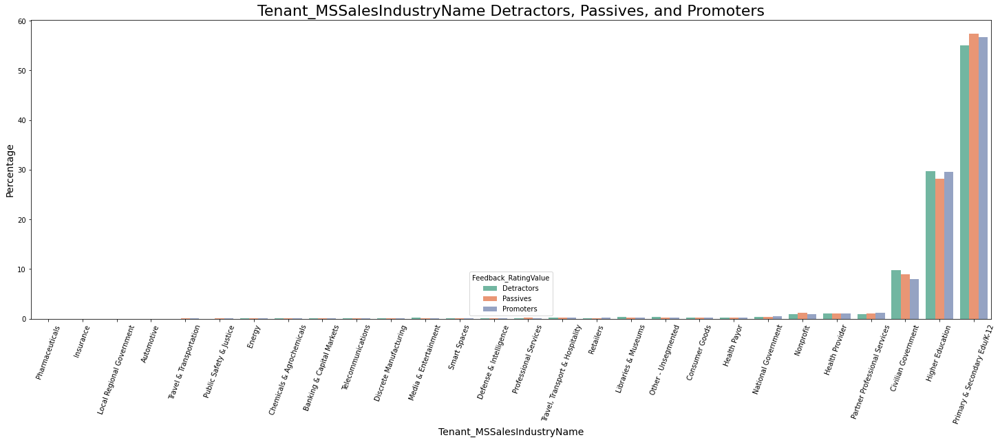

In [623]:
driver_analysis.plot_promoter_and_detractor_percentages(word_web_comedu_drivers)

### Word Web Commercial Non-Edu NPS Profile

Shape before: (16908, 239)
Shape after throwing out useless features: (16908, 151)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  4.2min remaining:   55.1s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.5min remaining:   17.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.6min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   27.5s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   32.3s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   52.1s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  1.3min remaining:   17.2s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  1.5min remaining:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  1.5min finished


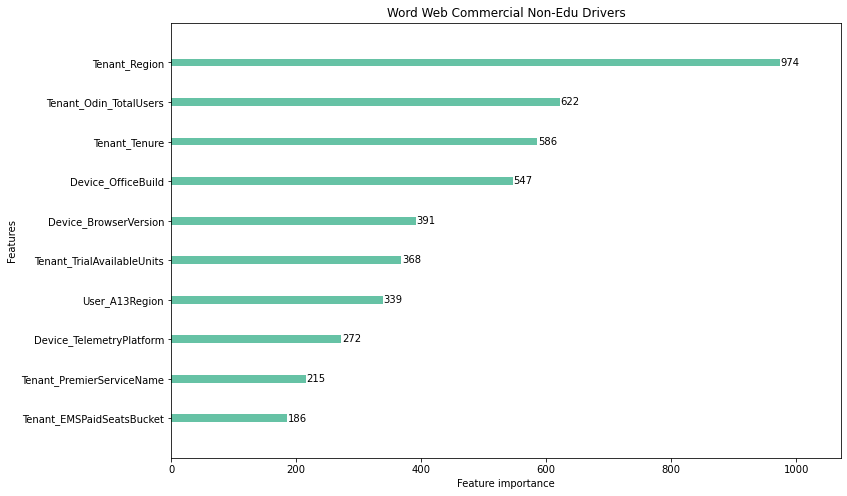

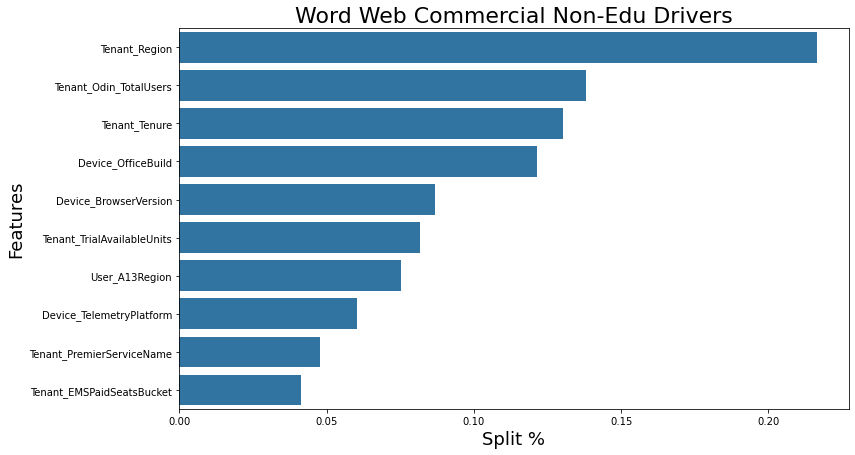

In [607]:
word_web_nonedu_drivers = driver_analysis.find_drivers(word_web_nonedu, 'Word Web Commercial Non-Edu Drivers')

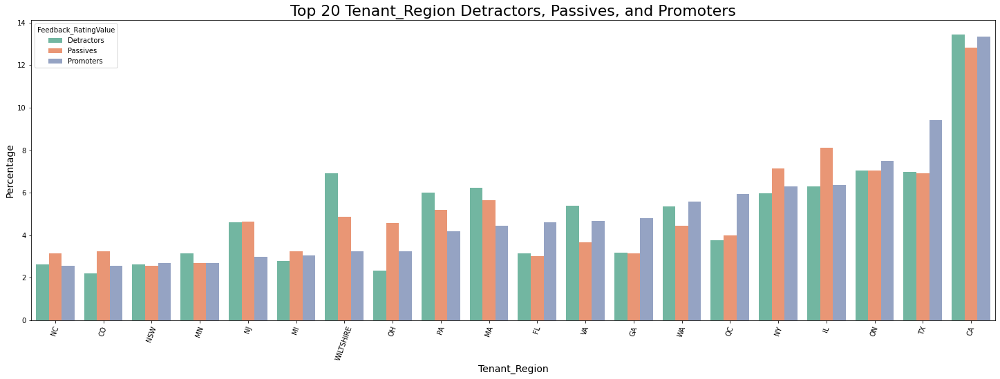

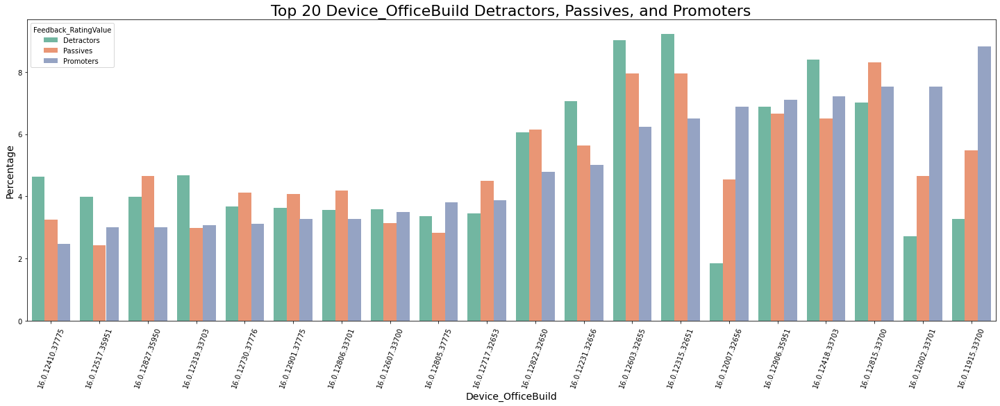

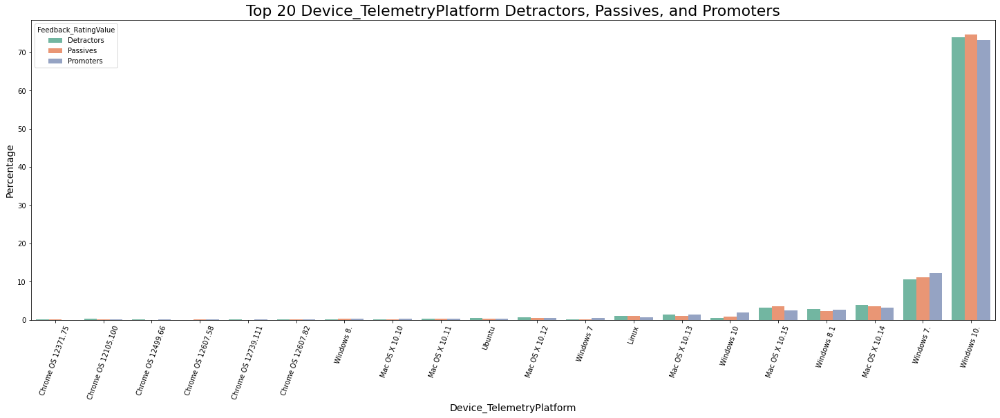

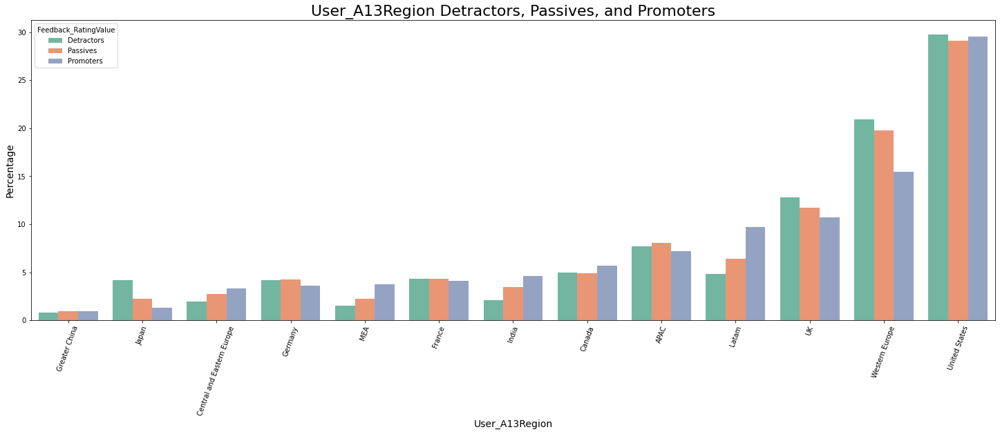

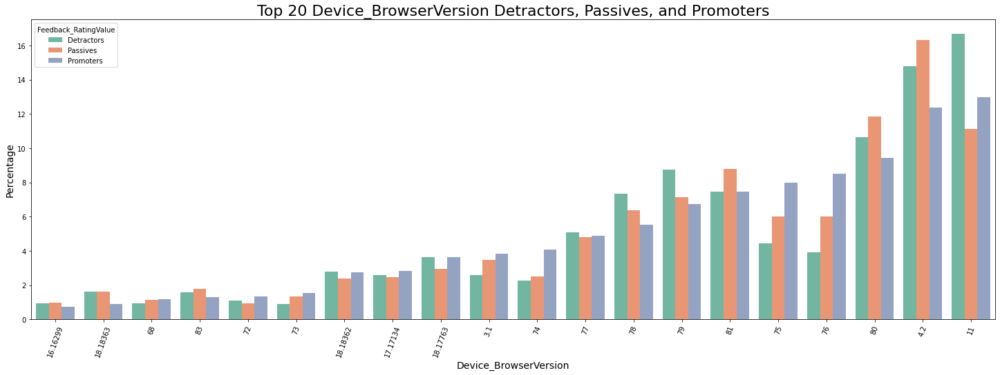

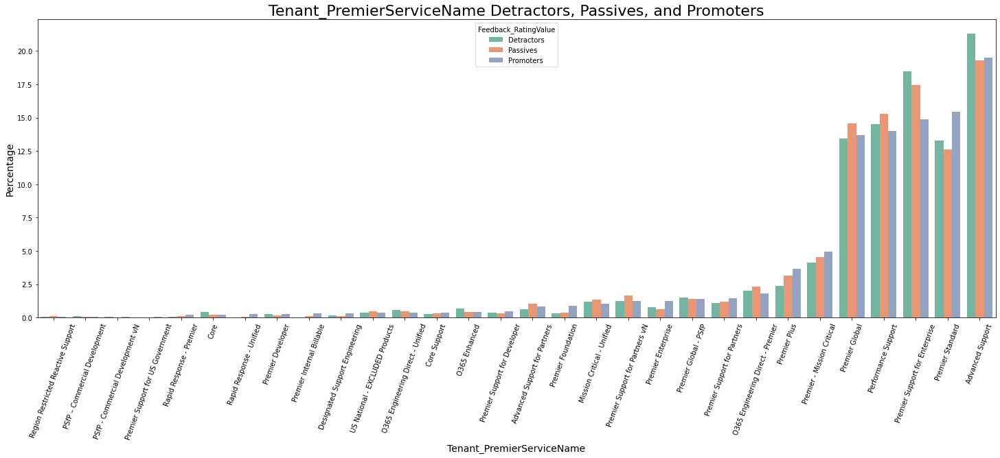

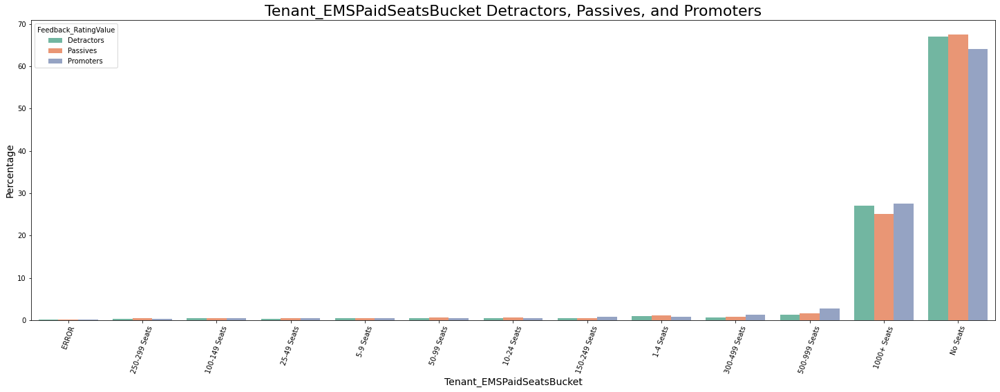

In [624]:
driver_analysis.plot_promoter_and_detractor_percentages(word_web_nonedu_drivers)

### Word Windows Consumer NPS Profile

Shape before: (48245, 73)
Shape after throwing out useless features: (48245, 43)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    4.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   51.7s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  3.8min remaining:   50.6s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.8min remaining:   18.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.9min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   58.7s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  2.1min remaining:   27.1s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  2.5min remaining:    9.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.5min finished


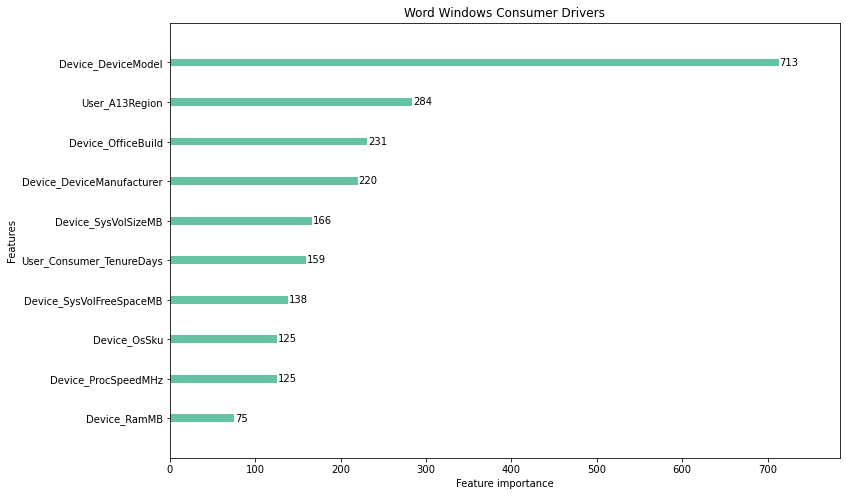

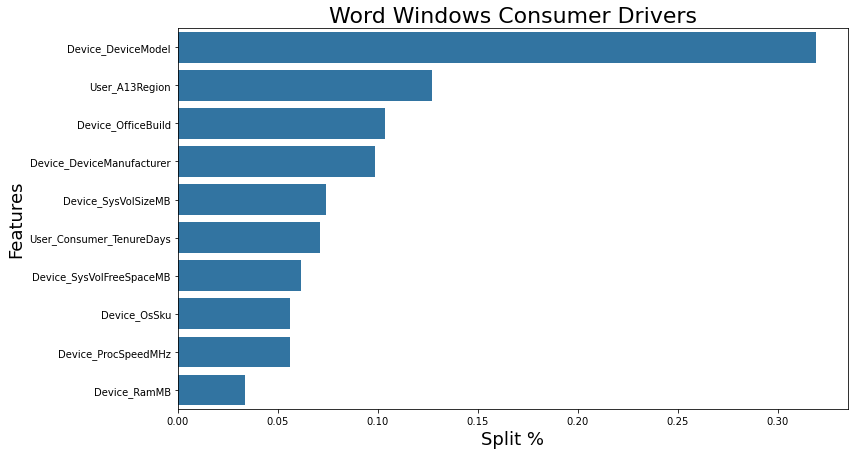

In [608]:
word_windows_consumer_drivers = driver_analysis.find_drivers(word_windows_consumer, 'Word Windows Consumer Drivers')

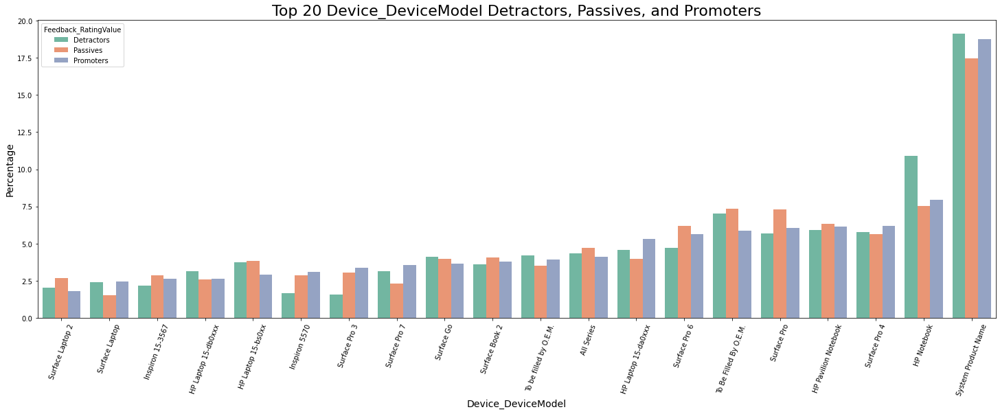

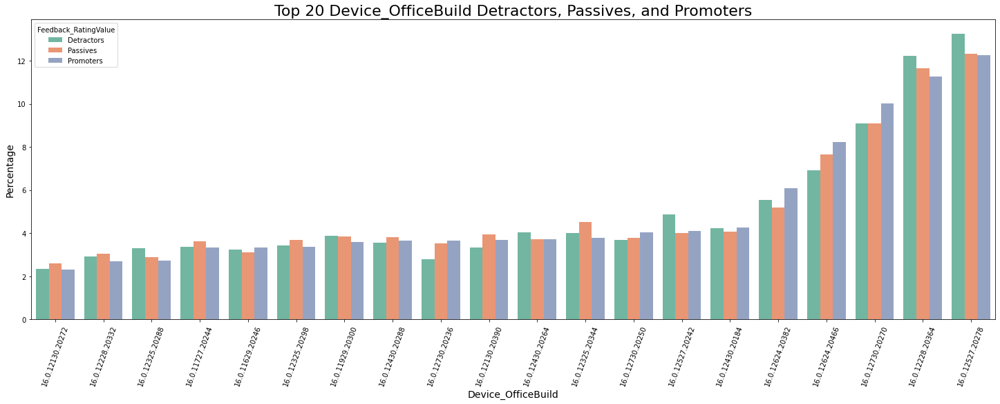

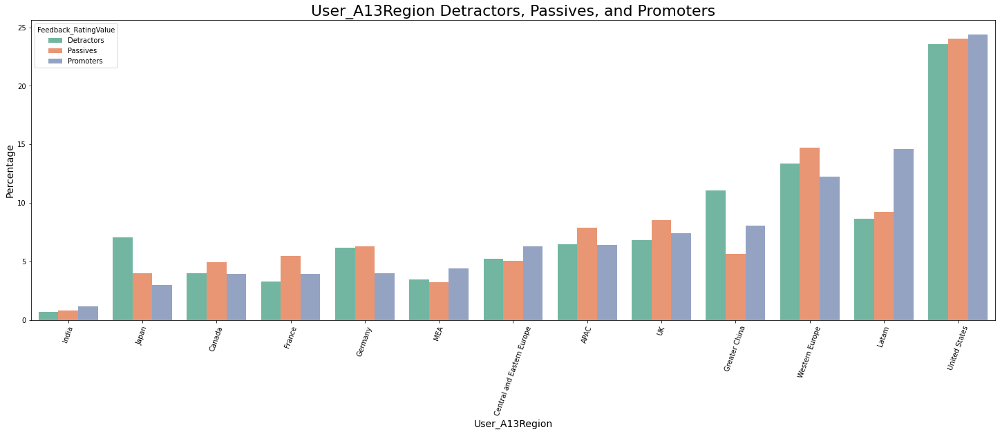

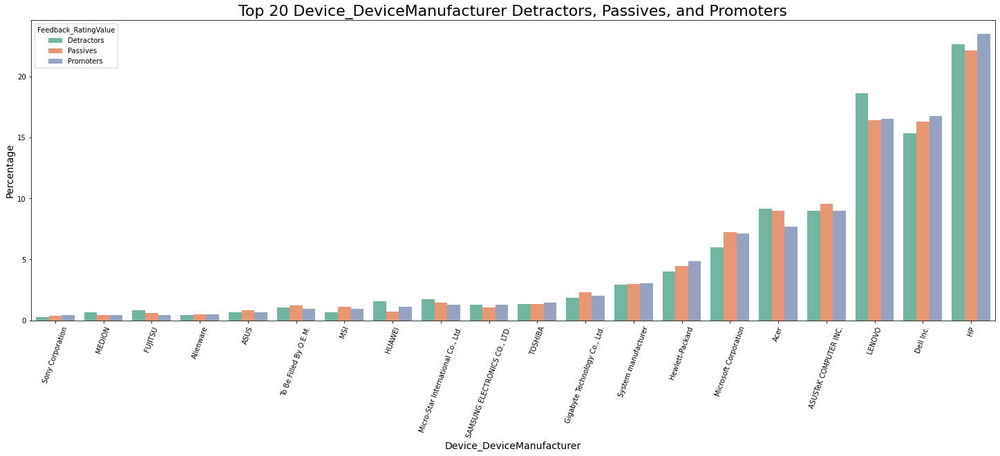

In [625]:
driver_analysis.plot_promoter_and_detractor_percentages(word_windows_consumer_drivers)

### Word Windows Commercial Edu NPS Profile

Shape before: (28294, 252)
Shape after throwing out useless features: (28294, 162)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  8.6min remaining:  1.9min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  8.7min remaining:   33.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  9.0min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   45.7s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  2.1min remaining:   27.8s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  2.2min remaining:    8.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.3min finished


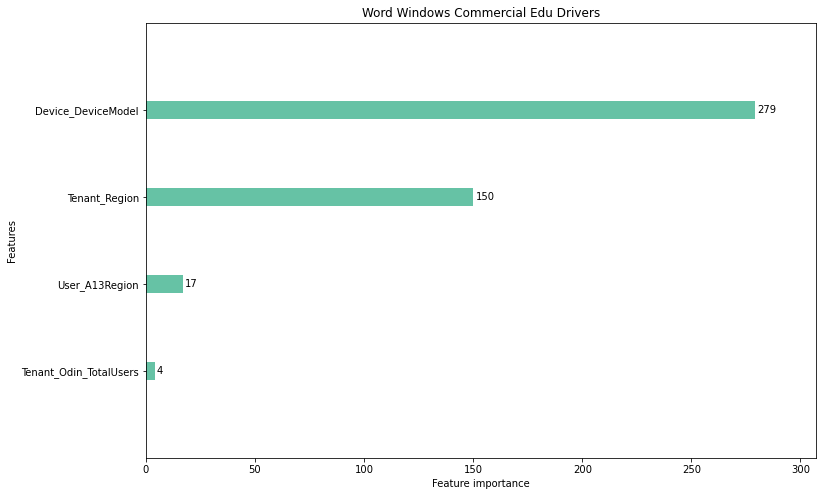

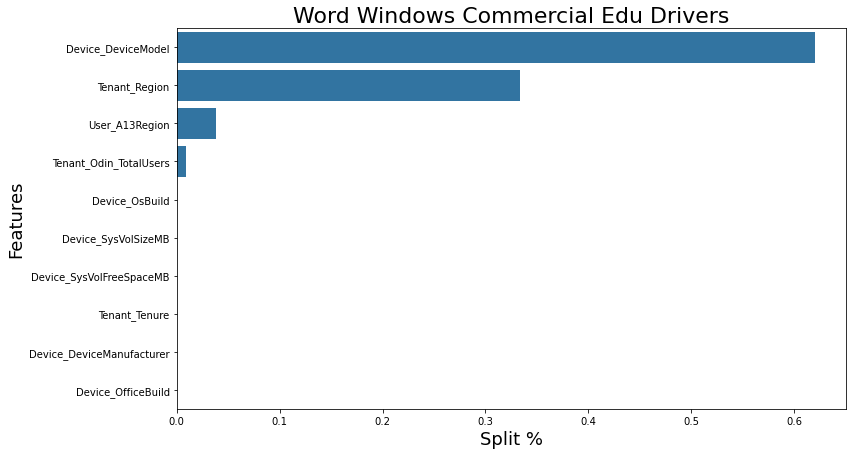

In [609]:
word_windows_comedu_drivers = driver_analysis.find_drivers(word_windows_comedu, 'Word Windows Commercial Edu Drivers')

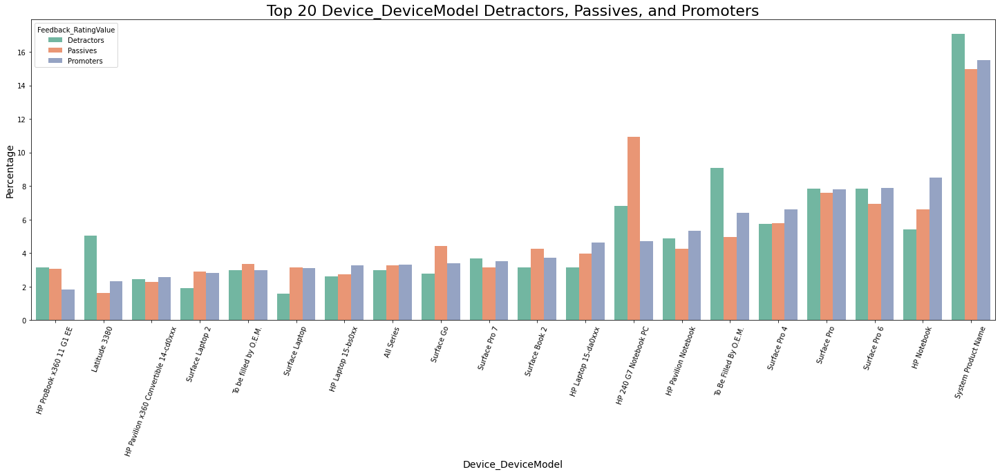

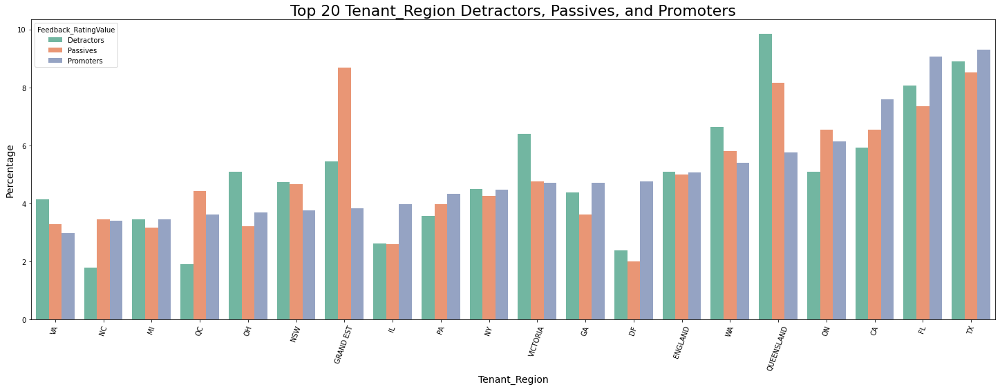

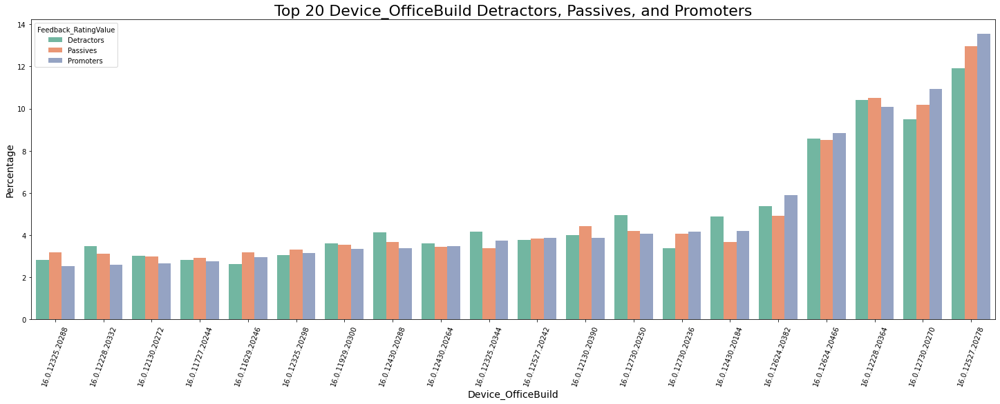

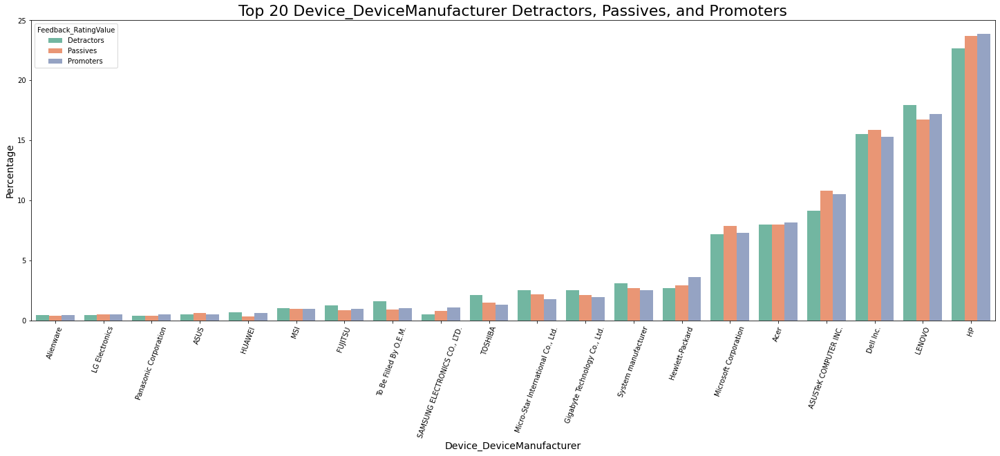

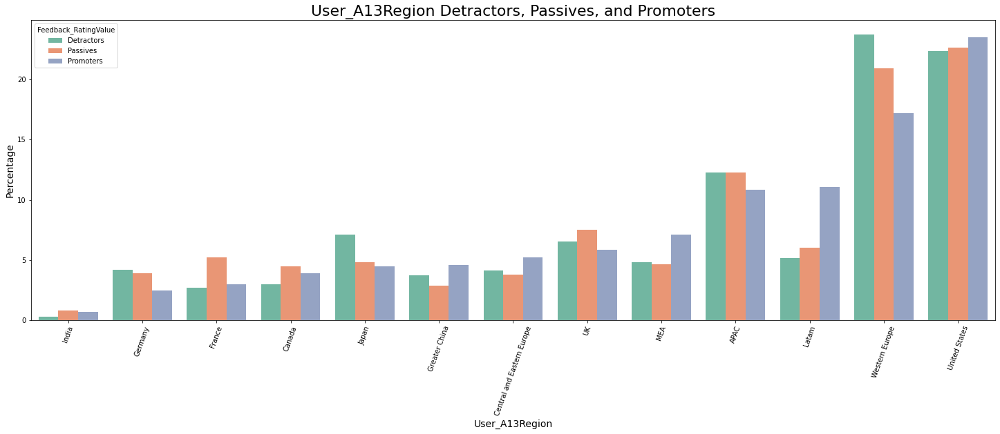

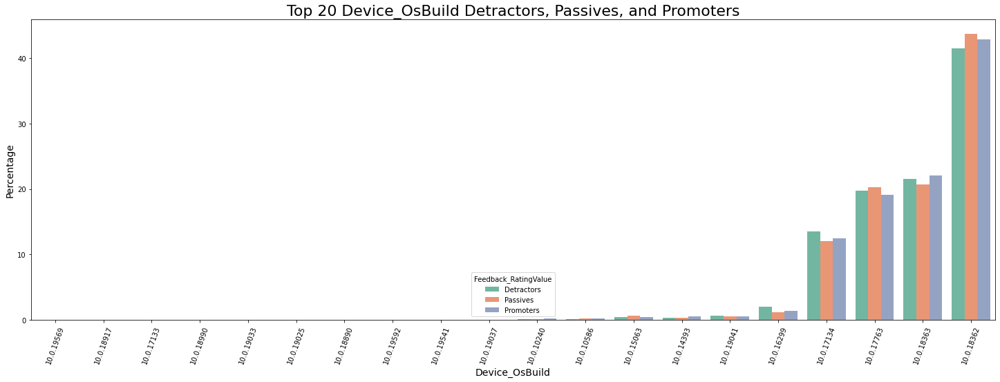

In [626]:
driver_analysis.plot_promoter_and_detractor_percentages(word_windows_comedu_drivers)

### Word Windows Commercial Non-Edu NPS Profile

Shape before: (27167, 251)
Shape after throwing out useless features: (27167, 162)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 11.2min remaining:  2.5min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 11.7min remaining:   44.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 11.8min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   44.5s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   47.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  2.0min remaining:   25.9s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  2.2min remaining:    8.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  2.2min finished


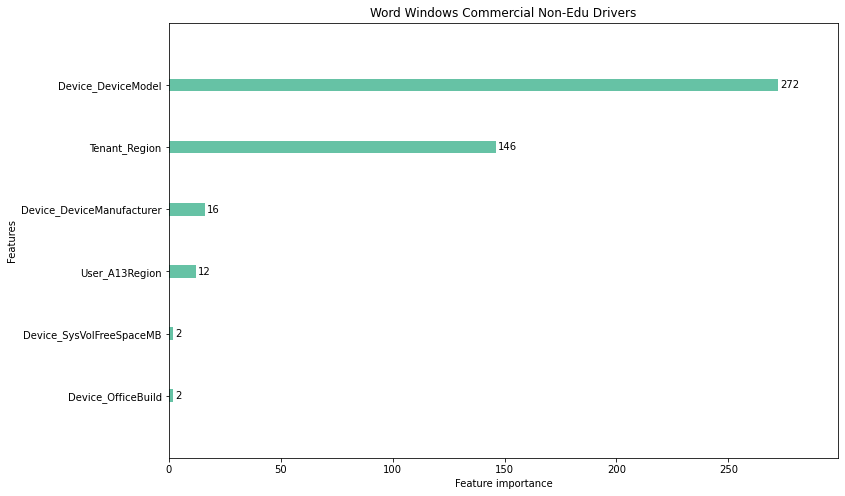

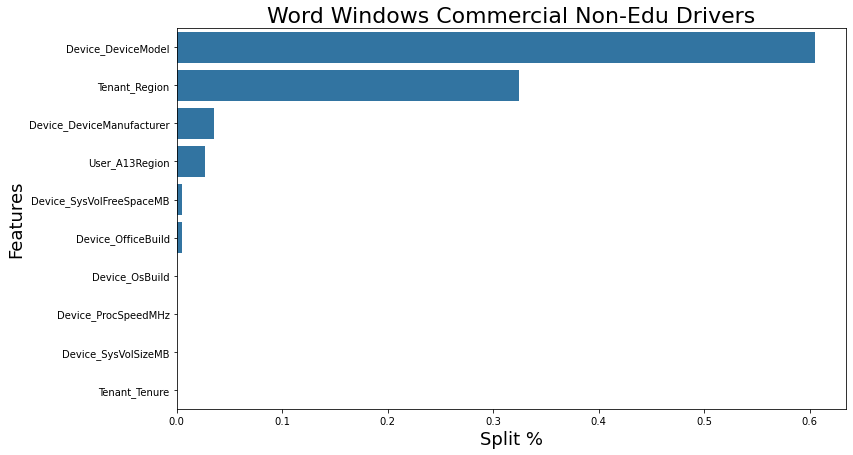

In [610]:
word_windows_nonedu_drivers = driver_analysis.find_drivers(word_windows_nonedu, 'Word Windows Commercial Non-Edu Drivers')

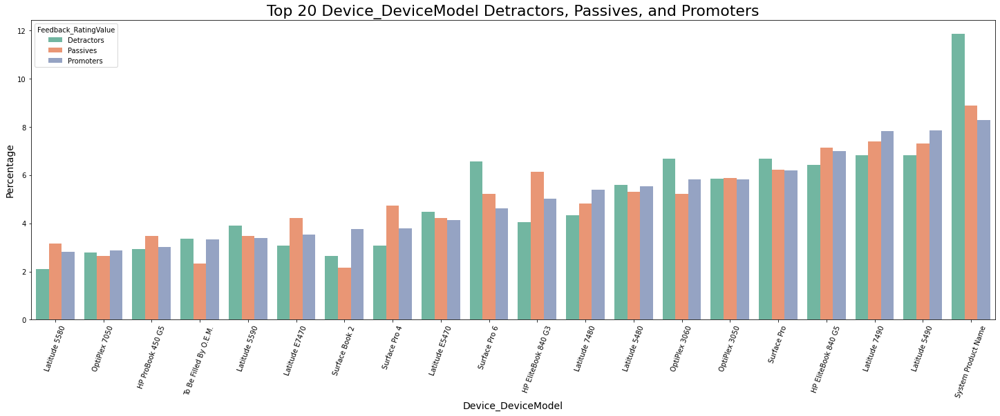

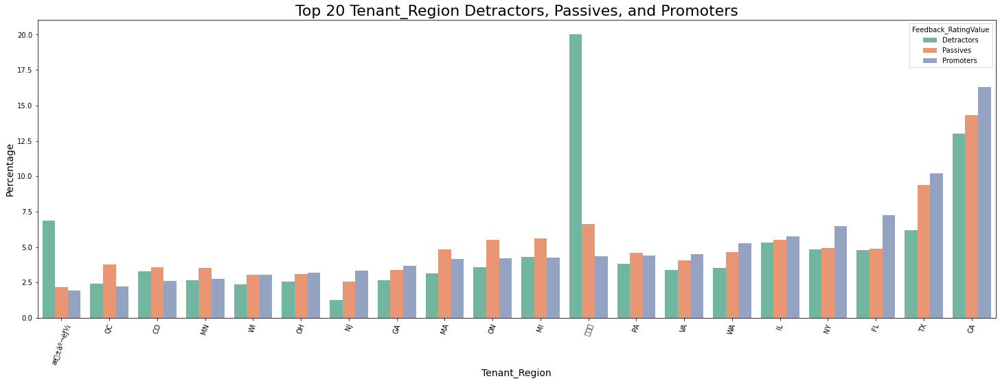

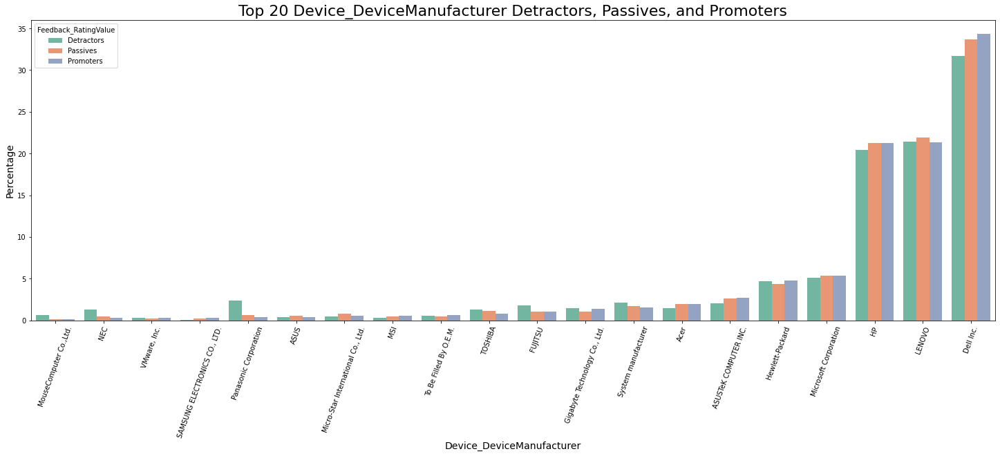

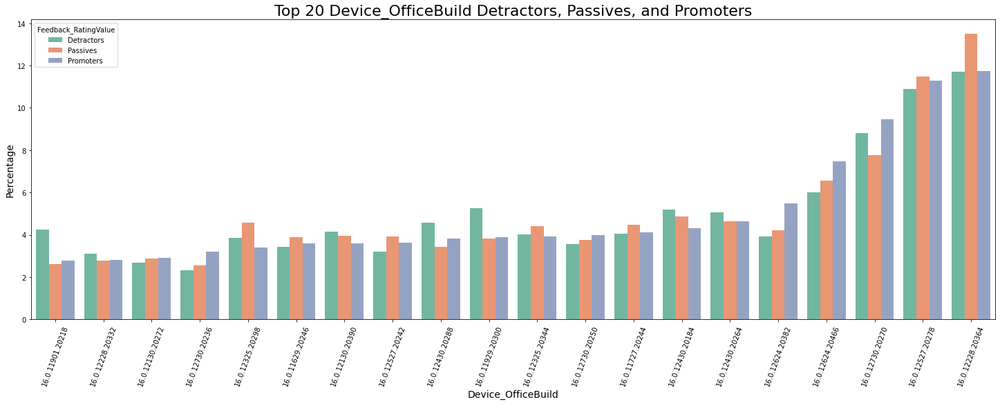

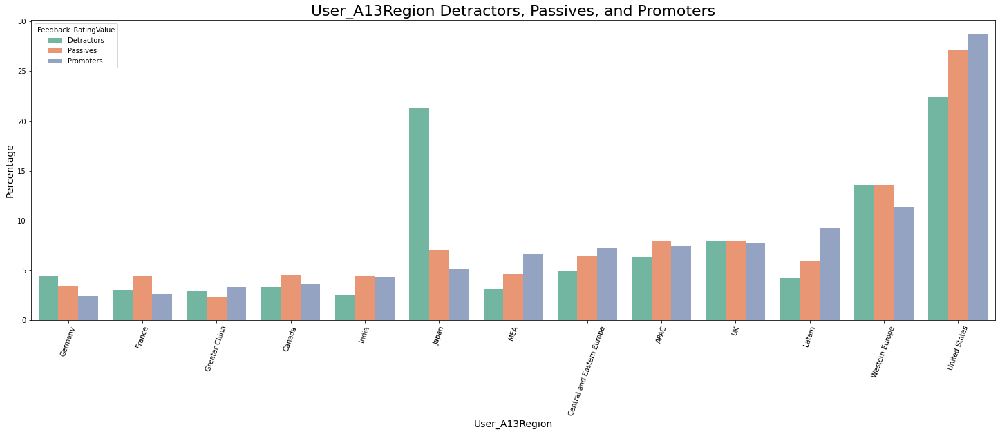

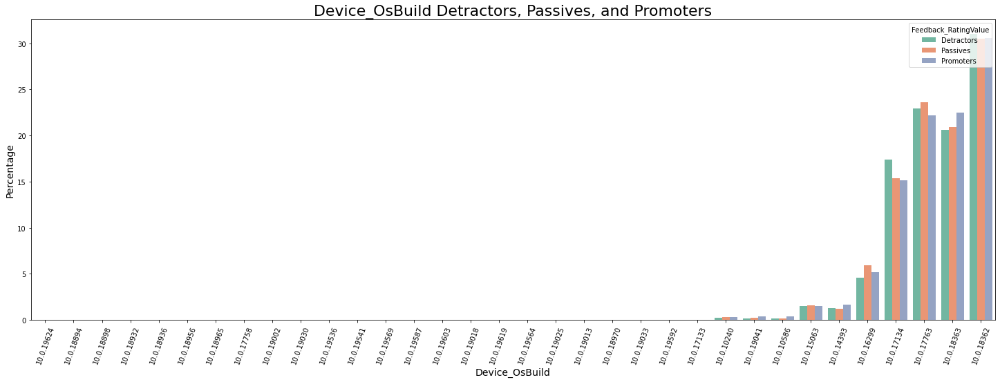

In [627]:
driver_analysis.plot_promoter_and_detractor_percentages(word_windows_nonedu_drivers)

# Suite

In [637]:
# get web and windows specific dfs
suite_web_consumer, suite_web_comedu, suite_web_nonedu, suite_windows_consumer, suite_windows_comedu, suite_windows_nonedu = \
                                                driver_analysis.web_and_windows_slicer('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Suite', 'Suite_Web_and_Windows.csv')

shape before deleting missing columns: (30305, 321)
shape after deleting missing columns: (30305, 39)
shape before deleting missing columns: (48675, 321)
shape after deleting missing columns: (48675, 240)
shape before deleting missing columns: (38608, 321)
shape after deleting missing columns: (38608, 241)
shape before deleting missing columns: (98396, 321)
shape after deleting missing columns: (98396, 74)
shape before deleting missing columns: (56523, 321)
shape after deleting missing columns: (56523, 252)
shape before deleting missing columns: (105973, 321)
shape after deleting missing columns: (105973, 253)


In [338]:
suite_nps_dfs = driver_analysis.get_detractors_and_promoters('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Suite', 'Suite_Windows.csv')

shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (0, 321)
shape after deleting missing columns: (0, 321)
shape before deleting missing columns: (98003, 321)
shape after deleting missing columns: (98003, 74)
shape before deleting missing columns: (56270, 321)
shape after deleting missing columns: (56270, 252)
shape before deleting missing columns: (105425, 321)
shape after deleting missing columns: (105425, 253)


In [639]:
#read in whole df and run nps profile on windows and web
suite = driver_analysis.read_entire_csv('C:\\Users\\fulto\\Desktop\\Driver Analysis\\Suite', 'Suite_Web_and_Windows.csv')
suite_web = suite[suite['Feedback_Platform'].str.contains('Windows')]
suite_windows= suite[suite['Feedback_Platform'].str.contains('Web')]

shape before deleting missing columns: (378483, 321)
shape after deleting missing columns: (378483, 261)


## Suite Windows NPS Profile

In [646]:
suite_windows_drivers = driver_analysis.find_drivers(suite_windows, 'Suite Windows Drivers')

Shape before: (117591, 260)
Shape after throwing out useless features: (117591, 169)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   21.7s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   26.1s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:   28.2s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 10.4min remaining:  2.3min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 10.4min remaining:   39.6s


MemoryError: Unable to allocate 30.0 MiB for an array with shape (167, 23519) and data type float64

### Suite Windows Consumer NPS Profile

Shape before: (98003, 73)
Shape after throwing out useless features: (98003, 43)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    9.7s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   28.6s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  4.1min remaining:   53.4s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.6min remaining:   17.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.8min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   28.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  4.2min remaining:   55.4s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.4min remaining:   16.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.6min finished


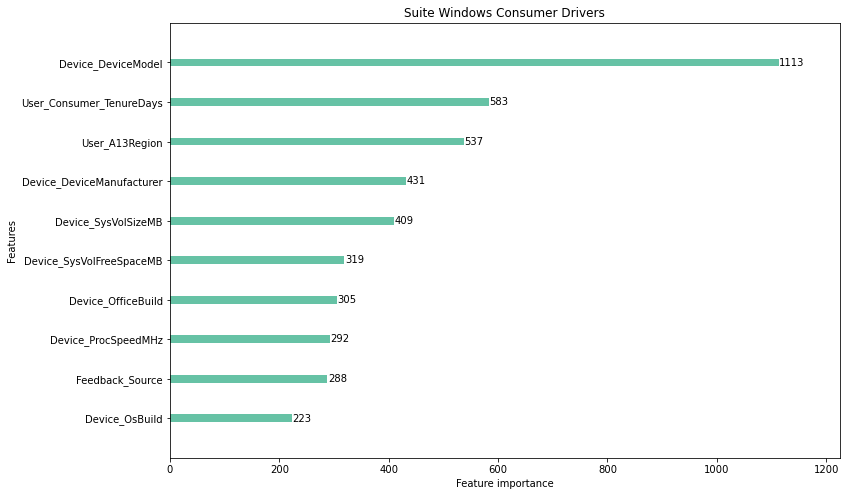

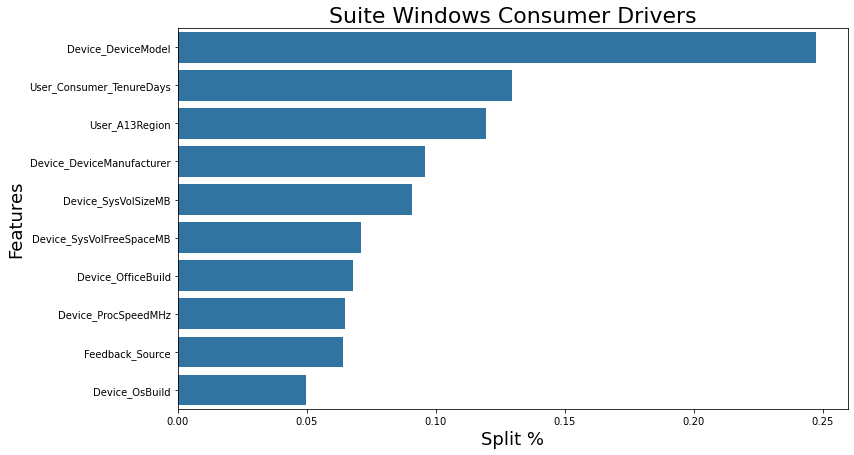

In [611]:
suite_windows_consumer_drivers = driver_analysis.find_drivers(suite_windows_consumer, 'Suite Windows Consumer Drivers')

### Suite Windows Commercial Edu NPS Profile

Shape before: (56270, 251)
Shape after throwing out useless features: (56270, 162)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 11.1min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 25.0min remaining:  5.5min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 33.1min remaining:  2.1min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 33.4min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   47.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  5.0min remaining:  1.1min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  5.4min remaining:   20.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  5.5min finished


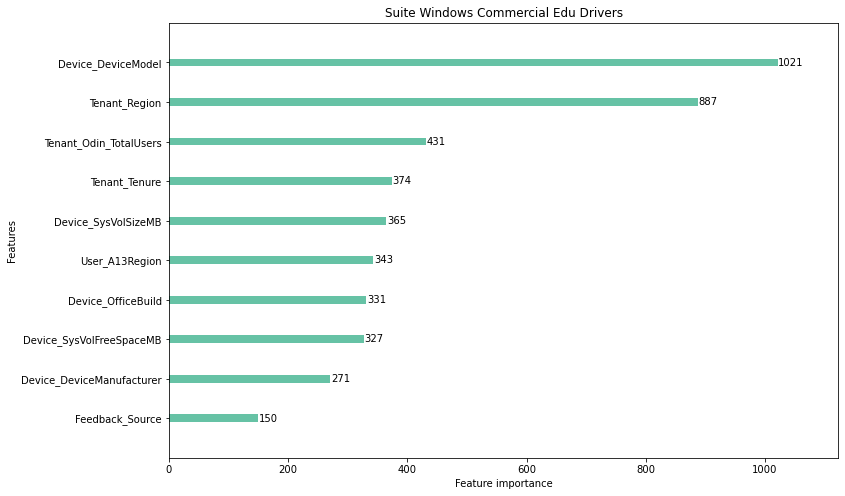

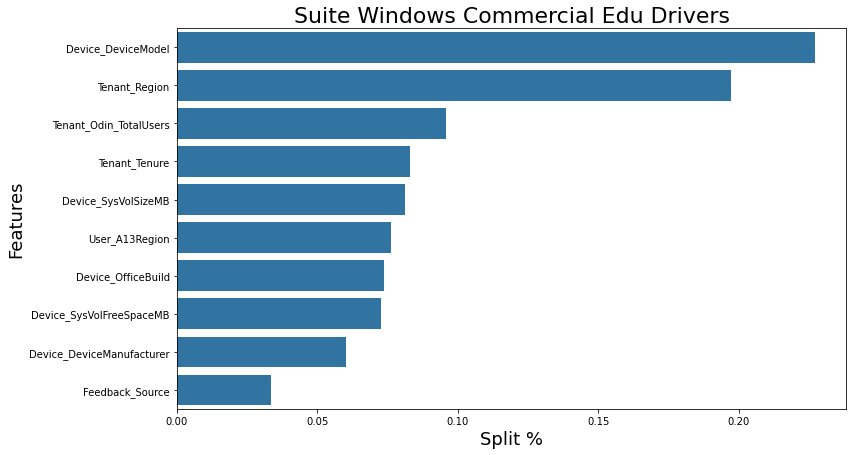

In [628]:
suite_windows_comedu_drivers = driver_analysis.find_drivers(suite_windows_comedu, 'Suite Windows Commercial Edu Drivers')

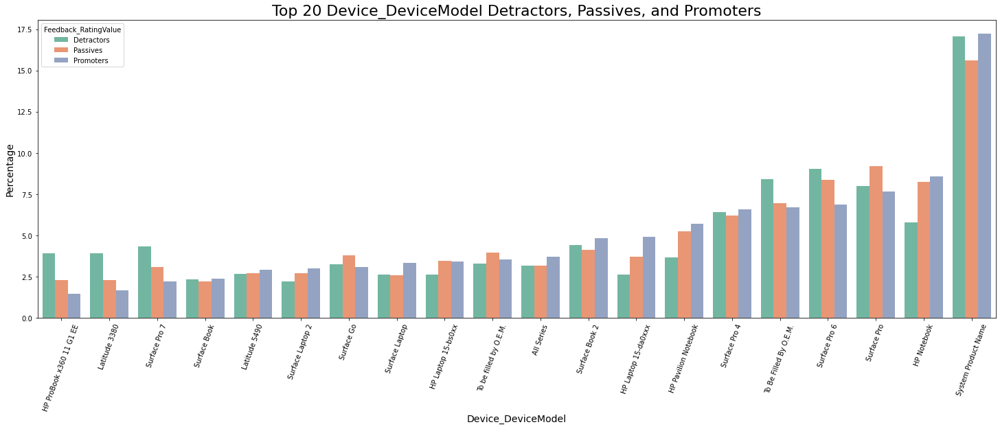

C:\Users\fulto\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 26481 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\fulto\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 20140 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\fulto\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 37117 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\fulto\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:183: RuntimeWarning: Glyph 26481 missing from current font.
  font.set_text(s, 0, flags=flags)
C:\Users\fulto\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:183: RuntimeWarning: Glyph 20140 missing from current font.
  font.set_text(s, 0, flags=flags)
C:\Users\fulto\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:183: RuntimeWarning: Glyph 37117 missing from curre

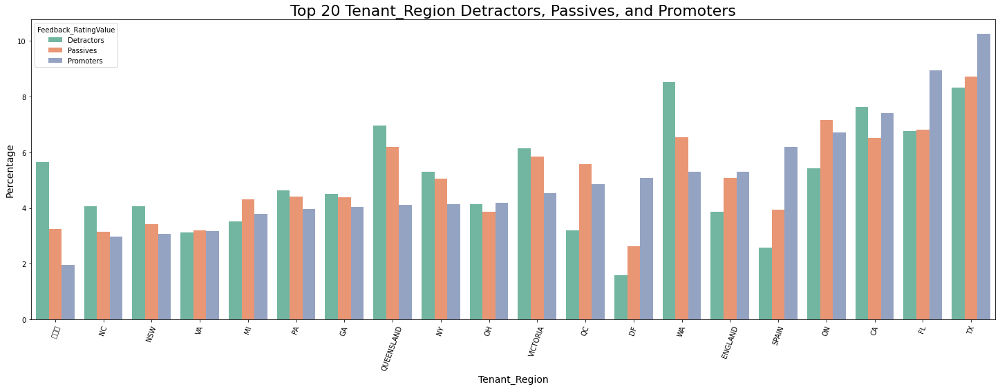

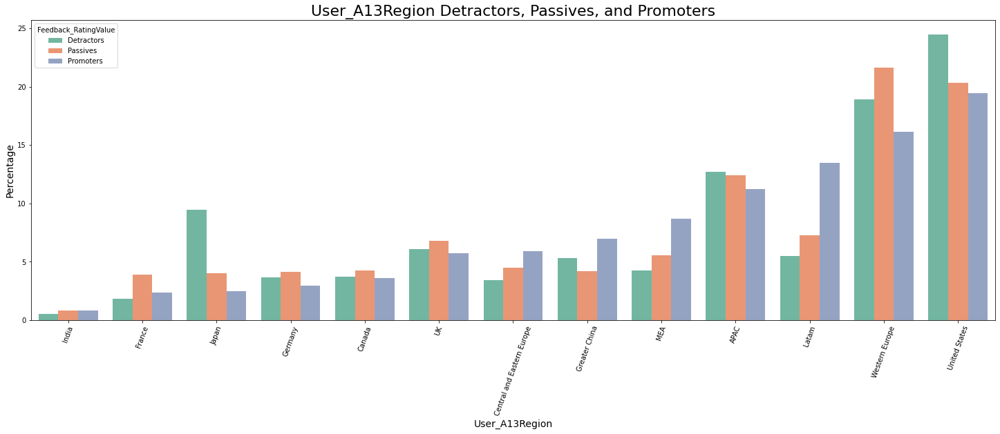

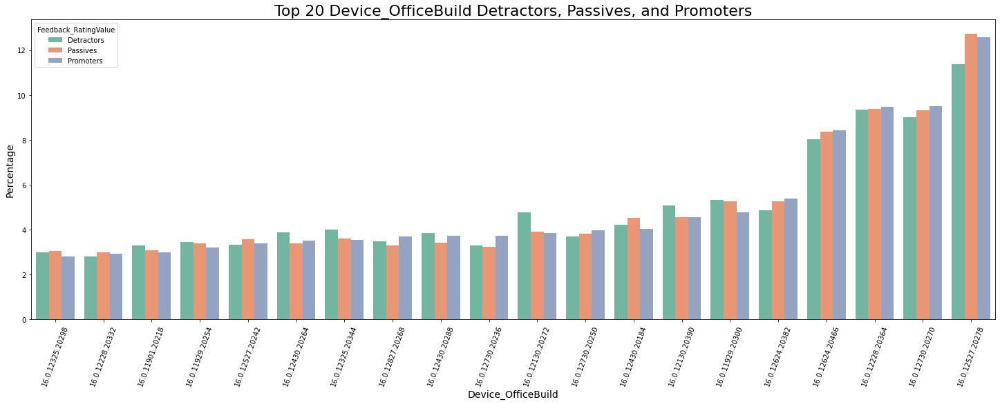

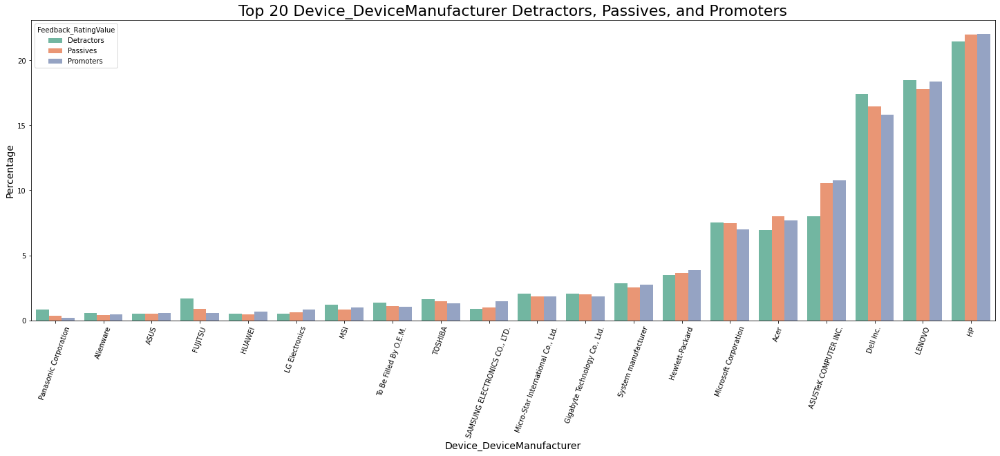

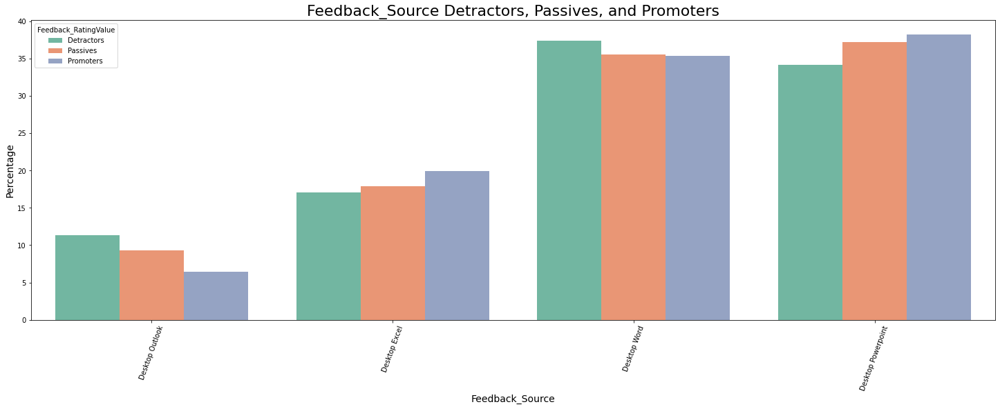

In [629]:
driver_analysis.plot_promoter_and_detractor_percentages(suite_windows_comedu_drivers)

### Suite Windows Commercial Non-Edu NPS Profile

Shape before: (105425, 252)
Shape after throwing out useless features: (105425, 162)
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   44.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  7.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed: 21.0min remaining:  4.6min
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed: 22.7min remaining:  1.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed: 25.1min finished


Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   49.4s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done  41 out of  50 | elapsed:  3.3min remaining:   43.7s
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:  4.2min remaining:   16.0s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  4.4min finished


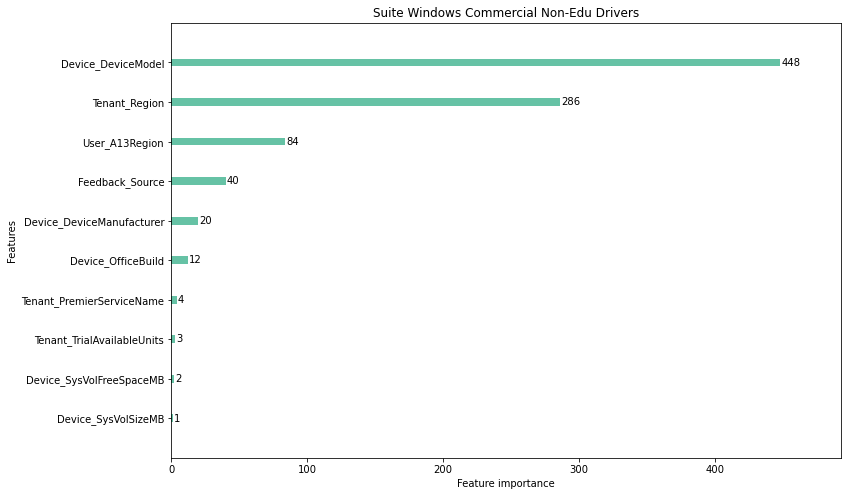

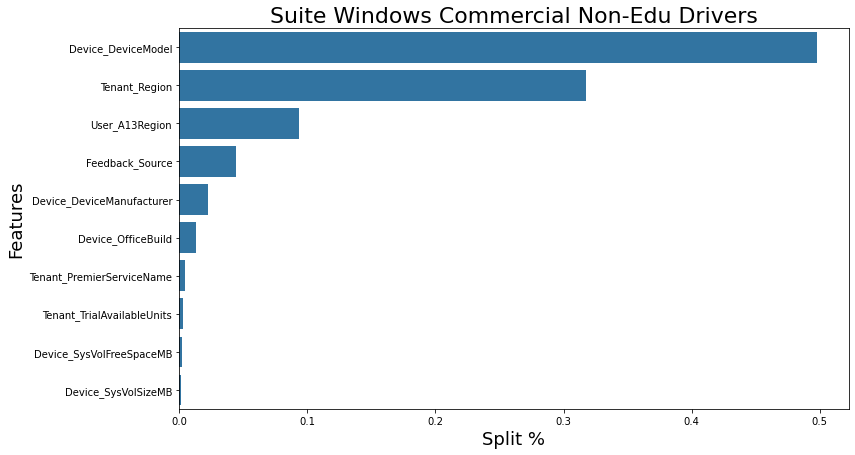

In [614]:
suite_windows_nonedu_drivers = driver_analysis.find_drivers(suite_windows_nonedu, 'Suite Windows Commercial Non-Edu Drivers')

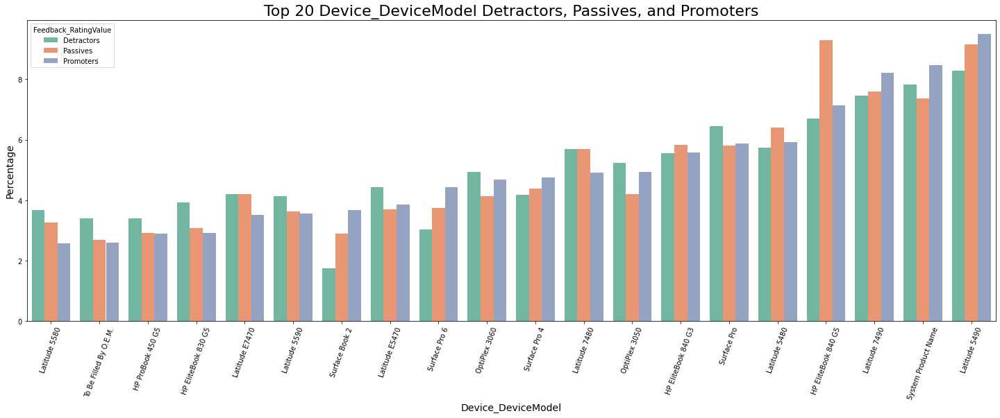

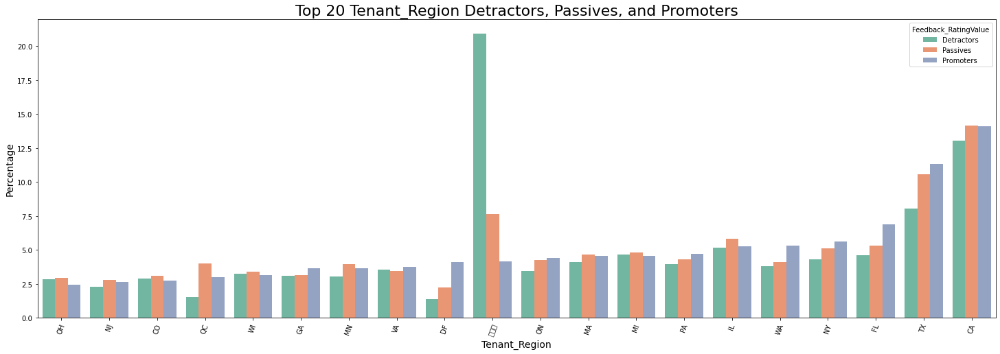

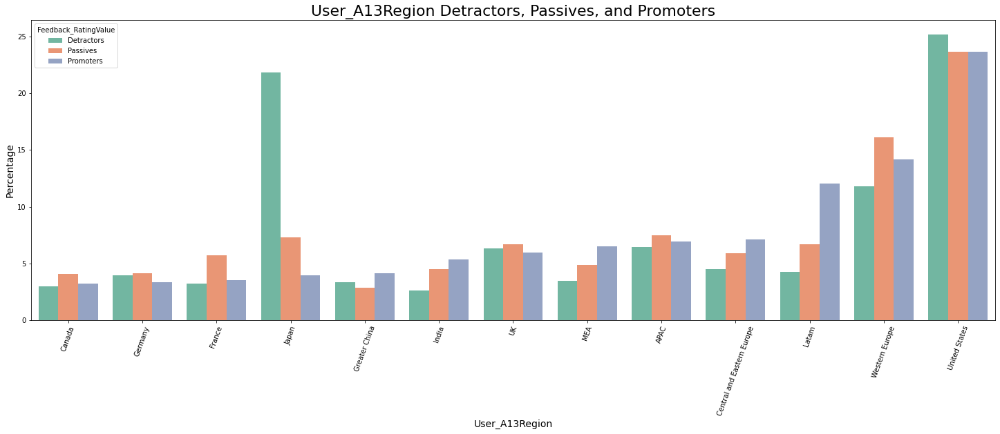

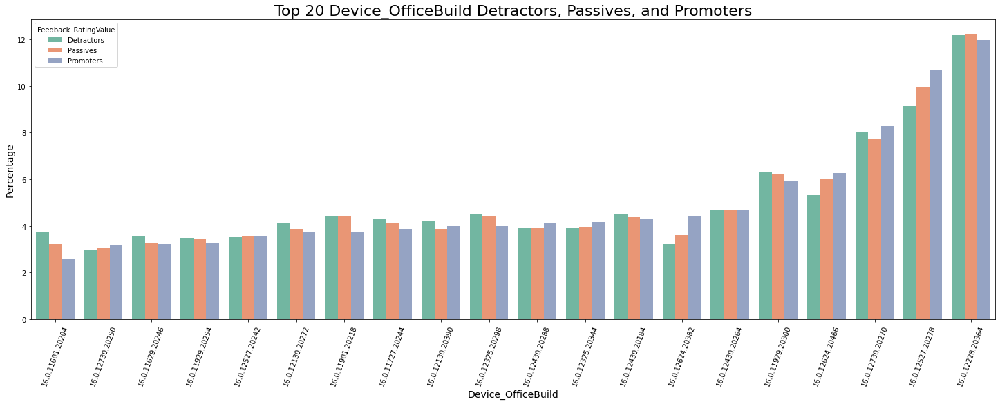

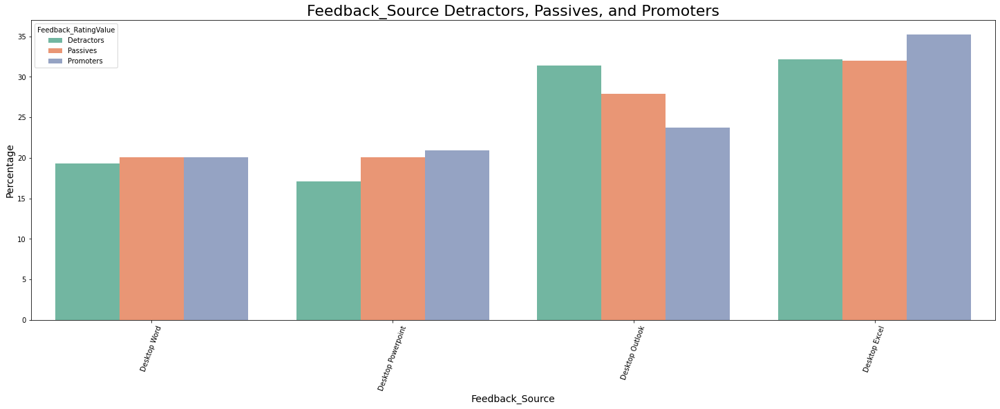

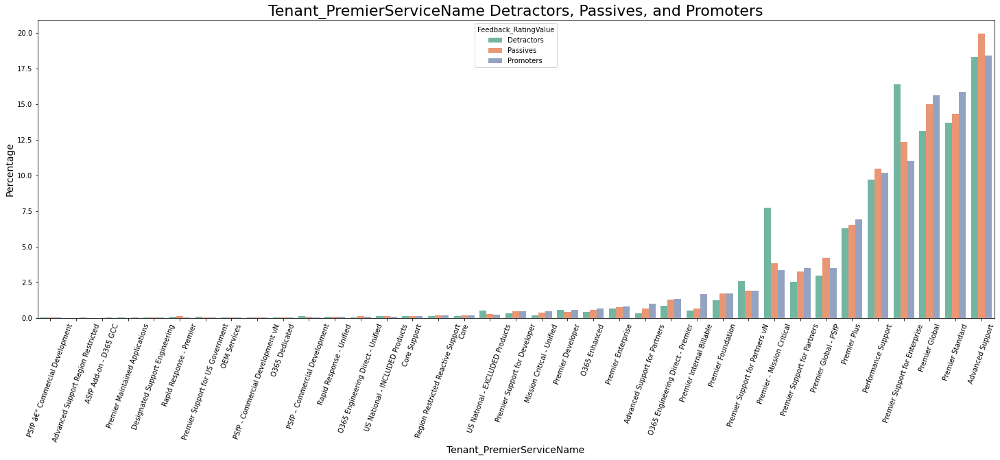

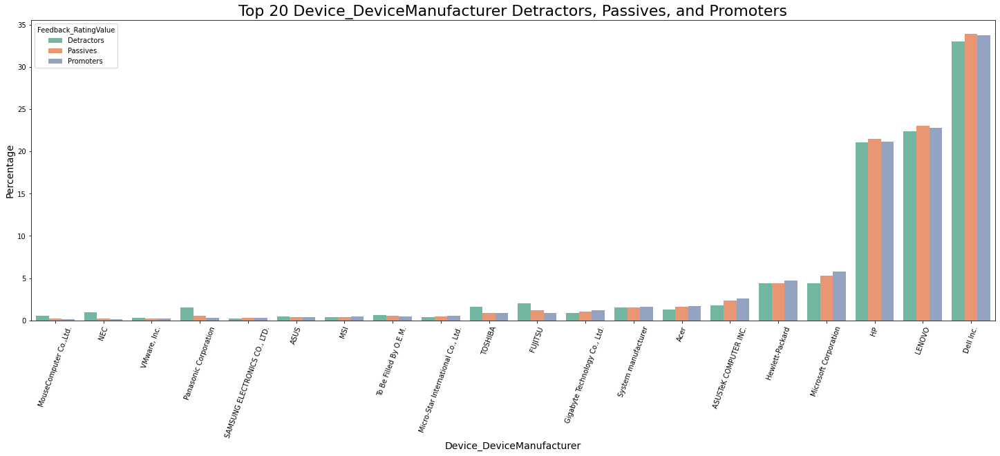

In [630]:
driver_analysis.plot_promoter_and_detractor_percentages(suite_windows_nonedu_drivers)

# Driver Analysis
- just do this is one fell swoop with a list comprehension
- This code executes the entire driver analysis on all of the datasets that we just pulled above, these datasets can be extracted from kusto using variations of the query included at the beginning of this document. Really, all that we did here was place the data frames into a list, create titles for all of our feature importance plots, and then create models to extract the top 10 features or "Drivers" for each data set, then plot them. We will get back a list of dataframes that are the top 10 features for each individual segment of this analysis. For example, the "outlook_windows_consumer_drivers" data frame in the list below will now be simply the top 10 features, as determined by the gradient boosting algorithm, plus the NPS score for each case, thats it, all other variables that were included in that data frame previously will be excluded. Each dataframe will be created the same way, that way we can then plot the categorical and numeric veriables once we are finished plotting the feature importances by split %. 

In [429]:
# #this is a list of all of the data frames that we read in above
# dfs = [outlook_windows_consumer_drivers, outlook_windows_comedu_drivers]
       
# #        outlook_windows_nonedu_drivers, excel_web_consumer, excel_web_comedu, 
# #        excel_web_nonedu, excel_windows_consumer, excel_windows_comedu, excel_windows_nonedu, pp_web_consumer, pp_web_comedu, pp_web_nonedu, 
# #        pp_windows_consumer, pp_windows_comedu, pp_windows_nonedu, teams_web_comedu, teams_web_nonedu, teams_windows_comedu, teams_windows_nonedu,
# #       word_web_consumer, word_web_comedu, word_web_nonedu, word_windows_consumer, word_windows_comedu, word_windows_nonedu, suite_windows_consumer,
# #       suite_windows_comedu, suite_windows_nonedu]

# #these are just a list of plot names that I will pass to the function below
# plot_names = ['Outlook Windows Consumer Drivers', 'Outlook Windows Commercial Edu Drivers']
              
# #               'Outlook Windows Commercial Non-Edu Drivers',
# #              'Excel Web Consumer Drivers', 'Excel Web Commercial Edu Drivers', 'Excel Web Commercial Non-Edu Drivers', 'Excel Windows Consumer Drivers',
# #              'Excel Windows Commercial Edu Drivers', 'Excel Windows Commercial Non-Edu Drivers', 'Powerpoint Web Consumer Drivers', 'Powerpoint Web Commercial Edu Drivers',
# #              'Powerpoint Web Commercial Non-Edu Drivers', 'Powerpoint Windows Consumer Drivers', 'Powerpoint Windows Commercial Edu Drivers',
# #              'Powerpoint Windows Commercial Non-Edu Drivers', 'Teams Web Commercial Edu Drivers', 'Teams Web Commercial Non-Edu Drivers', 'Teams Windows Commercial Edu Drivers',
# #              'Teams Windows Commercial Non-Edu Drivers', 'Word Web Consumer Drivers', 'Word Web Commercial Edu Drivers', 'Word Web Commercial Non-Edu Drivers',
# #              'Word Windows Consumer Drivers', 'Word Windows Commercial Edu Drivers', 'Word Windows Commercial Non-Edu Drivers', 'Suite Windows Consumer Drivers',
# #              'Suite Windows Commercial Edu Drivers', 'Suite Windows Commercial Non-Edu Drivers']

# #this loop will execute the modeling and complete driver analysis for each data set, with plots at the end
# [driver_analysis.find_drivers(df, 'a') for df in dfs]